In [47]:
import numpy as np
import matplotlib.pyplot as plt
import random
from collections import deque


In [48]:
# Environment dimensions
AREA_WIDTH = 600
AREA_HEIGHT = 600

# Sensor and MC Parameters
NUM_SENSORS = 20
SENSOR_CAPACITY = 6000  # Joules
MC_CAPACITY = 1000000   # Joules
MC_SPEED = 5  # m/s
CHARGING_RATE = 20  # Joules per second
MOVEMENT_COST_PER_M = 5  # Joules per meter
THRESHOLD_RATIO = 0.2    # Time window opens when energy < 20% of capacity
CHARGING_RADIUS = 50     # Radius in meters within which MC can charge multiple nodes

In [49]:
class SensorNode:
    def __init__(self, node_id, x, y):
        self.id = node_id
        self.x = x
        self.y = y
        self.capacity = SENSOR_CAPACITY
        self.energy = random.uniform(0.1, 1.4) * SENSOR_CAPACITY  # low enough to trigger window
        self.consumption_rate = random.uniform(0.5, 2.0)  # J/s
        self.dead = False
    
    def get_location(self):
        return (self.x, self.y)

    def update_energy(self, seconds):
        if not self.dead:
            self.energy -= self.consumption_rate * seconds
            if self.energy <= 0:
                self.energy = 0
                self.dead = True

    def needs_charging(self):
        return self.energy < (THRESHOLD_RATIO * self.capacity) and not self.dead

    def charge(self, amount):
        if not self.dead:
            self.energy += amount
            if self.energy > self.capacity:
                self.energy = self.capacity


In [50]:
class MobileCharger:
    def __init__(self, base_x=300, base_y=300):
        self.x = base_x
        self.y = base_y
        self.energy = MC_CAPACITY
        self.start_pos = (base_x, base_y)

    def move_to(self, x, y):
        distance = np.linalg.norm([self.x - x, self.y - y])
        cost = distance * MOVEMENT_COST_PER_M
        if self.energy < cost:
            return False  # not enough energy to move
        self.x, self.y = x, y
        self.energy -= cost
        return True

    def charge_node(self, node):
        if self.energy <= 0 or node.dead:
            return 0
        needed = node.capacity - node.energy
        energy_to_transfer = min(needed, self.energy)
        node.charge(energy_to_transfer)
        self.energy -= energy_to_transfer
        return energy_to_transfer
        
    def charge_nodes_in_radius(self, sensors):
        """
        Charge all sensor nodes within the charging radius using zone-based charging efficiency
        
        Zones:
        - Inner zone (0-40% of radius): 70% efficiency
        - Middle zone (40-70% of radius): 50% efficiency
        - Outer zone (70-100% of radius): 30% efficiency
        """
        charged_nodes = []
        total_energy_transferred = 0
        
        if self.energy <= 0:
            return charged_nodes, 0
            
        # Find sensors within the charging radius that need charging
        for sensor in sensors:
            if sensor.dead:
                continue
                
            distance = np.linalg.norm([self.x - sensor.x, self.y - sensor.y])
            
            if distance <= CHARGING_RADIUS and sensor.energy < sensor.capacity:
                # Determine charging zone and efficiency
                distance_ratio = distance / CHARGING_RADIUS
                
                if distance_ratio <= 0.4:  # Inner zone
                    efficiency = 0.7  # 70% efficiency
                elif distance_ratio <= 0.7:  # Middle zone
                    efficiency = 0.5  # 50% efficiency
                else:  # Outer zone
                    efficiency = 0.3  # 30% efficiency
                    
                # Calculate energy to transfer
                needed = sensor.capacity - sensor.energy
                max_transfer = min(needed, self.energy)
                energy_to_transfer = max_transfer * efficiency
                
                if energy_to_transfer > 0:
                    sensor.charge(energy_to_transfer)
                    self.energy -= energy_to_transfer
                    total_energy_transferred += energy_to_transfer
                    charged_nodes.append(sensor.id)
                    
                    if self.energy <= 0:
                        break
                        
        return charged_nodes, total_energy_transferred

In [51]:
def initialize_environment(num_sensors=NUM_SENSORS):
    sensors = []
    for i in range(num_sensors):
        x = random.uniform(0, AREA_WIDTH)
        y = random.uniform(0, AREA_HEIGHT)
        sensors.append(SensorNode(i, x, y))
    mc = MobileCharger()
    return sensors, mc


In [52]:
def plot_environment(sensors, mc):
    alive_x = [s.x for s in sensors if not s.dead]
    alive_y = [s.y for s in sensors if not s.dead]
    dead_x = [s.x for s in sensors if s.dead]
    dead_y = [s.y for s in sensors if s.dead]

    plt.figure(figsize=(8, 8))
    plt.scatter(alive_x, alive_y, c='green', label='Alive Sensors')
    plt.scatter(dead_x, dead_y, c='red', label='Dead Sensors')
    plt.scatter(mc.x, mc.y, c='blue', label='Mobile Charger (MC)', marker='X', s=100)
    plt.scatter(300, 300, c='black', label='Base Station', marker='s')
    
    # Draw charging radius
    circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, color='blue', fill=False, linestyle='--', alpha=0.5)
    plt.gcf().gca().add_artist(circle)
    
    # Highlight nodes in charging range
    in_range_x = []
    in_range_y = []
    for s in sensors:
        if not s.dead:
            distance = np.linalg.norm([mc.x - s.x, mc.y - s.y])
            if distance <= CHARGING_RADIUS:
                in_range_x.append(s.x)
                in_range_y.append(s.y)
    
    if in_range_x:
        plt.scatter(in_range_x, in_range_y, c='yellow', edgecolors='orange', 
                   label='In Charging Range', s=80, zorder=3)
    
    plt.legend()
    plt.title("WRSN Environment")
    plt.grid(True)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.show()

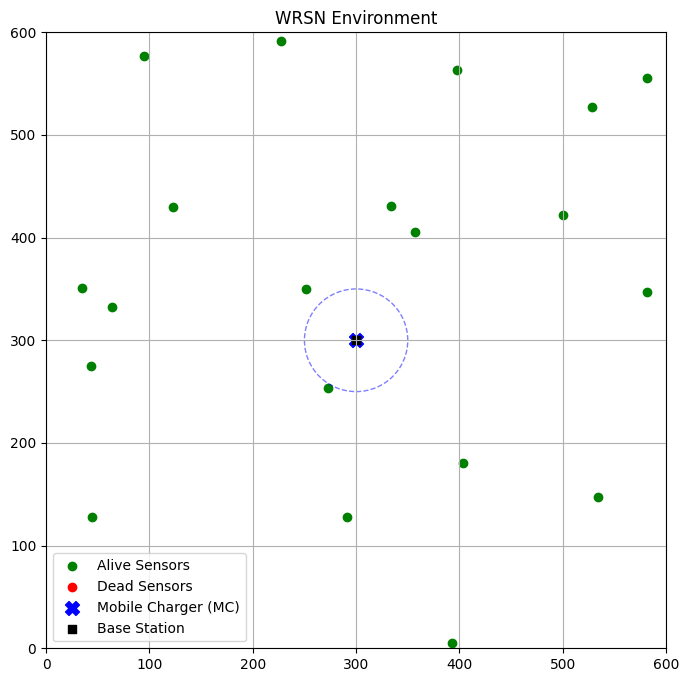

In [53]:
sensors, mc = initialize_environment()
plot_environment(sensors, mc)


In [54]:
def simulate_step(sensors, mc, time_step=10):
    # 1. Update energy of all sensors
    for s in sensors:
        s.update_energy(time_step)

    # 2. Filter sensors needing charging and still alive
    to_charge = [s for s in sensors if s.needs_charging()]
    if not to_charge:
        print("No sensor needs charging right now.")
        return False

    # 3. Select next sensor using greedy strategy (closest one)
    to_charge.sort(key=lambda s: np.linalg.norm([mc.x - s.x, mc.y - s.y]))
    target = to_charge[0]
    
    # 4. Move to sensor
    if not mc.move_to(target.x, target.y):
        print("MC does not have enough energy to move.")
        return False

    # 5. Charge all sensors within radius
    charged_nodes, total_energy = mc.charge_nodes_in_radius(sensors)
    
    if charged_nodes:
        print(f"Charged {len(charged_nodes)} sensors with total {total_energy:.2f} J")
        print(f"Sensor IDs charged: {charged_nodes}")
    else:
        print("No sensors were charged in this step.")

    return True

In [55]:
def simulate_step_adaptive(sensors, mc, time_step=10):
    """Simulation step using adaptive charging threshold"""
    # 1. Update energy of all sensors
    for s in sensors:
        s.update_energy(time_step)

    # 2. Get sensors needing charging using adaptive threshold
    to_charge = get_sensors_needing_charging(sensors, mc, adaptive_threshold=True)
    
    if not to_charge:
        print("No sensor needs charging right now.")
        return False

    # 3. Select the highest priority sensor (first in list)
    target = to_charge[0]
    
    # 4. Move to sensor
    if not mc.move_to(target.x, target.y):
        print("MC does not have enough energy to move.")
        return False

    # 5. Charge all sensors within radius
    charged_nodes, total_energy = mc.charge_nodes_in_radius(sensors)
    
    if charged_nodes:
        print(f"Charged {len(charged_nodes)} sensors with total {total_energy:.2f} J")
        print(f"Sensor IDs charged: {charged_nodes}")
    else:
        print("No sensors were charged in this step.")

    return True

In [56]:
def run_simulation(sensors, mc, max_steps=1000, time_step=10, visualize_every=50):
    for step in range(max_steps):
        print(f"--- Step {step} ---")
        result = simulate_step(sensors, mc, time_step)
        if not result:
            print("Simulation ended (MC depleted or no tasks).")
            break

        if step % visualize_every == 0:
            plot_environment(sensors, mc)

    # Final stats
    dead = sum(1 for s in sensors if s.dead)
    alive = NUM_SENSORS - dead
    print(f"Simulation Complete. Alive: {alive}, Dead: {dead}")
    print(f"MC remaining energy: {mc.energy:.2f} J")


In [57]:
def run_adaptive_simulation(sensors, mc, max_steps=1000, time_step=10, visualize_every=50):
    """Run simulation with adaptive charging threshold"""
    for step in range(max_steps):
        print(f"--- Step {step} ---")
        result = simulate_step_adaptive(sensors, mc, time_step)
        if not result:
            print("Simulation ended (MC depleted or no tasks).")
            break

        if step % visualize_every == 0:
            plot_environment(sensors, mc)

    # Final stats
    dead = sum(1 for s in sensors if s.dead)
    alive = len(sensors) - dead
    print(f"Simulation Complete. Alive: {alive}, Dead: {dead}")
    print(f"MC remaining energy: {mc.energy:.2f} J")

--- Step 0 ---
Charged 1 sensors with total 3778.04 J
Sensor IDs charged: [2]


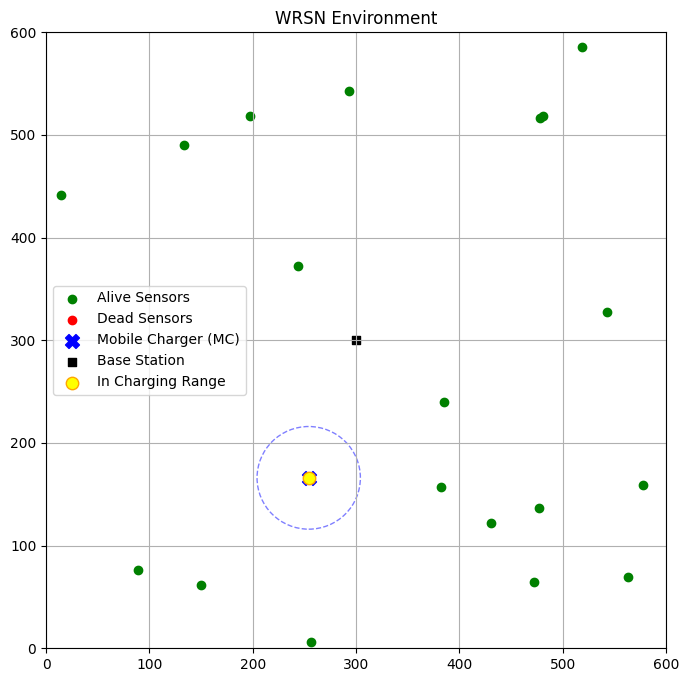

--- Step 1 ---
Charged 1 sensors with total 3407.49 J
Sensor IDs charged: [4]
--- Step 2 ---
Charged 2 sensors with total 3823.65 J
Sensor IDs charged: [0, 15]
--- Step 3 ---
No sensor needs charging right now.
Simulation ended (MC depleted or no tasks).
Simulation Complete. Alive: 20, Dead: 0
MC remaining energy: 986199.42 J


In [58]:
sensors, mc = initialize_environment()
run_simulation(sensors, mc, max_steps=200, time_step=15)


In [59]:
def get_state_vector(sensors, mc):
    state = []

    # 1. Global state: MC energy (normalized)
    mc_energy_ratio = mc.energy / MC_CAPACITY
    state.append(mc_energy_ratio)

    for s in sensors:
        # 2. Distance to the MC (normalized)
        distance = np.linalg.norm([mc.x - s.x, mc.y - s.y])
        max_dist = np.linalg.norm([AREA_WIDTH, AREA_HEIGHT])
        distance_norm = distance / max_dist

        # 3. Residual energy (normalized)
        energy_ratio = s.energy / s.capacity

        # 4. Time window status (1 if open)
        window_open = 1 if s.needs_charging() else 0

        # 5. Time left before death (normalized)
        if s.dead or s.consumption_rate == 0:
            time_left_ratio = 0
        else:
            time_left = s.energy / s.consumption_rate
            time_left_ratio = min(time_left / 1000, 1)  # cap to avoid large numbers

        # Append sensor state
        state += [distance_norm, energy_ratio, window_open, time_left_ratio]

    return np.array(state, dtype=np.float32)


In [60]:
sensors, mc = initialize_environment()
state = get_state_vector(sensors, mc)

print(f"State vector shape: {state.shape}")
print(f"Sample values:\n{state[:10]} ...")


State vector shape: (81,)
Sample values:
[1.         0.20850538 0.88807154 0.         1.         0.09758539
 0.43113926 0.         1.         0.46337125] ...


In [61]:
sensors, mc = initialize_environment()


In [62]:
def calculate_adaptive_priority(sensor, mc, alpha=0.4, beta=0.3, gamma=0.3):
    """
    Calculate adaptive priority score for a sensor based on multiple factors:
    - Energy level (lower energy = higher priority)
    - Consumption rate (higher rate = higher priority)
    - Distance from MC (shorter distance = higher priority)
    
    Parameters:
    - alpha: weight for energy level factor (0.0-1.0)
    - beta: weight for consumption rate factor (0.0-1.0)
    - gamma: weight for distance factor (0.0-1.0)
    
    Returns a priority score where lower values indicate higher priority
    """
    # Normalize energy level (lower energy = higher priority)
    energy_ratio = sensor.energy / sensor.capacity
    energy_factor = 1 - energy_ratio  # invert so lower energy = higher value
    
    # Normalize consumption rate (higher rate = higher priority)
    # Assuming consumption rates are between 0.1 and 2.0 J/s
    max_consumption_rate = 2.0
    consumption_factor = min(sensor.consumption_rate / max_consumption_rate, 1.0)
    
    # Normalize distance (shorter distance = higher priority)
    distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
    max_distance = np.sqrt(AREA_WIDTH**2 + AREA_HEIGHT**2)
    distance_factor = 1 - (distance / max_distance)  # invert so closer = higher value
    
    # Calculate urgency based on remaining time until death
    if sensor.consumption_rate > 0:
        time_to_death = sensor.energy / sensor.consumption_rate
        # Normalize: anything under 100 seconds is urgent, over 1000 seconds is not urgent
        urgency_factor = max(0, min(1, 1 - (time_to_death - 100) / 900))
    else:
        urgency_factor = 0
    
    # Combine factors with weights
    # We'll also add urgency as a multiplier to boost priority of sensors about to die
    priority = (alpha * energy_factor + 
                beta * consumption_factor + 
                gamma * distance_factor) * (1 + urgency_factor)
    
    return priority

def get_sensors_needing_charging(sensors, mc, adaptive_threshold=True, fixed_threshold_ratio=THRESHOLD_RATIO):
    """
    Get sensors needing charging, either using a fixed threshold or an adaptive approach.
    
    Parameters:
    - sensors: list of SensorNode objects
    - mc: MobileCharger object
    - adaptive_threshold: whether to use adaptive thresholds (True) or fixed (False)
    - fixed_threshold_ratio: ratio to use if using fixed threshold
    
    Returns list of sensors that need charging, sorted by priority
    """
    if not adaptive_threshold:
        # Original approach: fixed threshold
        to_charge = [s for s in sensors if s.needs_charging()]
        # Sort by distance (closest first)
        to_charge.sort(key=lambda s: np.linalg.norm([mc.x - s.x, mc.y - s.y]))
        return to_charge
    
    # Adaptive approach:
    # Calculate priority for all sensors
    sensor_priorities = []
    for sensor in sensors:
        if sensor.dead:
            continue
            
        # Calculate priority score
        priority = calculate_adaptive_priority(sensor, mc)
        
        # Add to list if priority exceeds minimum threshold
        # Higher energy sensors might still be charged if they're very close and 
        # have high consumption rate
        min_priority_threshold = 0.15  # Only consider sensors with some level of need
        if priority > min_priority_threshold:
            sensor_priorities.append((sensor, priority))
    
    # Sort by priority (highest first)
    sensor_priorities.sort(key=lambda x: x[1], reverse=True)
    
    # Return just the sensors in priority order
    return [s for s, _ in sensor_priorities]

In [63]:
def get_valid_actions(sensors, mc):
    actions = []
    for i, sensor in enumerate(sensors):
        if sensor.needs_charging() and not sensor.dead:
            actions.append(i)
    actions.append(NUM_SENSORS)  # action to return to base
    return actions


In [64]:
def explain_action(action):
    if action == NUM_SENSORS:
        return "Return to base station"
    else:
        return f"Charge sensor {action}"


In [65]:
sensors, mc = initialize_environment()
valid_actions = get_valid_actions(sensors, mc)

print("Valid actions:", valid_actions)
for a in valid_actions:
    print(f"Action {a}: {explain_action(a)}")


Valid actions: [19, 20]
Action 19: Charge sensor 19
Action 20: Return to base station


In [66]:
def calculate_reward(prev_dead_count, curr_dead_count, distance_moved, charged=False):
    move_penalty = - (distance_moved / 100)  # less harsh (dividing by 100 not 10)

    new_deaths = curr_dead_count - prev_dead_count
    death_penalty = new_deaths * -50  # keep this harsh

    charge_bonus = 0
    if charged:
        charge_bonus = 10  # strong positive signal when it charges

    return move_penalty + death_penalty + charge_bonus


In [67]:
def count_dead_sensors(sensors):
    return sum(1 for s in sensors if s.dead)


In [68]:
sensors, mc = initialize_environment()

prev_dead = count_dead_sensors(sensors)

# Simulate one step manually
target = sensors[5]
distance = np.linalg.norm([mc.x - target.x, mc.y - target.y])
mc.move_to(target.x, target.y)
mc.charge_node(target)

# Simulate energy drop
for s in sensors:
    s.update_energy(30)

curr_dead = count_dead_sensors(sensors)

reward = calculate_reward(prev_dead, curr_dead, distance)
print(f"Reward: {reward:.2f}")


Reward: -2.72


In [69]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class QNetwork(nn.Module):
    def __init__(self, state_size, action_size, hidden_dim=128):
        super(QNetwork, self).__init__()
        self.fc1 = nn.Linear(state_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.out = nn.Linear(hidden_dim, action_size)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.out(x)


In [70]:
# Create network instance
state_size = 1 + NUM_SENSORS * 4
action_size = NUM_SENSORS + 1  # Include "return to base"
model = QNetwork(state_size, action_size)

# Dummy state
dummy_state = get_state_vector(sensors, mc)
dummy_state_tensor = torch.tensor(dummy_state, dtype=torch.float32).unsqueeze(0)  # batch of 1

q_values = model(dummy_state_tensor)
print("Q-values shape:", q_values.shape)
print("Q-values:", q_values)


Q-values shape: torch.Size([1, 21])
Q-values: tensor([[-0.0791,  0.1975,  0.1291,  0.0083, -0.0193,  0.0360, -0.0737, -0.0281,
          0.1094,  0.0463, -0.2432, -0.0193,  0.0016,  0.0277,  0.1550,  0.0986,
         -0.0838,  0.0741,  0.0148, -0.0322, -0.1147]],
       grad_fn=<AddmmBackward0>)


In [71]:
from collections import deque
import random

class ReplayBuffer:
    def __init__(self, capacity=10000):
        self.buffer = deque(maxlen=capacity)

    def push(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        states, actions, rewards, next_states, dones = map(np.array, zip(*batch))

        return (
            torch.tensor(states, dtype=torch.float32),
            torch.tensor(actions, dtype=torch.long),
            torch.tensor(rewards, dtype=torch.float32),
            torch.tensor(next_states, dtype=torch.float32),
            torch.tensor(dones, dtype=torch.float32)
        )

    def __len__(self):
        return len(self.buffer)


In [72]:
class DQNAgent:
    def __init__(self, state_size, action_size, lr=1e-3, gamma=0.9, epsilon=1.0, epsilon_min=0.1, epsilon_decay=0.995):
        self.state_size = state_size
        self.action_size = action_size
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_min = epsilon_min
        self.epsilon_decay = epsilon_decay

        self.q_network = QNetwork(state_size, action_size)
        self.target_network = QNetwork(state_size, action_size)
        self.target_network.load_state_dict(self.q_network.state_dict())  # sync weights

        self.optimizer = torch.optim.Adam(self.q_network.parameters(), lr=lr)
        self.loss_fn = nn.MSELoss()
        self.replay_buffer = ReplayBuffer()

    def act(self, state, valid_actions):
        if np.random.rand() < self.epsilon:
            return random.choice(valid_actions)  # Explore
        else:
            state_tensor = torch.tensor(state, dtype=torch.float32).unsqueeze(0)
            with torch.no_grad():
                q_values = self.q_network(state_tensor)
            q_values = q_values.squeeze().detach().numpy()

            # Mask invalid actions
            masked_q = np.full(self.action_size, -np.inf)
            masked_q[valid_actions] = q_values[valid_actions]

            return int(np.argmax(masked_q))  # Exploit best valid action

    def train(self, batch_size=64):
        if len(self.replay_buffer) < batch_size:
            return

        states, actions, rewards, next_states, dones = self.replay_buffer.sample(batch_size)

        # Compute target Q-values
        with torch.no_grad():
            next_q_vals = self.target_network(next_states).max(1)[0]
            targets = rewards + (1 - dones) * self.gamma * next_q_vals

        current_q_vals = self.q_network(states).gather(1, actions.unsqueeze(1)).squeeze()

        loss = self.loss_fn(current_q_vals, targets)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

    def update_target_network(self):
        self.target_network.load_state_dict(self.q_network.state_dict())

    def decay_epsilon(self):
        self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay)


In [73]:
def charge_while_moving(mc, sensors):
    """
    Charge all sensors within radius while the charger is moving using zone-based efficiency
    """
    charged_nodes = []
    total_energy_transferred = 0
    
    if mc.energy <= 0:
        return charged_nodes, 0
    
    # Apply a movement efficiency factor (reduced efficiency while moving)
    movement_efficiency_factor = 0.7  # 70% as effective as stationary charging
    
    # Check all sensors
    for sensor in sensors:
        if sensor.dead:
            continue
            
        distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
        # Check if sensor is within charging radius
        if distance <= CHARGING_RADIUS:
            needed = sensor.capacity - sensor.energy
            if needed <= 0:
                continue  # Skip fully charged sensors
                
            # Determine charging zone and efficiency
            distance_ratio = distance / CHARGING_RADIUS
            
            if distance_ratio <= 0.4:  # Inner zone
                base_efficiency = 0.7  # 70% efficiency
            elif distance_ratio <= 0.7:  # Middle zone
                base_efficiency = 0.5  # 50% efficiency  
            else:  # Outer zone
                base_efficiency = 0.3  # 30% efficiency
            
            # Apply movement penalty to base efficiency
            moving_efficiency = base_efficiency * movement_efficiency_factor
            
            # Calculate energy to transfer
            max_transfer = min(needed, mc.energy)
            energy_to_transfer = max_transfer * moving_efficiency
            
            if energy_to_transfer > 0:
                sensor.charge(energy_to_transfer)
                mc.energy -= energy_to_transfer
                total_energy_transferred += energy_to_transfer
                charged_nodes.append(sensor.id)
                
                if mc.energy <= 0:
                    break
    
    return charged_nodes, total_energy_transferred

In [74]:
def move_and_charge_along_path(mc, start_point, end_point, sensors, path_segments=10):
    """
    Moves the mobile charger from start to end point in small increments,
    charging sensors within radius at each step along the path.
    """
    start_x, start_y = start_point
    end_x, end_y = end_point
    
    # Calculate total distance and movement cost
    total_distance = np.linalg.norm([end_x - start_x, end_y - start_y])
    movement_cost = total_distance * MOVEMENT_COST_PER_M
    
    if mc.energy < movement_cost:
        return 0, [], [mc.x], [mc.y]  # Not enough energy to complete move
    
    # Deduct movement cost upfront
    mc.energy -= movement_cost
    
    # Create path points (divide path into segments)
    path_x = []
    path_y = []
    
    # Statistics tracking
    total_energy_transferred = 0
    all_charged_nodes = []
    
    # Move along the path in increments, charging at each step
    for i in range(path_segments + 1):  # +1 to include end point
        # Calculate position at this segment
        progress = i / path_segments
        current_x = start_x + (end_x - start_x) * progress
        current_y = start_y + (end_y - start_y) * progress
        
        # Update charger position
        mc.x, mc.y = current_x, current_y
        path_x.append(current_x)
        path_y.append(current_y)
        
        # Charge sensors within radius at reduced efficiency while moving
        charged_nodes, energy_transferred = charge_while_moving(mc, sensors)
        
        if charged_nodes:
            total_energy_transferred += energy_transferred
            all_charged_nodes.extend([node_id for node_id in charged_nodes if node_id not in all_charged_nodes])
            
    return total_energy_transferred, all_charged_nodes, path_x, path_y

In [75]:
state_size = 1 + NUM_SENSORS * 4
action_size = NUM_SENSORS + 1
agent = DQNAgent(state_size, action_size)

state = get_state_vector(sensors, mc)
valid_actions = get_valid_actions(sensors, mc)

action = agent.act(state, valid_actions)
print(f"Agent chose action: {action}")


Agent chose action: 14


In [76]:
def visualize_sensor_priorities(sensors, mc):
    """Visualize sensors with their adaptive priority scores"""
    plt.figure(figsize=(12, 10))
    
    # Calculate priorities for all alive sensors
    sensor_priorities = []
    for s in sensors:
        if not s.dead:
            priority = calculate_adaptive_priority(s, mc)
            sensor_priorities.append((s, priority))
    
    # Normalize priorities for visualization
    max_priority = max(p for _, p in sensor_priorities) if sensor_priorities else 1.0
    
    # Plot sensors with color based on priority
    for s, priority in sensor_priorities:
        # Normalize to 0-1 range
        norm_priority = priority / max_priority
        
        # Use color scale: red (high priority) to blue (low priority)
        color = [norm_priority, 0, 1-norm_priority]
        size = 50 + norm_priority * 100  # Size also reflects priority
        
        plt.scatter(s.x, s.y, c=[color], s=size, alpha=0.7, edgecolors='black')
        
        # Show priority score and sensor ID
        plt.annotate(f"ID:{s.id}\nP:{priority:.2f}", (s.x, s.y), 
                    xytext=(5, 5), textcoords="offset points", fontsize=8)
        
        # Show energy level
        energy_pct = s.energy / s.capacity * 100
        plt.annotate(f"{energy_pct:.0f}%", (s.x, s.y), 
                    xytext=(5, -10), textcoords="offset points", fontsize=7,
                    color='green' if energy_pct > 50 else 'red')
    
    # Plot dead sensors
    dead_x = [s.x for s in sensors if s.dead]
    dead_y = [s.y for s in sensors if s.dead]
    if dead_x:
        plt.scatter(dead_x, dead_y, c='black', marker='x', s=100, label='Dead Sensors')
    
    # Plot MC
    plt.scatter(mc.x, mc.y, c='blue', marker='X', s=150, label='Mobile Charger')
    plt.scatter(300, 300, c='black', marker='s', label='Base Station')
    
    # Draw charging radius
    circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, color='blue', 
                       fill=False, linestyle='--', alpha=0.5)
    plt.gcf().gca().add_artist(circle)
    
    # Legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = [
        Patch(facecolor='red', edgecolor='black', label='High Priority'),
        Patch(facecolor='purple', edgecolor='black', label='Medium Priority'),
        Patch(facecolor='blue', edgecolor='black', label='Low Priority'),
        Line2D([0], [0], marker='X', color='w', markerfacecolor='blue', markersize=10, label='Mobile Charger')
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    plt.title("Sensor Nodes with Adaptive Priority Visualization")
    plt.grid(True)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.show()

In [77]:
def evaluate_agent(agent, episodes=5, max_steps=200, time_step=30):
    print("\n--- Evaluation Mode (Epsilon = 0.0) ---")
    agent.epsilon = 0.0  # greedy policy
    results = []

    for ep in range(episodes):
        sensors, mc = initialize_environment()
        state = get_state_vector(sensors, mc)
        total_reward = 0
        dead_before = count_dead_sensors(sensors)

        print(f"\nEpisode {ep+1}:")

        for step in range(max_steps):
            valid_actions = get_valid_actions(sensors, mc)
            if not valid_actions:
                print(f"  Step {step}: No valid actions left.")
                break

            action = agent.act(state, valid_actions)
            action_desc = explain_action(action)
            print(f"  Step {step}: Action {action} → {action_desc}")

            if action == NUM_SENSORS:
                mc.move_to(300, 300)
                mc.energy = MC_CAPACITY
                reward = -0.1
                next_state = get_state_vector(sensors, mc)
            else:
                target = sensors[action]
                distance = np.linalg.norm([mc.x - target.x, mc.y - target.y])
                move_ok = mc.move_to(target.x, target.y)

                if not move_ok:
                    reward = -5
                    break
                else:
                    charged = mc.charge_node(target)

                    for s in sensors:
                        s.update_energy(time_step)

                    dead_after = count_dead_sensors(sensors)
                    reward = calculate_reward(dead_before, dead_after, distance)
                    if charged > 0:
                        reward += 15.0

                    dead_before = dead_after
                    next_state = get_state_vector(sensors, mc)

            state = next_state
            total_reward += reward

        dead_final = count_dead_sensors(sensors)
        print(f"Episode {ep+1} Complete → Total Reward: {total_reward:.2f}, Dead Sensors: {dead_final}")
        charged_count = sum(1 for s in sensors if s.energy > 0.95 * s.capacity)
        print(f"  Sensors fully charged: {charged_count}")

        results.append((total_reward, dead_final))

    return results


In [78]:
def run_adaptive_continuous_charging(num_steps=15, time_step=3, num_sensors=50, path_segments=8):
    """
    Run a simulation with adaptive charging threshold and continuous charging while moving.
    
    Parameters:
    - num_steps: Number of simulation steps to run
    - time_step: Time between step updates (affects energy consumption)
    - num_sensors: Number of sensors in the network
    - path_segments: How many segments to divide paths into for continuous charging
    """
    # Set random seed for reproducibility
    random.seed(42)
    np.random.seed(42)
    
    # Initialize environment
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Set varied energy levels and consumption rates
    for i, s in enumerate(sensors):
        if i % 5 == 0:  # 20% very low
            s.energy = 0.05 * s.capacity
        elif i % 5 == 1:  # 20% low
            s.energy = 0.2 * s.capacity
        elif i % 5 == 2:  # 20% medium
            s.energy = 0.5 * s.capacity
            
        # Vary consumption rates to create different priorities
        if i % 3 == 0:  # High consumption
            s.consumption_rate = random.uniform(0.8, 1.5)
        elif i % 3 == 1:  # Medium consumption
            s.consumption_rate = random.uniform(0.4, 0.7)
        else:  # Low consumption
            s.consumption_rate = random.uniform(0.1, 0.3)
    
    # Path tracking
    path_x = [mc.x]
    path_y = [mc.y]
    charging_events = []
    total_energy_transferred = 0
    
    # Animation data
    all_paths_x = []
    all_paths_y = []
    all_charged_nodes_history = []
    
    # Run simulation
    for step in range(num_steps):
        print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Get sensors needing charging using adaptive threshold
        to_charge = get_sensors_needing_charging(sensors, mc, adaptive_threshold=True)
        
        if not to_charge:
            # Let energy deplete a bit
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging right now.")
            continue
        
        # Show priorities of top 3 sensors
        print("Top priority sensors:")
        for i, sensor in enumerate(to_charge[:3]):
            priority = calculate_adaptive_priority(sensor, mc)
            energy_pct = sensor.energy / sensor.capacity * 100
            print(f"  {i+1}. Sensor {sensor.id}: Priority={priority:.2f}, Energy={energy_pct:.1f}%, " +
                  f"Rate={sensor.consumption_rate:.2f}J/s, " +
                  f"Distance={np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y]):.1f}m")
        
        # Select highest priority sensor
        target = to_charge[0]
        
        # Save current position
        start_point = (mc.x, mc.y)
        end_point = (target.x, target.y)
        
        # Move and charge continuously
        energy_transferred, charged_node_ids, path_segment_x, path_segment_y = move_and_charge_along_path(
            mc, start_point, end_point, sensors, path_segments=path_segments
        )
        
        # Update tracking
        path_x.extend(path_segment_x[1:])
        path_y.extend(path_segment_y[1:])
        total_energy_transferred += energy_transferred
        
        # Store animation data
        all_paths_x.append(path_segment_x)
        all_paths_y.append(path_segment_y)
        all_charged_nodes_history.append(charged_node_ids)
        
        if charged_node_ids:
            print(f"Charged {len(charged_node_ids)} sensors with {energy_transferred:.1f}J while moving")
            charging_events.append((mc.x, mc.y, step+1))
        
        # Update energy of all sensors
        for s in sensors:
            s.update_energy(time_step)
        
        # Visualize priorities
        print("Visualizing sensor priorities...")
        visualize_sensor_priorities(sensors, mc)
        
        # Visualize charging step
        print("Visualizing charging process...")
        visualize_continuous_path_step(
            sensors, mc, all_paths_x, all_paths_y, 
            charging_events, step+1, all_charged_nodes_history
        )
    
    # Show final stats
    dead_count = sum(1 for s in sensors if s.dead)
    print(f"\nSimulation complete after {num_steps} steps:")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Sensors dead: {dead_count} out of {num_sensors}")
    print(f"MC remaining energy: {mc.energy:.1f}J")

In [79]:
def train_dqn(agent, episodes=500, max_steps=200, batch_size=64, target_update=10):
    episode_rewards = []

    for ep in range(episodes):
        sensors, mc = initialize_environment()
        state = get_state_vector(sensors, mc)
        total_reward = 0
        done = False
        dead_before = count_dead_sensors(sensors)

        for step in range(max_steps):
            valid_actions = get_valid_actions(sensors, mc)
            if not valid_actions:
                print(f"  Step {step}: No valid actions available.")
                break

            action = agent.act(state, valid_actions)
            action_desc = explain_action(action)
            print(f"  Step {step}: Action {action} → {action_desc}")

            # --- Execute action ---
            if action == NUM_SENSORS:
                mc.move_to(300, 300)
                mc.energy = MC_CAPACITY  # recharge fully
                reward = -1.0
                next_state = get_state_vector(sensors, mc)
                done = False
            else:
                target = sensors[action]
                distance = np.linalg.norm([mc.x - target.x, mc.y - target.y])
                move_ok = mc.move_to(target.x, target.y)

                if not move_ok:
                    reward = -5
                    done = True
                else:
                    # Charge all nodes in radius instead of just one
                    charged_nodes, total_energy = mc.charge_nodes_in_radius(sensors)
                    
                    # Update reward based on how many nodes were charged
                    num_charged = len(charged_nodes)

                    # Simulate energy drain
                    for s in sensors:
                        s.update_energy(30)  # larger step to apply Fix 2

                    dead_after = count_dead_sensors(sensors)
                    base_reward = calculate_reward(dead_before, dead_after, distance)
                    
                    # Bonus for charging multiple nodes
                    multi_charge_bonus = 0
                    if num_charged > 0:
                        multi_charge_bonus = 15.0 + (num_charged - 1) * 8.0  # Extra bonus for each additional node
                    
                    reward = base_reward + multi_charge_bonus
                    
                    # Update the dead count
                    dead_before = dead_after
                    done = mc.energy <= 0 or dead_after == NUM_SENSORS

                next_state = get_state_vector(sensors, mc)

            # Store and train
            agent.replay_buffer.push(state, action, reward, next_state, done)
            agent.train(batch_size)

            state = next_state
            total_reward += reward

            if done:
                break

        agent.decay_epsilon()

        # Periodically update target network
        if ep % target_update == 0:
            agent.update_target_network()

        # Final episode-level bonus
        if not done and dead_before == 0:
            total_reward += 25  # bonus for keeping all sensors alive

        # Log results
        dead_now = count_dead_sensors(sensors)
        print(f"Episode {ep+1}/{episodes} - Reward: {total_reward:.2f}, Dead: {dead_now}, Epsilon: {agent.epsilon:.3f}")

        episode_rewards.append(total_reward)

    return episode_rewards


In [80]:
state_size = 1 + NUM_SENSORS * 4
action_size = NUM_SENSORS + 1
agent = DQNAgent(state_size, action_size)

rewards = train_dqn(agent, episodes=100)

  Step 0: Action 20 → Return to base station
  Step 1: Action 5 → Charge sensor 5
  Step 2: Action 0 → Charge sensor 0
  Step 3: Action 8 → Charge sensor 8
  Step 4: Action 20 → Return to base station
  Step 5: Action 20 → Return to base station
  Step 6: Action 20 → Return to base station
  Step 7: Action 20 → Return to base station
  Step 8: Action 20 → Return to base station
  Step 9: Action 20 → Return to base station
  Step 10: Action 20 → Return to base station
  Step 11: Action 20 → Return to base station
  Step 12: Action 20 → Return to base station
  Step 13: Action 20 → Return to base station
  Step 14: Action 20 → Return to base station
  Step 15: Action 20 → Return to base station
  Step 16: Action 20 → Return to base station
  Step 17: Action 20 → Return to base station
  Step 18: Action 20 → Return to base station
  Step 19: Action 20 → Return to base station
  Step 20: Action 20 → Return to base station
  Step 21: Action 20 → Return to base station
  Step 22: Action 20 →

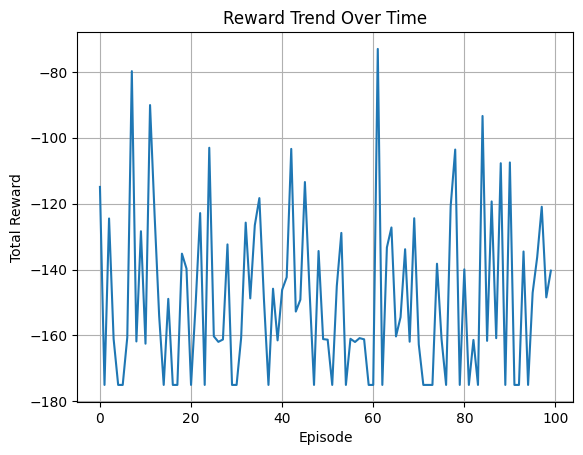

In [81]:
plt.plot(rewards)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Reward Trend Over Time")
plt.grid(True)
plt.show()


In [82]:
# Step 3: Evaluate the trained agent
results = evaluate_agent(agent, episodes=3)


--- Evaluation Mode (Epsilon = 0.0) ---

Episode 1:
  Step 0: Action 16 → Charge sensor 16
  Step 1: Action 9 → Charge sensor 9
  Step 2: Action 20 → Return to base station
  Step 3: Action 20 → Return to base station
  Step 4: Action 20 → Return to base station
  Step 5: Action 20 → Return to base station
  Step 6: Action 20 → Return to base station
  Step 7: Action 20 → Return to base station
  Step 8: Action 20 → Return to base station
  Step 9: Action 20 → Return to base station
  Step 10: Action 20 → Return to base station
  Step 11: Action 20 → Return to base station
  Step 12: Action 20 → Return to base station
  Step 13: Action 20 → Return to base station
  Step 14: Action 20 → Return to base station
  Step 15: Action 20 → Return to base station
  Step 16: Action 20 → Return to base station
  Step 17: Action 20 → Return to base station
  Step 18: Action 20 → Return to base station
  Step 19: Action 20 → Return to base station
  Step 20: Action 20 → Return to base station
  Ste

In [83]:
# Step 4: Print average performance
rewards_eval, deaths_eval = zip(*results)
print("\n--- Evaluation Summary ---")
print("Average Evaluation Reward:", np.mean(rewards_eval))
print("Average Dead Sensors:", np.mean(deaths_eval))


--- Evaluation Summary ---
Average Evaluation Reward: -7.54536422490776
Average Dead Sensors: 0.0


--- Step 1 ---
Charged 3 sensors with total 6237.30 J


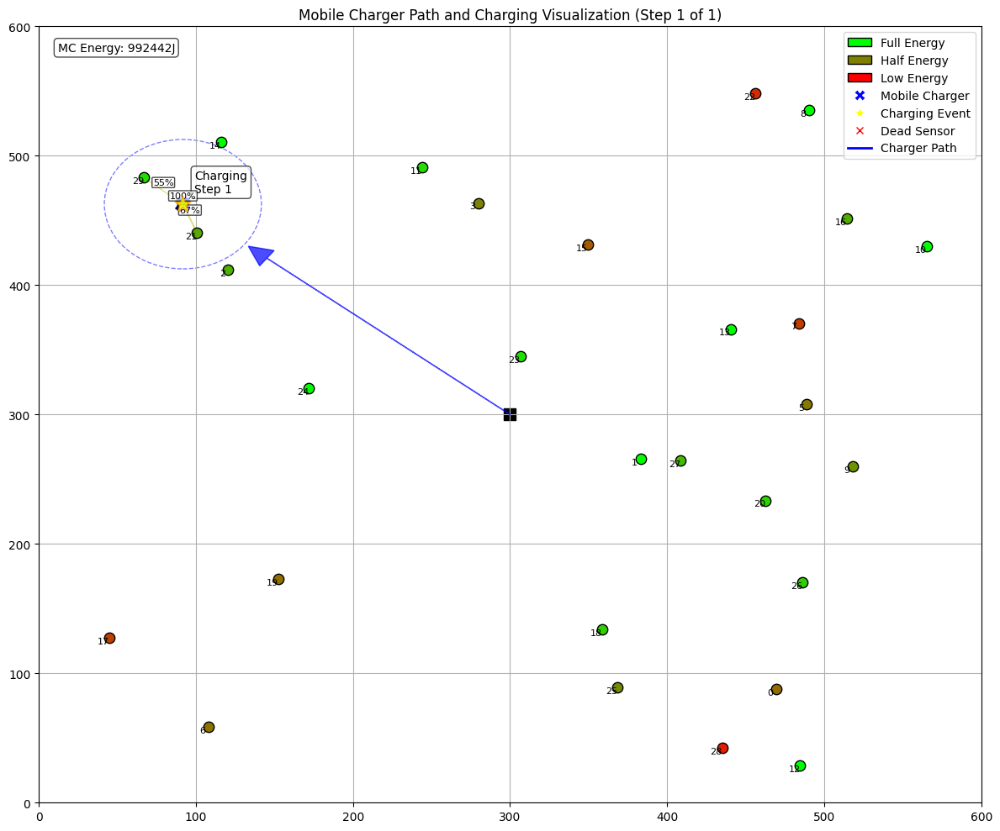

--- Step 2 ---
Charged 1 sensors with total 3475.24 J


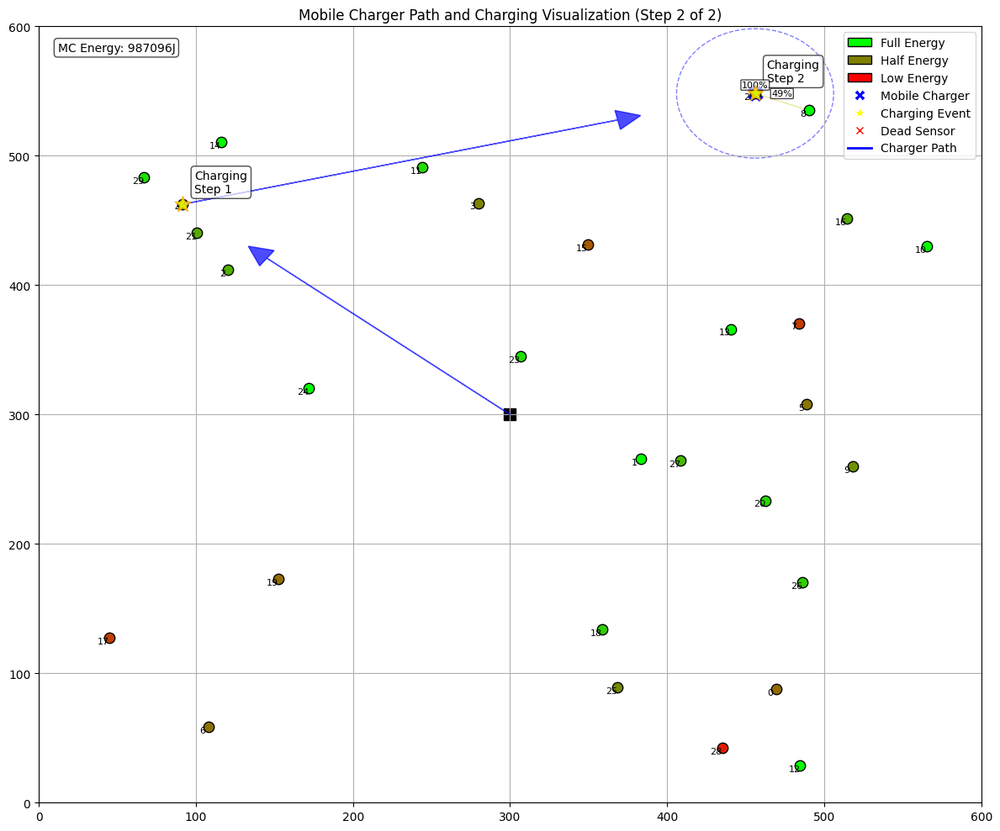

--- Step 3 ---
Charged 1 sensors with total 3734.96 J


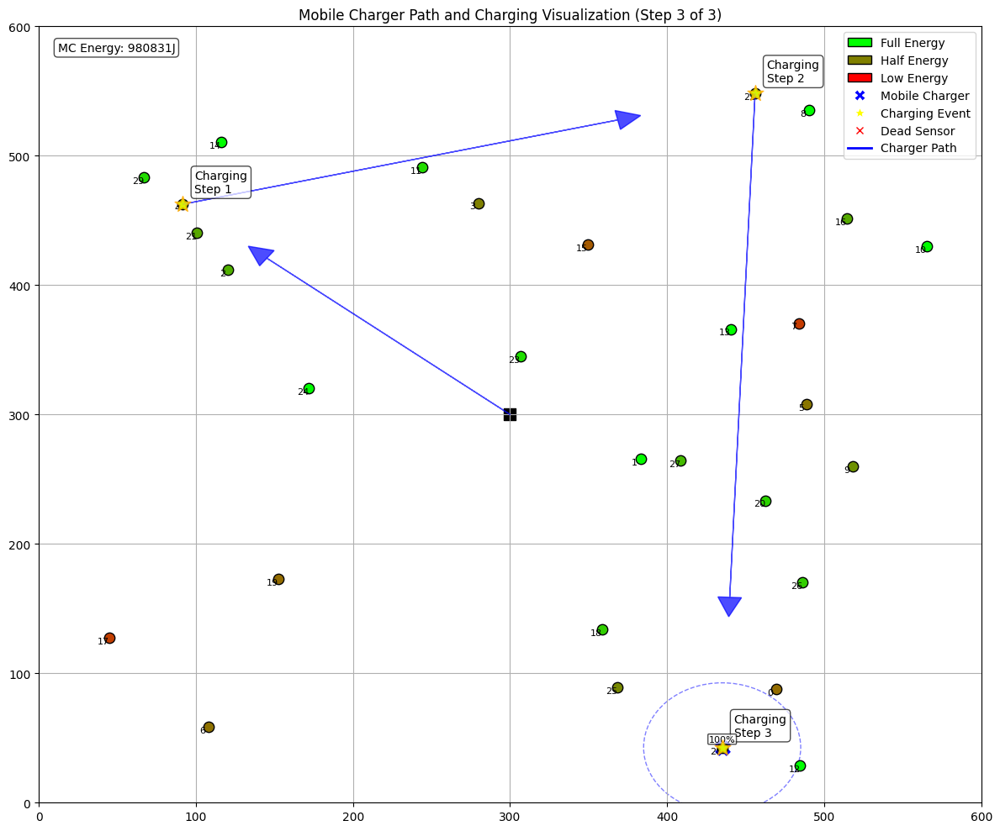

--- Step 4 ---
No sensor needs charging right now.

Energy Change Summary:
Sensor 0: 2576.5J → 2532.5J (-44.0J) - DEPLETED
Sensor 1: 5971.1J → 5895.3J (-75.8J) - DEPLETED
Sensor 2: 4188.9J → 4123.7J (-65.2J) - DEPLETED
Sensor 3: 3106.0J → 3017.7J (-88.3J) - DEPLETED
Sensor 4: 1056.3J → 4462.9J (+3406.5J) - CHARGED
Sensor 5: 2846.0J → 2768.8J (-77.3J) - DEPLETED
Sensor 6: 2747.1J → 2658.6J (-88.5J) - DEPLETED
Sensor 7: 1406.5J → 1383.0J (-23.5J) - DEPLETED
Sensor 8: 7801.4J → 7741.5J (-59.9J) - DEPLETED
Sensor 9: 3475.5J → 3406.0J (-69.5J) - DEPLETED
Sensor 10: 7585.1J → 7503.2J (-81.9J) - DEPLETED
Sensor 11: 5250.4J → 5177.3J (-73.1J) - DEPLETED
Sensor 12: 7722.3J → 7660.1J (-62.2J) - DEPLETED
Sensor 13: 7708.4J → 7634.7J (-73.7J) - DEPLETED
Sensor 14: 7161.8J → 7082.4J (-79.4J) - DEPLETED
Sensor 15: 2171.9J → 2129.1J (-42.8J) - DEPLETED
Sensor 16: 4069.5J → 4007.8J (-61.6J) - DEPLETED
Sensor 17: 1547.2J → 1467.7J (-79.6J) - DEPLETED
Sensor 18: 4877.0J → 4840.1J (-36.9J) - DEPLETED
Sen

In [84]:
def visualize_charger_path(num_steps=15, time_step=10, show_step_by_step=True):
    """
    Visualizes the path of the mobile charger and how sensors get charged over time.
    
    Args:
        num_steps: Number of simulation steps to run
        time_step: Time between each step (impacts energy consumption)
        show_step_by_step: If True, shows each step; if False, only shows final state with full path
    """
    # Initialize environment with more sensors for better visualization
    sensors, mc = initialize_environment(num_sensors=30)
    
    # Create lists to store path and charging information
    path_x = [mc.x]
    path_y = [mc.y]
    charging_events = []  # List to store charging positions
    
    # Track initial energy states
    initial_energy = {s.id: s.energy for s in sensors}
    
    # Run simulation for specified steps
    for step in range(num_steps):
        print(f"--- Step {step+1} ---")
        
        # Filter sensors needing charging
        to_charge = [s for s in sensors if s.needs_charging()]
        if not to_charge:
            print("No sensor needs charging right now.")
            break
            
        # Select next sensor using greedy strategy (closest one)
        to_charge.sort(key=lambda s: np.linalg.norm([mc.x - s.x, mc.y - s.y]))
        target = to_charge[0]
        
        # Move to sensor
        if not mc.move_to(target.x, target.y):
            print("MC does not have enough energy to move.")
            break
            
        # Add new position to path
        path_x.append(mc.x)
        path_y.append(mc.y)
        
        # Charge all sensors within radius
        charged_nodes, total_energy = mc.charge_nodes_in_radius(sensors)
        
        if charged_nodes:
            print(f"Charged {len(charged_nodes)} sensors with total {total_energy:.2f} J")
            charging_events.append((mc.x, mc.y, step+1))
        else:
            print("No sensors were charged in this step.")
            
        # Update energy of all sensors
        for s in sensors:
            s.update_energy(time_step)
            
        # Visualize each step if requested
        if show_step_by_step:
            visualize_path_step(sensors, mc, path_x, path_y, charging_events, step+1)
    
    # Always show final state
    if not show_step_by_step:
        visualize_path_step(sensors, mc, path_x, path_y, charging_events, num_steps, final=True)
        
    # Show energy change summary
    final_energy = {s.id: s.energy for s in sensors}
    print("\nEnergy Change Summary:")
    for s_id in initial_energy:
        initial = initial_energy[s_id]
        final = final_energy[s_id]
        change = final - initial
        status = "CHARGED" if change > 0 else "DEPLETED" if change < 0 else "UNCHANGED"
        print(f"Sensor {s_id}: {initial:.1f}J → {final:.1f}J ({change:+.1f}J) - {status}")

def visualize_path_step(sensors, mc, path_x, path_y, charging_events, step, final=False):
    """Helper function to visualize a single step in the charger's path"""
    plt.figure(figsize=(12, 10))
    
    # Plot environment basics
    alive_sensors = [s for s in sensors if not s.dead]
    dead_sensors = [s for s in sensors if s.dead]
    
    # Plot sensors with color intensity based on energy level
    for s in alive_sensors:
        energy_ratio = min(max(s.energy / s.capacity, 0.0), 1.0)  # Clamp between 0 and 1
        # Use a color scale from red (low energy) to green (full energy)
        color = [(1-energy_ratio), energy_ratio, 0]  # Make as a list, not tuple
        plt.scatter(s.x, s.y, c=[color], s=80, edgecolors='black', zorder=2)
        plt.annotate(f"{s.id}", (s.x, s.y), xytext=(-5, -5), 
                    textcoords="offset points", ha='center', fontsize=8)
    
    # Rest of the function remains the same
    # Plot dead sensors
    if dead_sensors:
        plt.scatter([s.x for s in dead_sensors], [s.y for s in dead_sensors], 
                   c='red', marker='x', s=100, label='Dead Sensors', zorder=1)
    
    # Plot base station
    plt.scatter(300, 300, c='black', marker='s', s=100, label='Base Station')
    
    # Draw the current charging radius
    circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, color='blue', 
                        fill=False, linestyle='--', alpha=0.5)
    plt.gcf().gca().add_artist(circle)
    
    # Plot the mobile charger's path with arrows to show direction
    if len(path_x) > 1:
        for i in range(len(path_x)-1):
            # Draw line segment with arrow
            dx = path_x[i+1] - path_x[i]
            dy = path_y[i+1] - path_y[i]
            plt.arrow(path_x[i], path_y[i], dx*0.8, dy*0.8, 
                     head_width=15, head_length=15, fc='blue', ec='blue', zorder=3, 
                     length_includes_head=True, alpha=0.7)
    
    # Highlight charging events along the path
    for cx, cy, event_step in charging_events:
        if event_step <= step:  # Only show events that have happened
            plt.scatter(cx, cy, c='yellow', edgecolors='orange', s=200, 
                       marker='*', zorder=4, alpha=0.8)
            plt.annotate(f"Charging\nStep {event_step}", (cx, cy), xytext=(10, 10),
                        textcoords="offset points", 
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7))
    
    # Plot current position of mobile charger
    plt.scatter(mc.x, mc.y, c='blue', marker='X', s=150, label='Mobile Charger')
    
    # Add a custom legend for energy levels
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = [
        Patch(facecolor=(0,1,0), edgecolor='black', label='Full Energy'),
        Patch(facecolor=(0.5,0.5,0), edgecolor='black', label='Half Energy'),
        Patch(facecolor=(1,0,0), edgecolor='black', label='Low Energy'),
        Line2D([0], [0], marker='X', color='w', markerfacecolor='blue', markersize=10, label='Mobile Charger'),
        Line2D([0], [0], marker='*', color='w', markerfacecolor='yellow', markersize=10, label='Charging Event'),
        Line2D([0], [0], marker='x', color='red', lw=0, label='Dead Sensor'),
        Line2D([0], [0], color='blue', lw=2, label='Charger Path')
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Set title and grid
    title = "Mobile Charger Path and Charging Visualization"
    if final:
        title += f" (Complete Path After {step} Steps)"
    else:
        title += f" (Step {step} of {step})"
    plt.title(title)
    
    # Add MC energy status
    plt.annotate(f"MC Energy: {mc.energy:.0f}J", xy=(0.02, 0.98), xycoords='axes fraction',
                bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
                va='top')
    
    # Add charging beams for sensors in range
    for s in alive_sensors:
        distance = np.linalg.norm([mc.x - s.x, mc.y - s.y])
        if distance <= CHARGING_RADIUS:
            # Calculate charging efficiency
            efficiency = max(0.3, 1 - (distance / CHARGING_RADIUS) * 0.7)
            # Draw charging beam with thickness/opacity based on efficiency
            plt.plot([mc.x, s.x], [mc.y, s.y], 'y-', 
                     alpha=efficiency*0.8, 
                     linewidth=2*efficiency,
                     zorder=1)
            
            # Add efficiency label
            plt.annotate(f"{efficiency*100:.0f}%", 
                        ((mc.x + s.x)/2, (mc.y + s.y)/2), 
                        xytext=(0, 5),
                        textcoords="offset points",
                        ha='center',
                        bbox=dict(boxstyle="round,pad=0.1", fc="white", alpha=0.7),
                        fontsize=8)
    
    plt.grid(True)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.tight_layout()
    plt.show()

# Run the visualization
visualize_charger_path(num_steps=10, time_step=15, show_step_by_step=True)

--- Step 1/100 --- MC Energy: 1000000.0J
Moving to sensor 35 (5.0% charge)
Charged 2 sensors with 6218.1J of energy


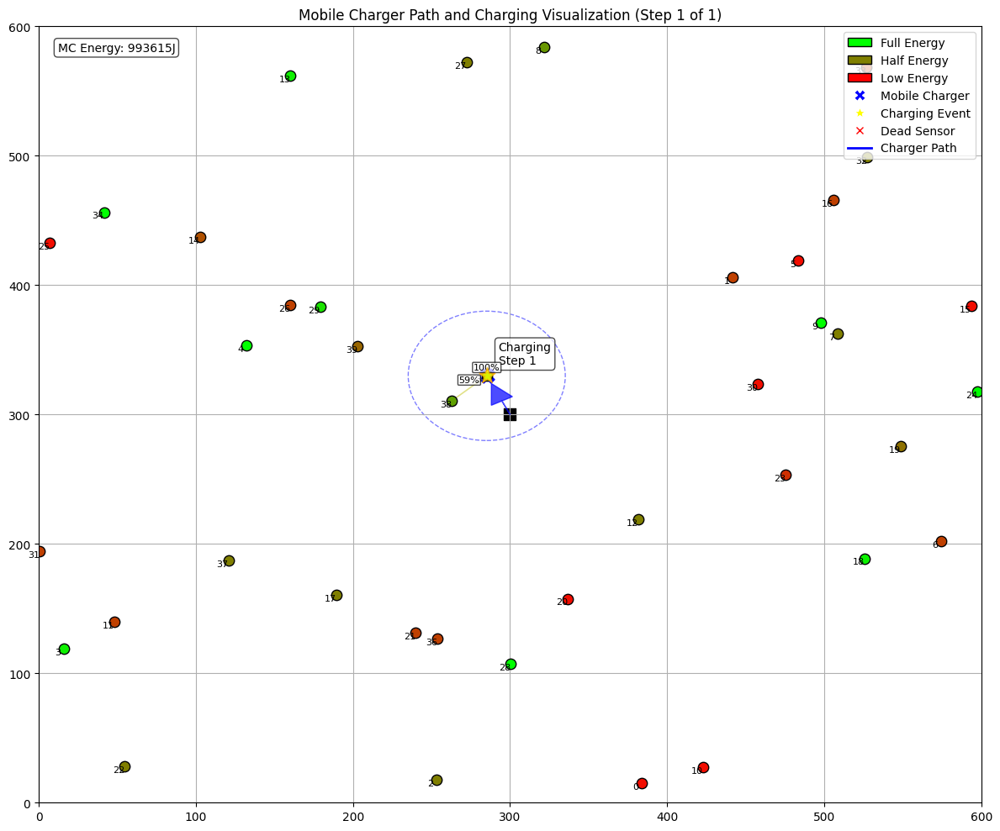

Moving to sensor 30 (5.0% charge)
Charged 1 sensors with 3991.1J of energy
Moving to sensor 23 (18.2% charge)
Charged 1 sensors with 3434.3J of energy
Moving to sensor 5 (5.0% charge)
Charged 2 sensors with 5343.5J of energy
Moving to sensor 15 (4.9% charge)
Charged 1 sensors with 3993.0J of energy
--- Step 6/100 --- MC Energy: 974221.3J
Moving to sensor 20 (4.8% charge)
Charged 1 sensors with 3998.2J of energy
Moving to sensor 0 (4.9% charge)
Charged 2 sensors with 5708.4J of energy
Moving to sensor 25 (4.8% charge)
Charged 1 sensors with 3996.9J of energy
No sensors need charging right now. Letting energy deplete...
No sensors need charging right now. Letting energy deplete...
--- Step 11/100 --- MC Energy: 955243.6J
No sensors need charging right now. Letting energy deplete...
No sensors need charging right now. Letting energy deplete...
No sensors need charging right now. Letting energy deplete...
No sensors need charging right now. Letting energy deplete...
No sensors need chargin

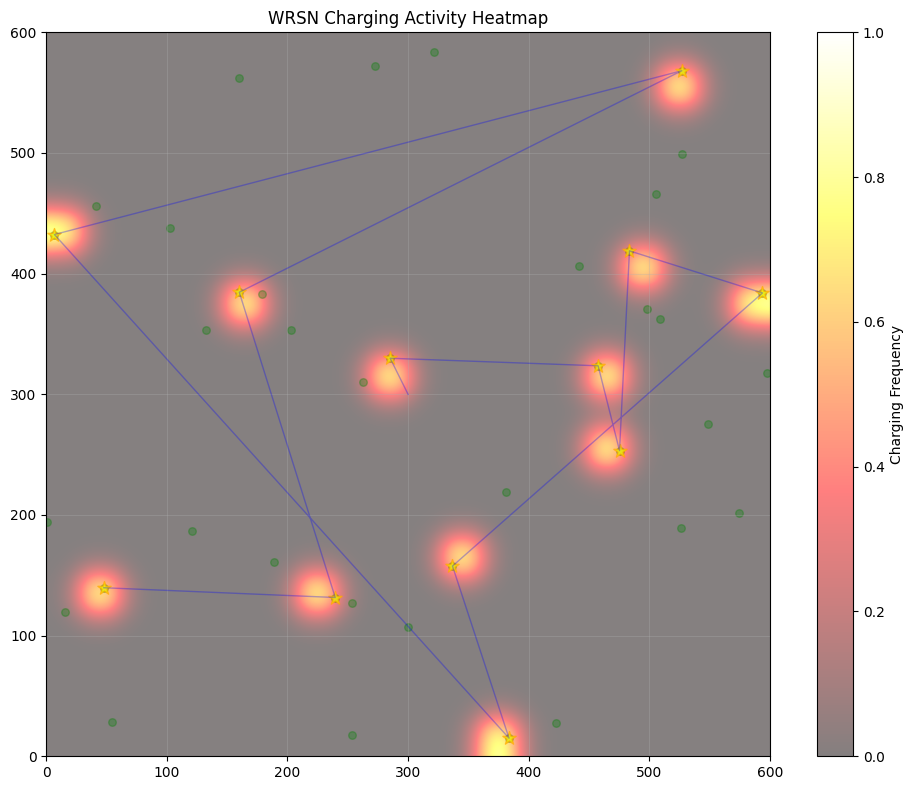

In [85]:
def visualize_extended_charger_path(num_steps=50, time_step=5, visualize_every=5, 
                                    num_sensors=40, random_seed=None):
    """
    Extended visualization of the mobile charger's path and charging behavior.
    
    Args:
        num_steps: Maximum number of simulation steps (higher value = longer simulation)
        time_step: Time between steps in seconds (lower value = slower energy depletion)
        visualize_every: Only show visualization every N steps to reduce output volume
        num_sensors: Number of sensors in the network (more sensors = more charging opportunities)
        random_seed: If set, uses this seed for reproducible simulations
    """
    # Set random seed if provided
    if random_seed is not None:
        random.seed(random_seed)
        np.random.seed(random_seed)
        
    # Initialize environment with many sensors for better visualization
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Set energy levels to create more variation in charging needs
    for i, s in enumerate(sensors):
        # Create a mix of charge levels - some urgent, some near threshold, some okay
        if i % 5 == 0:  # 20% of sensors are very low
            s.energy = 0.05 * s.capacity
        elif i % 5 == 1:  # 20% of sensors near threshold
            s.energy = 0.25 * s.capacity
        elif i % 5 == 2:  # 20% of sensors are half charged
            s.energy = 0.5 * s.capacity
            
        # Vary consumption rates 
        s.consumption_rate = random.uniform(0.2, 1.0)  # Lower consumption = longer simulation
    
    # Create storage for path tracking
    path_x = [mc.x]
    path_y = [mc.y]
    charging_events = []
    
    # Track stats
    num_charged_sensors = 0
    total_energy_transferred = 0
    initial_energy = {s.id: s.energy for s in sensors}
    
    # Run extended simulation
    for step in range(num_steps):
        # Update command line output every step
        if step % 5 == 0:
            print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Filter sensors needing charging
        to_charge = [s for s in sensors if s.needs_charging()]
        if not to_charge:
            # Add artificial delay between charging rounds
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging right now. Letting energy deplete...")
            # Skip visualization for this step
            continue
            
        # Prioritize based on energy level and distance (weighted approach)
        # This helps create more interesting paths than just choosing closest
        def priority_score(sensor):
            distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
            energy_ratio = sensor.energy / sensor.capacity
            # Lower energy and shorter distance = higher priority
            return distance * 0.7 + energy_ratio * 100
            
        to_charge.sort(key=priority_score)
        target = to_charge[0]
        
        # Move to the target sensor
        print(f"Moving to sensor {target.id} ({target.energy/target.capacity:.1%} charge)")
        if not mc.move_to(target.x, target.y):
            print("MC doesn't have enough energy to move.")
            break
            
        # Record path
        path_x.append(mc.x)
        path_y.append(mc.y)
        
        # Charge all sensors within radius
        charged_nodes, energy_amount = mc.charge_nodes_in_radius(sensors)
        
        if charged_nodes:
            total_energy_transferred += energy_amount
            num_charged_sensors += len(charged_nodes)
            print(f"Charged {len(charged_nodes)} sensors with {energy_amount:.1f}J of energy")
            charging_events.append((mc.x, mc.y, step+1))
        
        # Energy consumption for all sensors
        for s in sensors:
            s.update_energy(time_step)
        
        # Visualize at specified intervals or for the final step
        if step % visualize_every == 0 or step == num_steps - 1:
            visualize_path_step(sensors, mc, path_x, path_y, charging_events, step+1)
    
    # Show final energy changes
    final_energy = {s.id: s.energy for s in sensors}
    charged_count = 0
    depleted_count = 0
    
    print("\nEnergy Change Summary:")
    for s_id in initial_energy:
        initial = initial_energy[s_id]
        final = final_energy[s_id]
        change = final - initial
        if change > 0:
            charged_count += 1
        elif change < 0:
            depleted_count += 1
            
        status = "CHARGED" if change > 0 else "DEPLETED" if change < 0 else "UNCHANGED"
        print(f"Sensor {s_id}: {initial:.1f}J → {final:.1f}J ({change:+.1f}J) - {status}")
    
    # Show overall statistics
    print(f"\nOverall Statistics:")
    print(f"Total simulation steps: {num_steps}")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Total charging events: {len(charging_events)}")
    print(f"Number of sensors charged at least once: {num_charged_sensors}")
    print(f"Final status: Charged: {charged_count}, Depleted: {depleted_count}")
    print(f"MC remaining energy: {mc.energy:.1f}J")
    
    # Show a heatmap of charging activity
    visualize_charging_heatmap(path_x, path_y, charging_events, sensors)

def visualize_charging_heatmap(path_x, path_y, charging_events, sensors):
    """Creates a heatmap showing where most charging activity occurred"""
    plt.figure(figsize=(10, 8))
    
    # Plot base environment
    plt.scatter([s.x for s in sensors if not s.dead], 
                [s.y for s in sensors if not s.dead], 
                c='green', alpha=0.3, s=30)
    plt.scatter([s.x for s in sensors if s.dead], 
                [s.y for s in sensors if s.dead], 
                c='red', marker='x', s=30)
    
    # Plot path with low opacity
    plt.plot(path_x, path_y, 'b-', alpha=0.3, linewidth=1)
    
    # Create charging event heatmap
    if charging_events:
        charge_x = [x for x, y, _ in charging_events]
        charge_y = [y for x, y, _ in charging_events]
        
        # Use histogram2d to create a heatmap
        heatmap, xedges, yedges = np.histogram2d(charge_x, charge_y, 
                                                bins=[20, 20], 
                                                range=[[0, AREA_WIDTH], [0, AREA_HEIGHT]])
        extent = [0, AREA_WIDTH, 0, AREA_HEIGHT]
        
        plt.imshow(heatmap.T, extent=extent, origin='lower', 
                  cmap='hot', alpha=0.5, interpolation='gaussian')
        plt.colorbar(label='Charging Frequency')
        
        # Plot the charging locations as stars
        plt.scatter(charge_x, charge_y, c='yellow', marker='*', 
                   s=100, edgecolors='orange', alpha=0.7)
    
    plt.title("WRSN Charging Activity Heatmap")
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Run the extended visualization
visualize_extended_charger_path(
    num_steps=100,       # Run for 100 steps
    time_step=3,         # Slower energy consumption
    visualize_every=10,  # Only show visualization every 10 steps
    num_sensors=40,      # More sensors
    random_seed=42       # Fixed seed for reproducibility
)

In [86]:
def move_and_charge_along_path(mc, start_point, end_point, sensors, path_segments=10):
    """
    Moves the mobile charger from start to end point in small increments,
    charging sensors within radius at each step along the path.
    
    Args:
        mc: The mobile charger object
        start_point: (x,y) starting coordinates
        end_point: (x,y) ending coordinates
        sensors: List of sensor nodes
        path_segments: Number of segments to divide the path into
    
    Returns:
        total_energy_transferred: Total energy transferred during movement
        all_charged_nodes: List of all node IDs that received charge
        path_x, path_y: Lists of coordinates visited
    """
    start_x, start_y = start_point
    end_x, end_y = end_point
    
    # Calculate total distance and movement cost
    total_distance = np.linalg.norm([end_x - start_x, end_y - start_y])
    movement_cost = total_distance * MOVEMENT_COST_PER_M
    
    if mc.energy < movement_cost:
        return 0, [], [mc.x], [mc.y]  # Not enough energy to complete move
    
    # Deduct movement cost upfront
    mc.energy -= movement_cost
    
    # Create path points (divide path into segments)
    path_x = []
    path_y = []
    charging_events = []
    
    # Statistics tracking
    total_energy_transferred = 0
    all_charged_nodes = []
    
    # Move along the path in increments, charging at each step
    for i in range(path_segments + 1):  # +1 to include end point
        # Calculate position at this segment
        progress = i / path_segments
        current_x = start_x + (end_x - start_x) * progress
        current_y = start_y + (end_y - start_y) * progress
        
        # Update charger position
        mc.x, mc.y = current_x, current_y
        path_x.append(current_x)
        path_y.append(current_y)
        
        # Charge sensors within radius at reduced efficiency while moving
        charged_nodes, energy_transferred = charge_while_moving(mc, sensors)
        
        if charged_nodes:
            total_energy_transferred += energy_transferred
            all_charged_nodes.extend([node_id for node_id in charged_nodes if node_id not in all_charged_nodes])
            
    return total_energy_transferred, all_charged_nodes, path_x, path_y


def charge_while_moving(mc, sensors):
    """Charge all sensors within radius while the charger is moving"""
    charged_nodes = []
    total_energy_transferred = 0
    
    if mc.energy <= 0:
        return charged_nodes, 0
    
    # Apply a movement efficiency factor (reduced efficiency while moving)
    # We can adjust this factor based on how effective we want charging-while-moving to be
    movement_efficiency_factor = 0.7  # 70% as effective as stationary charging
    
    # Check all sensors - this ensures we charge EVERY sensor in range
    for sensor in sensors:
        if sensor.dead:
            continue
            
        distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
        # Check if sensor is within charging radius, regardless of energy level
        if distance <= CHARGING_RADIUS:
            needed = sensor.capacity - sensor.energy
            if needed <= 0:
                continue  # Skip fully charged sensors
                
            # Calculate efficiency based on distance + movement penalty
            base_efficiency = max(0.3, 1 - (distance / CHARGING_RADIUS) * 0.7)
            moving_efficiency = base_efficiency * movement_efficiency_factor
            
            # Calculate energy to transfer (cap at needed amount or available energy)
            max_transfer = min(needed, mc.energy)
            energy_to_transfer = max_transfer * moving_efficiency
            
            if energy_to_transfer > 0:
                sensor.charge(energy_to_transfer)
                mc.energy -= energy_to_transfer
                total_energy_transferred += energy_to_transfer
                charged_nodes.append(sensor.id)
                
                if mc.energy <= 0:
                    break
    
    return charged_nodes, total_energy_transferred

--- Step 1/20 --- MC Energy: 1000000.0J
Moving to sensor 35 (5.0% charge)
Charged 2 sensors with 10099.5J while moving


C:\Users\akshi\AppData\Local\Temp\ipykernel_23716\416811250.py:182: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "y-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot([closest_x, s.x], [closest_y, s.y], 'y-',


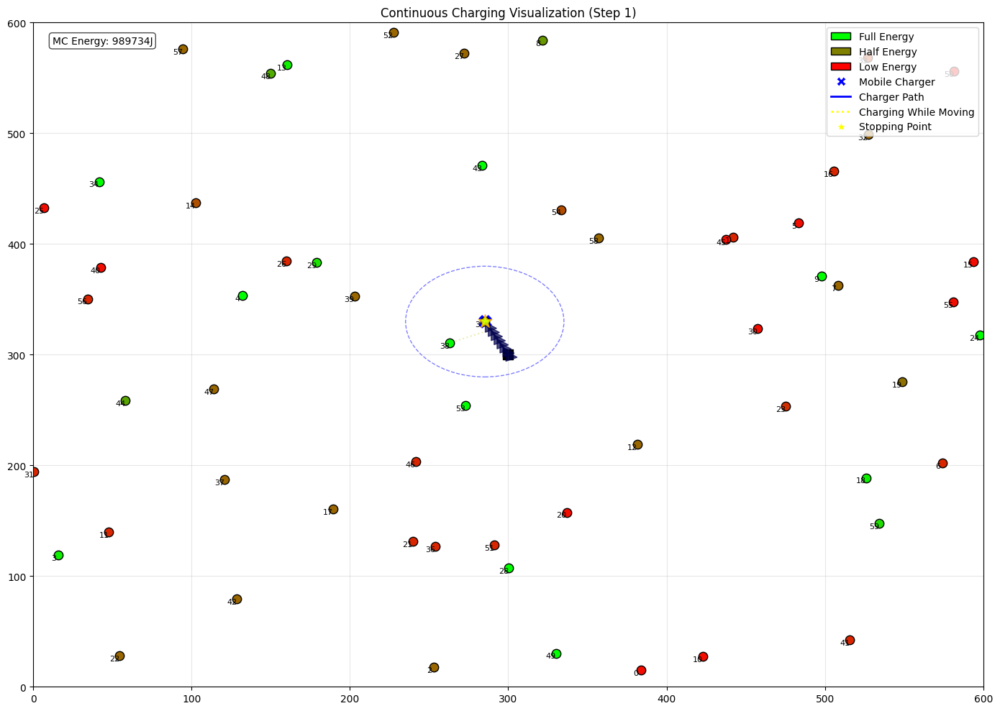

--- Step 2/20 --- MC Energy: 989733.7J
Moving to sensor 46 (15.0% charge)
Charged 3 sensors with 4709.2J while moving


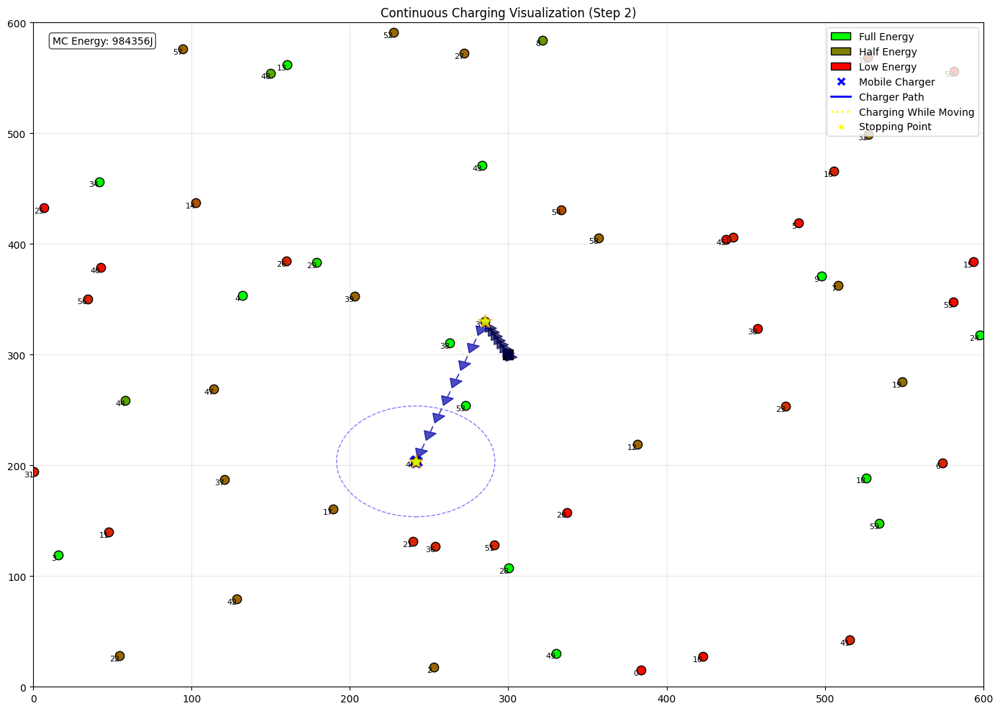

--- Step 3/20 --- MC Energy: 984356.4J
Moving to sensor 21 (15.0% charge)
Charged 3 sensors with 10278.1J while moving


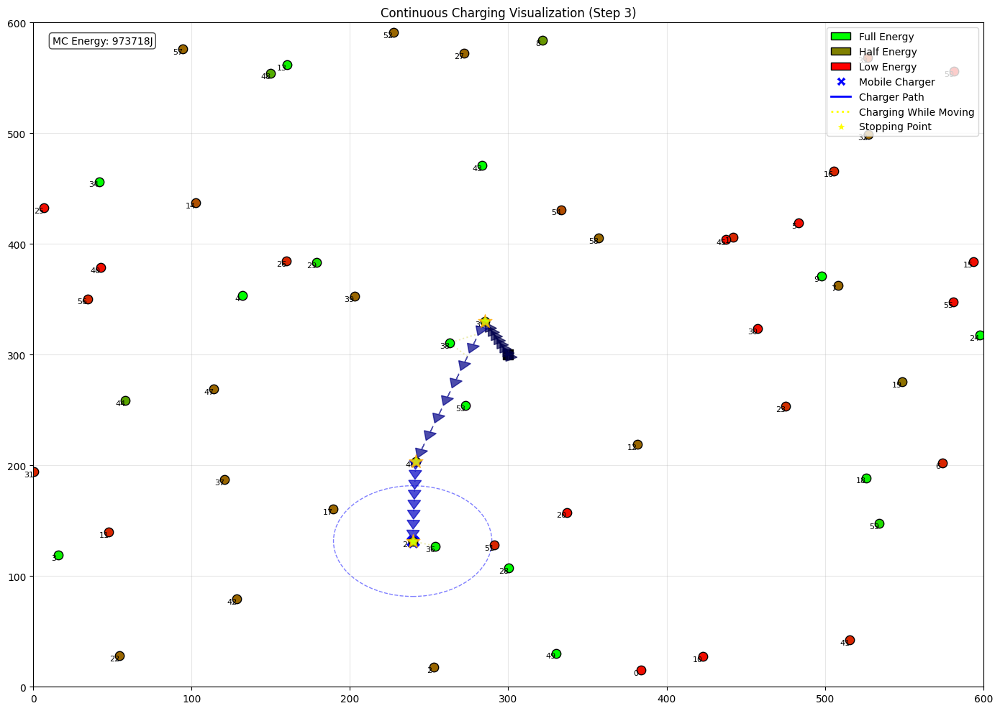

--- Step 4/20 --- MC Energy: 973718.3J
Moving to sensor 51 (15.0% charge)
Charged 3 sensors with 5443.6J while moving


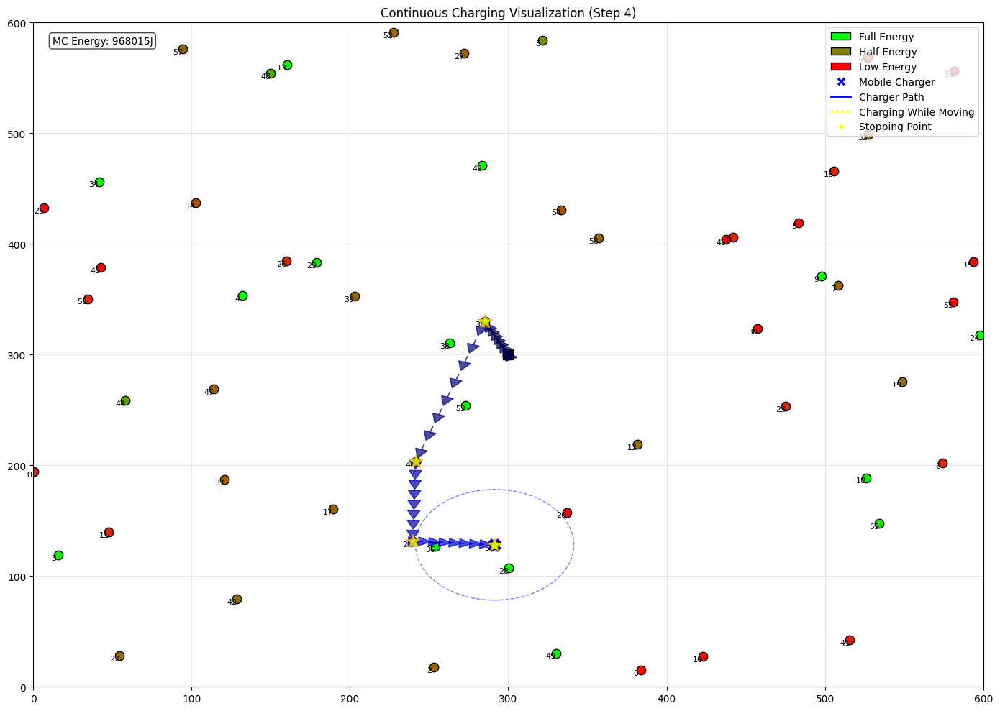

--- Step 5/20 --- MC Energy: 968015.5J
Moving to sensor 20 (5.0% charge)
Charged 3 sensors with 5697.3J while moving


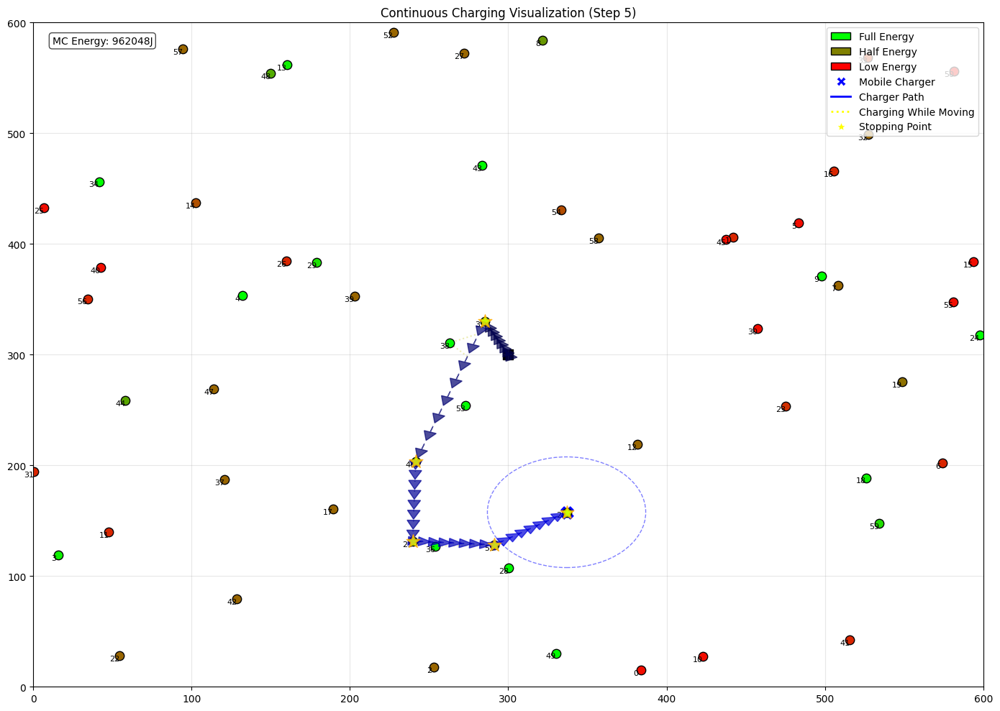

--- Step 6/20 --- MC Energy: 962047.6J
Moving to sensor 0 (5.0% charge)
Charged 3 sensors with 7897.4J while moving


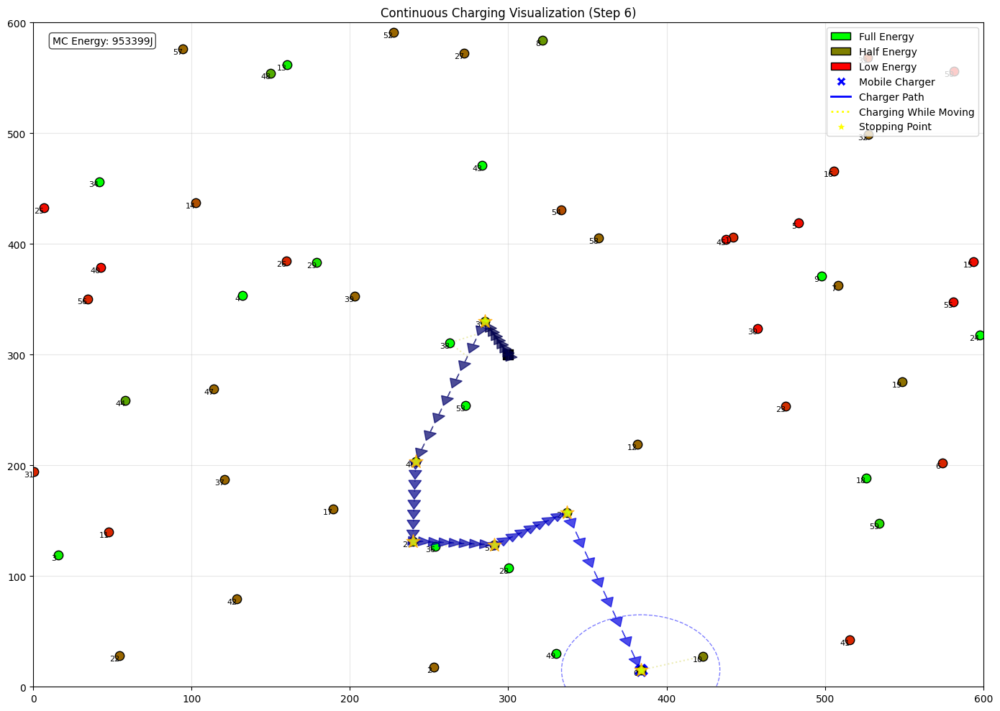

--- Step 7/20 --- MC Energy: 953399.5J
Moving to sensor 41 (15.0% charge)
Charged 3 sensors with 8061.8J while moving


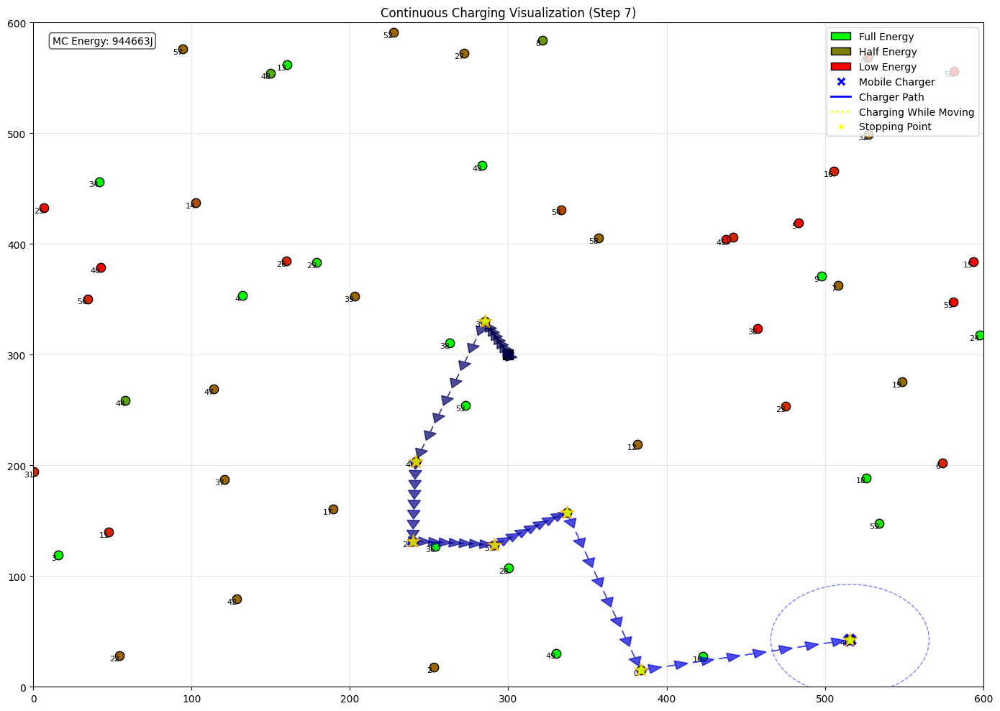

--- Step 8/20 --- MC Energy: 944662.9J
Moving to sensor 6 (15.0% charge)
Charged 4 sensors with 5781.0J while moving


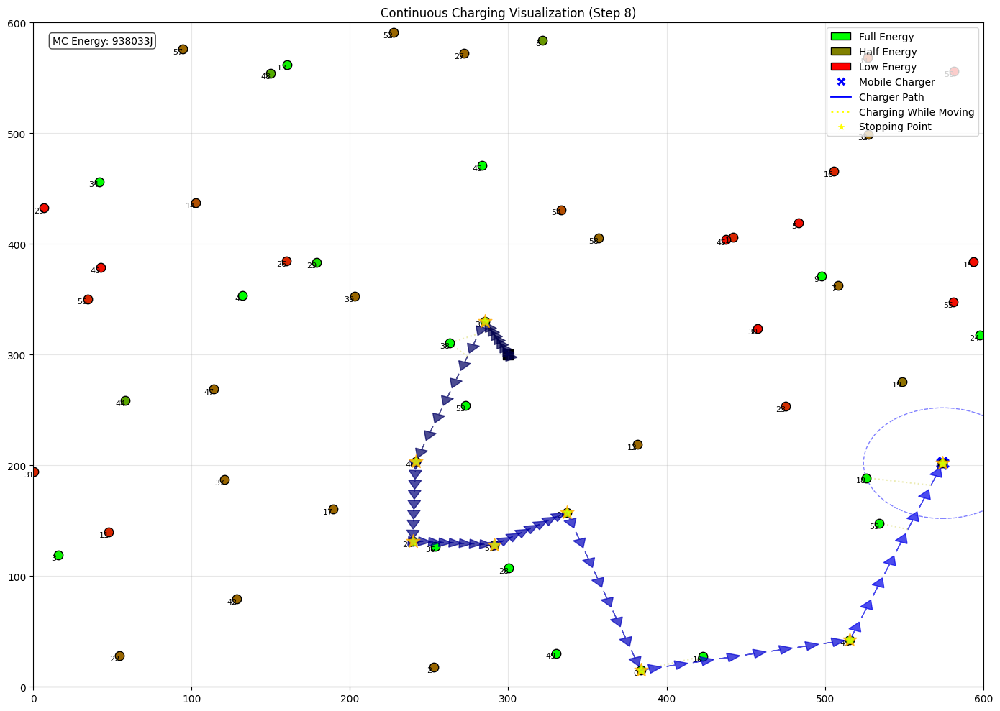

--- Step 9/20 --- MC Energy: 938032.7J
Moving to sensor 23 (18.2% charge)
Charged 3 sensors with 5297.8J while moving


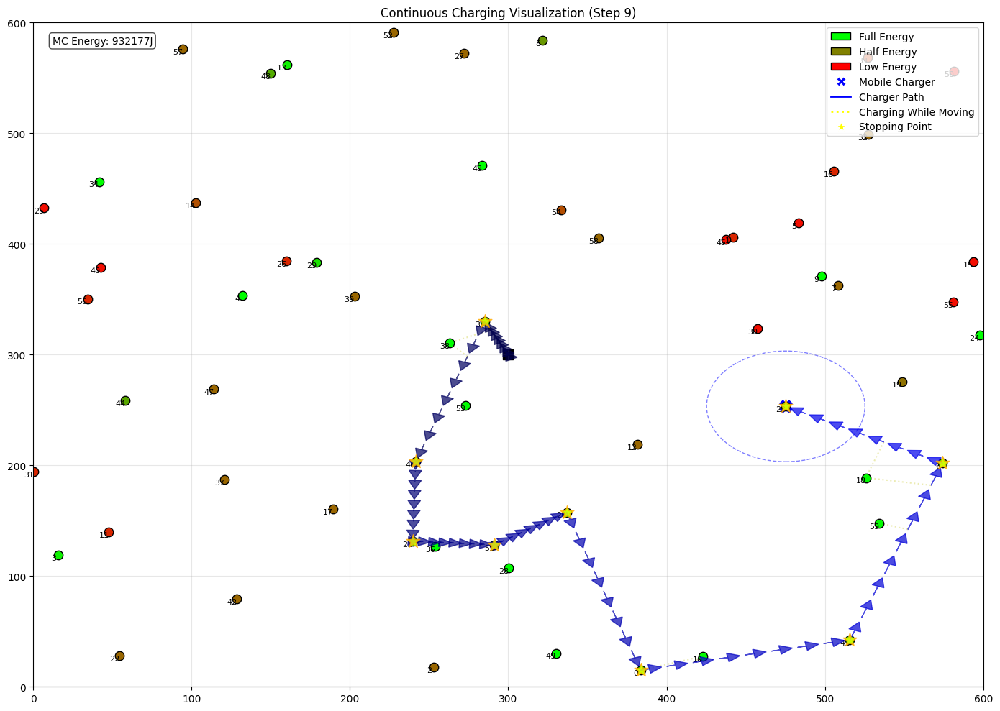

--- Step 10/20 --- MC Energy: 932176.9J
Moving to sensor 30 (4.9% charge)
Charged 2 sensors with 5874.6J while moving


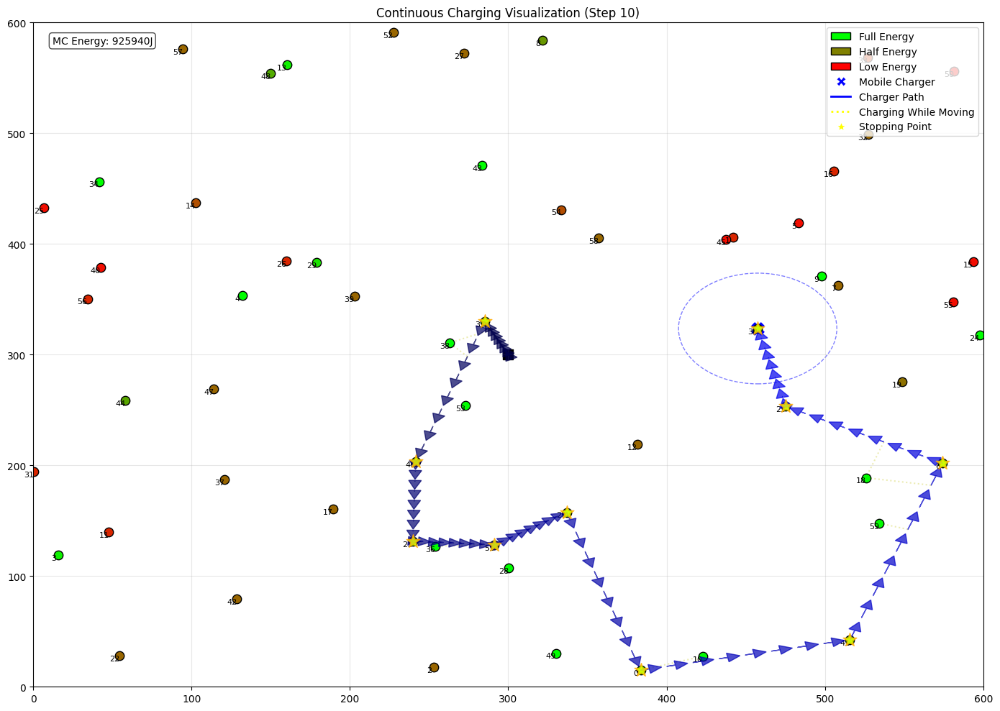

--- Step 11/20 --- MC Energy: 925939.7J
Moving to sensor 45 (4.9% charge)
Charged 4 sensors with 11866.1J while moving


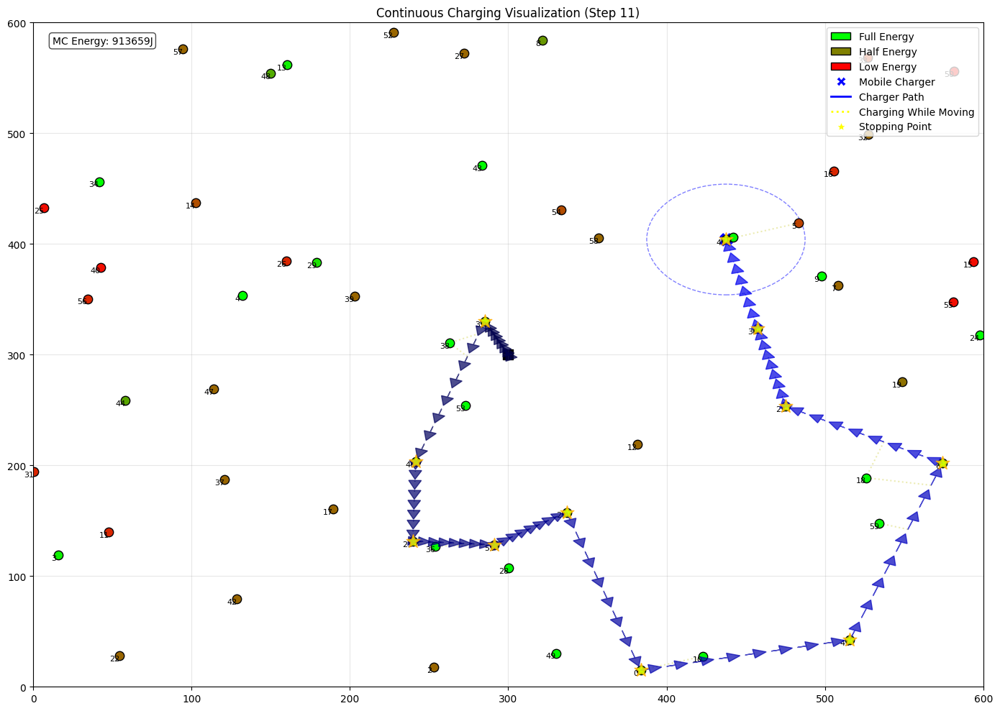

--- Step 12/20 --- MC Energy: 913659.3J
Moving to sensor 16 (15.0% charge)
Charged 5 sensors with 10709.7J while moving


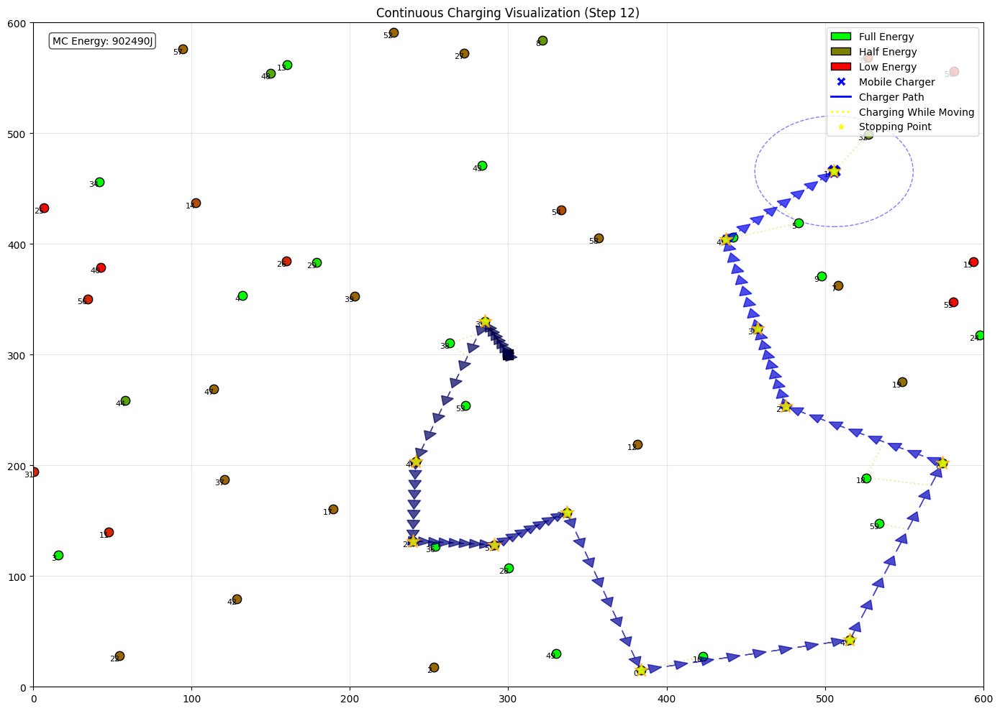

--- Step 13/20 --- MC Energy: 902489.9J
Moving to sensor 50 (5.0% charge)
Charged 4 sensors with 8973.3J while moving


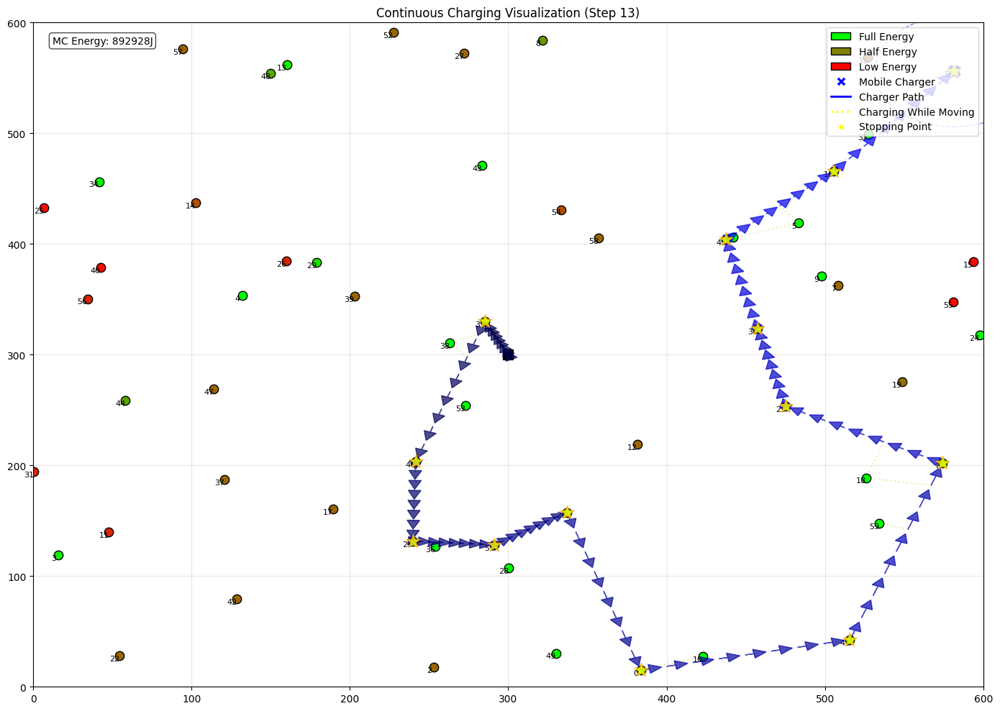

--- Step 14/20 --- MC Energy: 892927.8J
Moving to sensor 15 (4.9% charge)
Charged 3 sensors with 7204.6J while moving


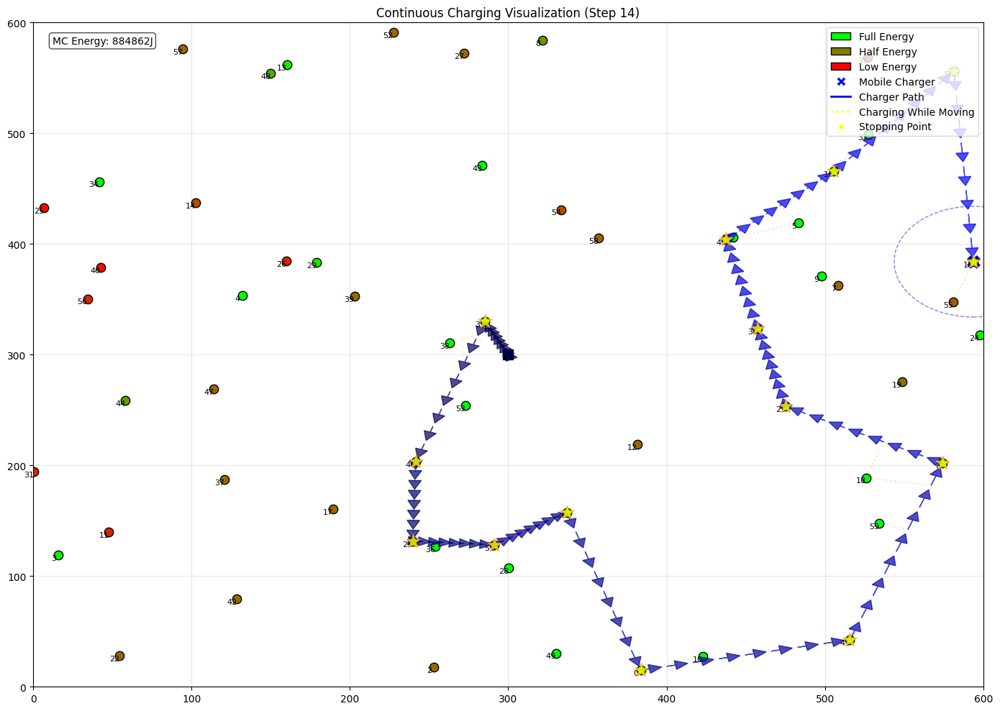

--- Step 15/20 --- MC Energy: 884861.9J
Moving to sensor 26 (14.9% charge)
Charged 11 sensors with 12302.0J while moving


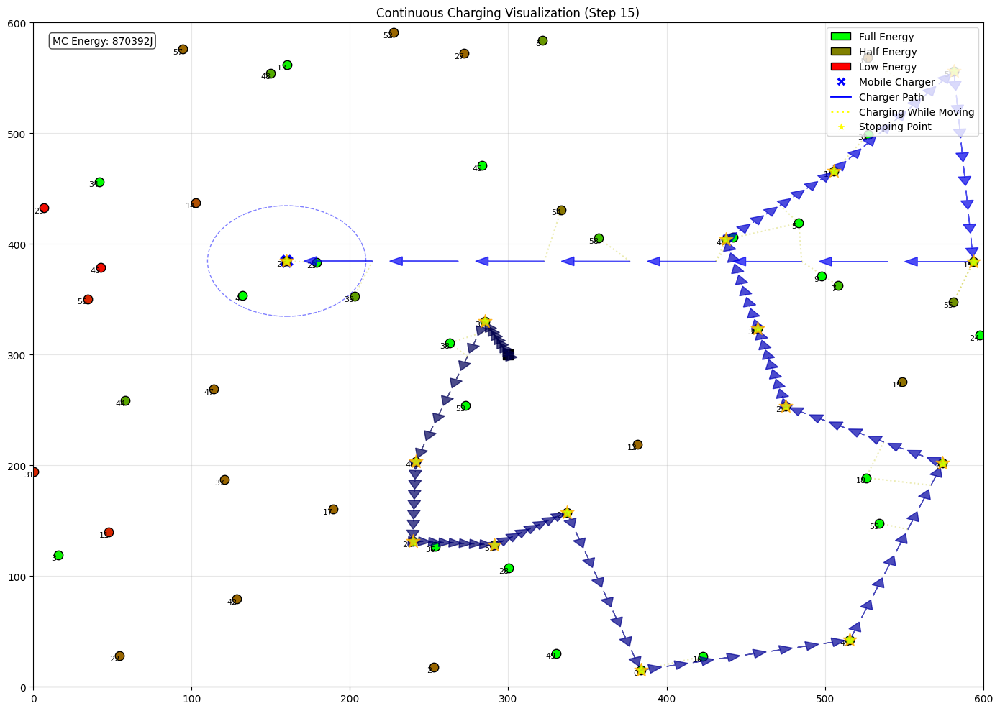

--- Step 16/20 --- MC Energy: 870391.8J
Moving to sensor 40 (4.9% charge)
Charged 4 sensors with 10556.1J while moving


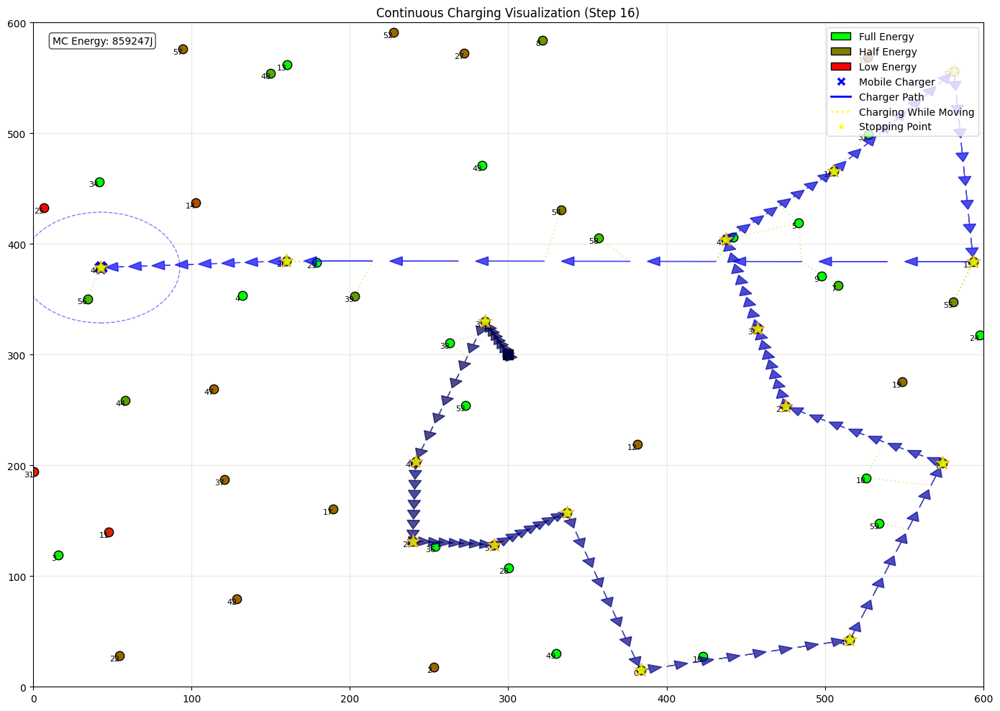

--- Step 17/20 --- MC Energy: 859247.4J
Moving to sensor 25 (4.9% charge)
Charged 3 sensors with 7190.0J while moving


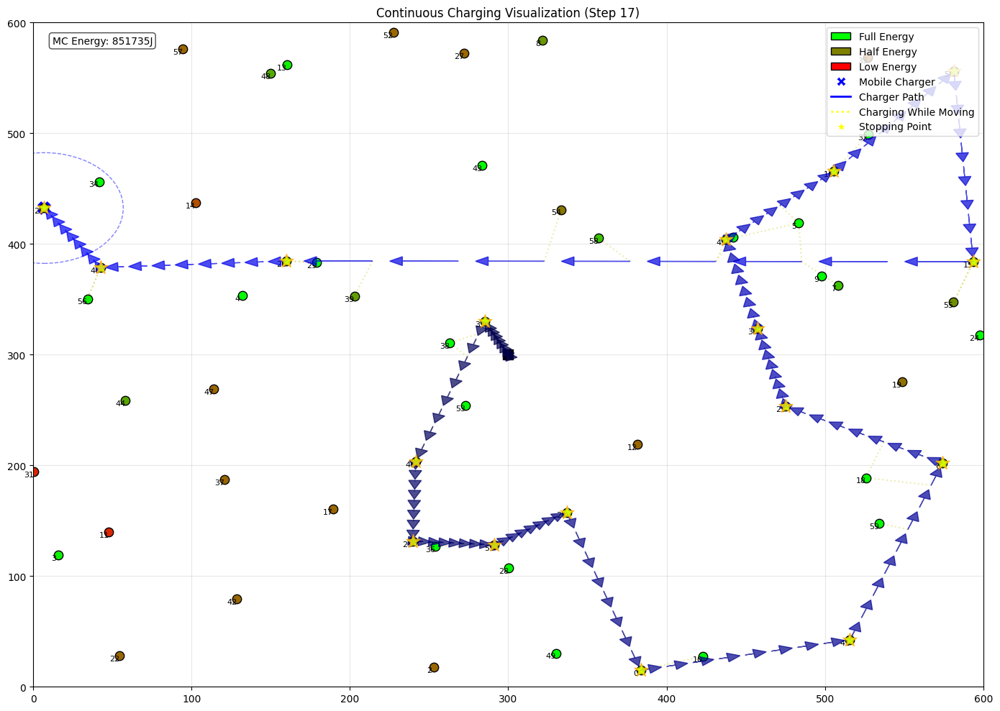

--- Step 18/20 --- MC Energy: 851734.7J
Moving to sensor 31 (14.9% charge)
Charged 4 sensors with 4464.8J while moving


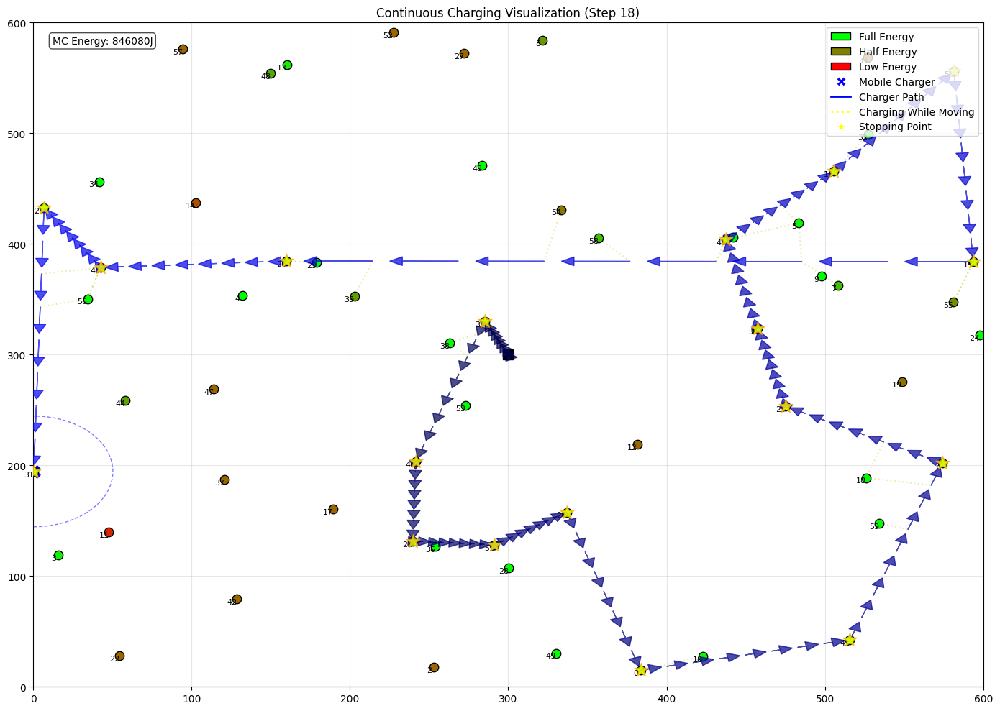

--- Step 19/20 --- MC Energy: 846079.7J
Moving to sensor 11 (14.9% charge)
Charged 3 sensors with 6204.0J while moving


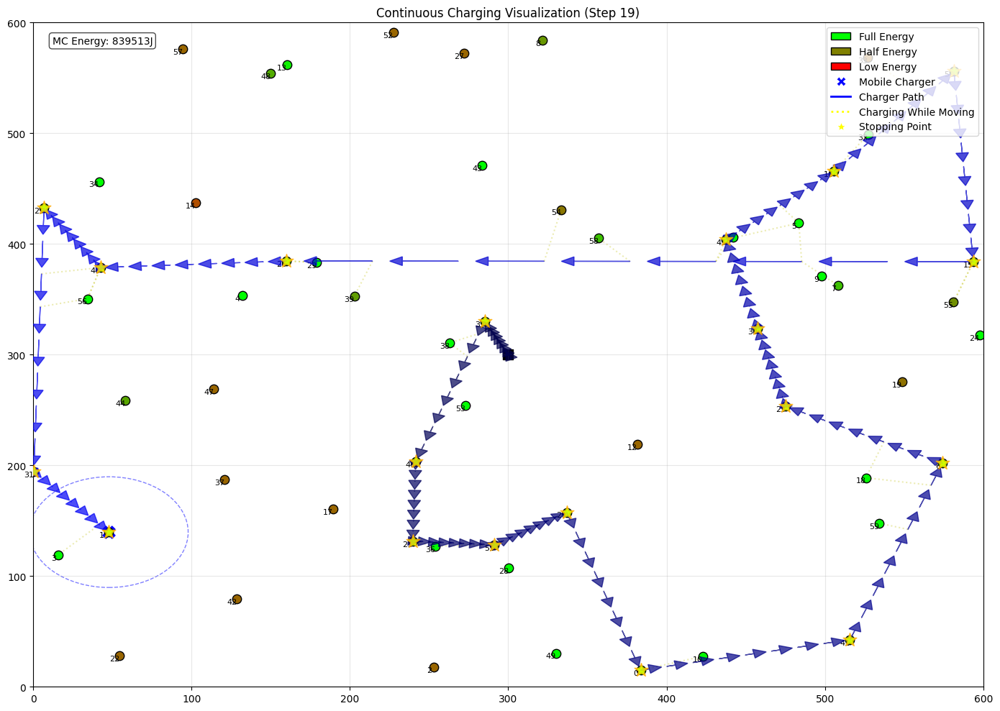

--- Step 20/20 --- MC Energy: 839513.0J
No sensors need charging. Letting energy deplete...

Energy Change Summary:
Sensor 0: 300.0J → 5946.7J (+5646.7J) - CHARGED
Sensor 1: 900.0J → 5994.9J (+5094.9J) - CHARGED
Sensor 2: 2400.0J → 2392.4J (-7.6J) - DEPLETED
Sensor 3: 5669.1J → 5939.2J (+270.1J) - CHARGED
Sensor 4: 6913.6J → 6909.3J (-4.2J) - DEPLETED
Sensor 5: 300.0J → 5945.2J (+5645.2J) - CHARGED
Sensor 6: 900.0J → 5967.4J (+5067.4J) - CHARGED
Sensor 7: 2400.0J → 4514.7J (+2114.7J) - CHARGED
Sensor 8: 3552.6J → 3543.4J (-9.2J) - DEPLETED
Sensor 9: 7321.3J → 7316.1J (-5.2J) - DEPLETED
Sensor 10: 300.0J → 5924.8J (+5624.8J) - CHARGED
Sensor 11: 900.0J → 5919.8J (+5019.8J) - CHARGED
Sensor 12: 2400.0J → 2397.1J (-2.9J) - DEPLETED
Sensor 13: 5654.7J → 5647.8J (-6.9J) - DEPLETED
Sensor 14: 1874.5J → 1862.0J (-12.6J) - DEPLETED
Sensor 15: 300.0J → 5806.1J (+5506.1J) - CHARGED
Sensor 16: 900.0J → 5989.6J (+5089.6J) - CHARGED
Sensor 17: 2400.0J → 2395.7J (-4.3J) - DEPLETED
Sensor 18: 5712.4J

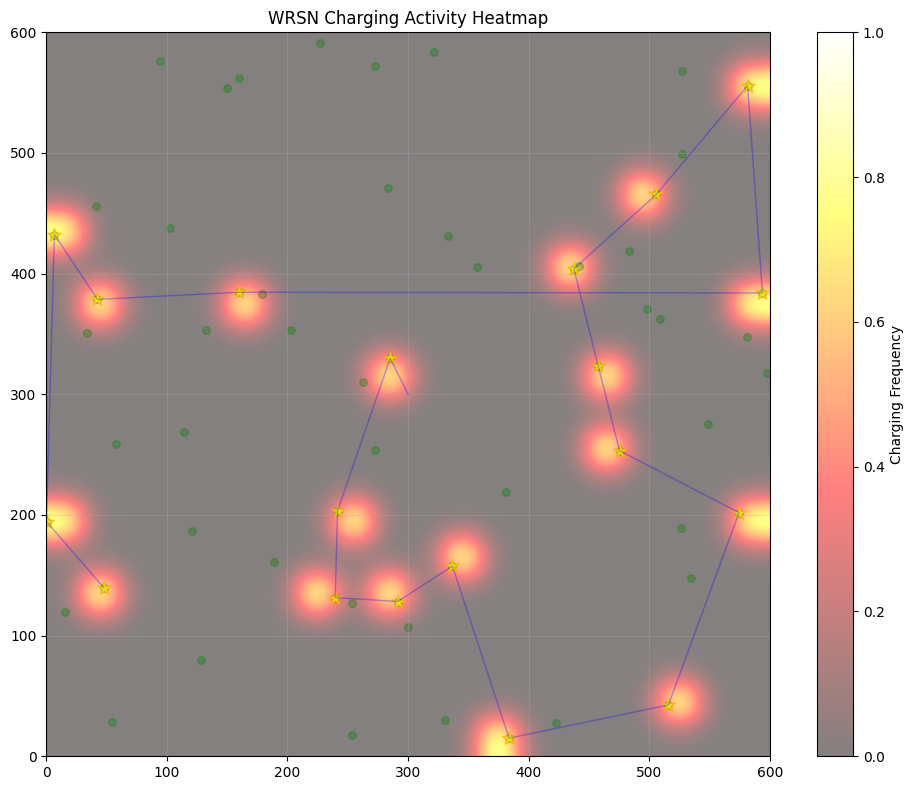

In [87]:
def visualize_continuous_charging_path(num_steps=20, time_step=3, num_sensors=60, path_segments=5):
    """
    Visualizes a mobile charger moving through the network and charging
    sensors continuously along its path.
    """
    # Set a fixed seed for reproducibility
    random.seed(42)
    np.random.seed(42)
    
    # Initialize environment with many sensors
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Set varied energy levels
    for i, s in enumerate(sensors):
        # Create a mix of energy levels
        if i % 5 == 0:  # 20% very low
            s.energy = 0.05 * s.capacity
        elif i % 5 == 1:  # 20% low
            s.energy = 0.15 * s.capacity
        elif i % 5 == 2:  # 20% medium
            s.energy = 0.4 * s.capacity
        
        # Use very low consumption rates to keep simulation running longer
        s.consumption_rate = random.uniform(0.05, 0.3)
    
    # Path tracking and statistics
    path_x = [mc.x]
    path_y = [mc.y]
    charging_events = []
    total_energy_transferred = 0
    initial_energy = {s.id: s.energy for s in sensors}
    
    # Create animation data storage
    all_paths_x = []
    all_paths_y = []
    all_mc_positions = []
    all_charged_nodes_history = []
    step_energy_values = []
    
    # Main simulation loop
    for step in range(num_steps):
        print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Find sensors needing charging
        to_charge = [s for s in sensors if s.needs_charging()]
        if not to_charge:
            # Let energy deplete if no sensors need charging
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging. Letting energy deplete...")
            continue
        
        # Prioritize based on energy level and distance
        def priority_score(sensor):
            distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
            energy_ratio = sensor.energy / sensor.capacity
            # Lower energy and shorter distance = higher priority
            return distance * 0.5 + energy_ratio * 100  # Weigh energy level more
        
        # Sort by priority
        to_charge.sort(key=priority_score)
        target = to_charge[0]
        print(f"Moving to sensor {target.id} ({target.energy/target.capacity:.1%} charge)")
        
        # Save current position
        start_point = (mc.x, mc.y)
        end_point = (target.x, target.y)
        
        # Move and charge continuously along path
        energy_transferred, charged_node_ids, path_segment_x, path_segment_y = move_and_charge_along_path(
            mc, start_point, end_point, sensors, path_segments=path_segments
        )
        
        # Update tracking variables
        path_x.extend(path_segment_x[1:])  # Skip first point (already in path_x)
        path_y.extend(path_segment_y[1:])
        total_energy_transferred += energy_transferred
        
        # Store animation data for this step
        all_paths_x.append(path_segment_x)
        all_paths_y.append(path_segment_y)
        all_mc_positions.append((mc.x, mc.y))
        all_charged_nodes_history.append(charged_node_ids)
        
        # Store energy values for all sensors at this step
        step_energy_values.append({s.id: s.energy for s in sensors})
        
        if charged_node_ids:
            print(f"Charged {len(charged_node_ids)} sensors with {energy_transferred:.1f}J while moving")
            charging_events.append((mc.x, mc.y, step+1))
        
        # Regular energy consumption for all sensors
        for s in sensors:
            s.update_energy(time_step)
            
        # Visualize current state
        visualize_continuous_path_step(
            sensors, mc, all_paths_x, all_paths_y, 
            charging_events, step+1, all_charged_nodes_history
        )
    
    # Show final energy summary
    final_energy = {s.id: s.energy for s in sensors}
    charged_count = sum(1 for s_id in initial_energy if final_energy[s_id] > initial_energy[s_id])
    depleted_count = sum(1 for s_id in initial_energy if final_energy[s_id] < initial_energy[s_id])
    
    print("\nEnergy Change Summary:")
    for s_id in initial_energy:
        initial = initial_energy[s_id]
        final = final_energy[s_id]
        change = final - initial
        status = "CHARGED" if change > 0 else "DEPLETED" if change < 0 else "UNCHANGED"
        print(f"Sensor {s_id}: {initial:.1f}J → {final:.1f}J ({change:+.1f}J) - {status}")
    
    # Overall statistics
    print(f"\nOverall Statistics:")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Final status: Charged: {charged_count}, Depleted: {depleted_count}")
    print(f"MC remaining energy: {mc.energy:.1f}J")
    
    # Show heatmap
    visualize_charging_heatmap(path_x, path_y, charging_events, sensors)
    
def visualize_continuous_path_step(sensors, mc, all_paths_x, all_paths_y, 
                                  charging_events, step, all_charged_nodes_history):
    """Visualize path with continuous charging markers along the path"""
    plt.figure(figsize=(14, 10))
    
    # Plot environment basics
    alive_sensors = [s for s in sensors if not s.dead]
    dead_sensors = [s for s in sensors if s.dead]
    
    # Plot sensors with color intensity based on energy level
    for s in alive_sensors:
        energy_ratio = min(max(s.energy / s.capacity, 0.0), 1.0)
        color = [(1-energy_ratio), energy_ratio, 0]
        plt.scatter(s.x, s.y, c=[color], s=80, edgecolors='black', zorder=2)
        plt.annotate(f"{s.id}", (s.x, s.y), xytext=(-5, -5), 
                   textcoords="offset points", ha='center', fontsize=8)
    
    # Plot dead sensors
    if dead_sensors:
        plt.scatter([s.x for s in dead_sensors], [s.y for s in dead_sensors], 
                  c='red', marker='x', s=100, label='Dead Sensors', zorder=1)
    
    # Plot base station
    plt.scatter(300, 300, c='black', marker='s', s=100, label='Base Station')
    
    # Draw current charging radius
    circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, color='blue', 
                      fill=False, linestyle='--', alpha=0.5)
    plt.gcf().gca().add_artist(circle)
    
    # Plot path segments with gradient coloring to show time progression
    for i, (path_x, path_y) in enumerate(zip(all_paths_x, all_paths_y)):
        # Use color gradient from light to dark blue to show chronology
        color_intensity = 0.3 + 0.7 * (i / len(all_paths_x))
        
        # Plot path with arrows
        for j in range(len(path_x)-1):
            dx = path_x[j+1] - path_x[j]
            dy = path_y[j+1] - path_y[j]
            plt.arrow(path_x[j], path_y[j], dx*0.8, dy*0.8,
                    head_width=8, head_length=8, 
                    fc=(0, 0, color_intensity), ec=(0, 0, color_intensity),
                    zorder=3, length_includes_head=True, alpha=0.7)
        
        # Show nodes charged in this segment
        charged_nodes = all_charged_nodes_history[i]
        if charged_nodes:
            for node_id in charged_nodes:
                # Find the sensor
                for s in sensors:
                    if s.id == node_id:
                        # Draw a connecting line showing charging happened
                        # Find the closest point on path to this sensor
                        distances = [np.linalg.norm([x-s.x, y-s.y]) for x, y in zip(path_x, path_y)]
                        min_dist_idx = distances.index(min(distances))
                        closest_x, closest_y = path_x[min_dist_idx], path_y[min_dist_idx]
                        
                        # Draw a curve showing charging happened
                        plt.plot([closest_x, s.x], [closest_y, s.y], 'y-', 
                               alpha=0.3, linewidth=1.5, zorder=1, linestyle=':')
            
    # Plot charging events
    for cx, cy, event_step in charging_events:
        if event_step <= step:
            plt.scatter(cx, cy, c='yellow', edgecolors='orange', s=200, 
                      marker='*', zorder=4, alpha=0.8)
    
    # Plot current MC position
    plt.scatter(mc.x, mc.y, c='blue', marker='X', s=150, label='Mobile Charger')
    
    # Add MC energy status
    plt.annotate(f"MC Energy: {mc.energy:.0f}J", xy=(0.02, 0.98), xycoords='axes fraction',
               bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
               va='top')
    
    # Add custom legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = [
        Patch(facecolor=(0,1,0), edgecolor='black', label='Full Energy'),
        Patch(facecolor=(0.5,0.5,0), edgecolor='black', label='Half Energy'),
        Patch(facecolor=(1,0,0), edgecolor='black', label='Low Energy'),
        Line2D([0], [0], marker='X', color='w', markerfacecolor='blue', markersize=10, label='Mobile Charger'),
        Line2D([0], [0], color='blue', lw=2, label='Charger Path'),
        Line2D([0], [0], color='yellow', linestyle=':', lw=2, label='Charging While Moving'),
        Line2D([0], [0], marker='*', color='w', markerfacecolor='yellow', markersize=10, label='Stopping Point')
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Set title and grid
    plt.title(f"Continuous Charging Visualization (Step {step})")
    plt.grid(True, alpha=0.3)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.tight_layout()
    plt.show()

# Run the simulation with continuous charging
visualize_continuous_charging_path(
    num_steps=20,       # Run for 20 steps
    time_step=2,        # Very slow energy consumption
    num_sensors=60,     # More sensors for better visualization
    path_segments=8     # Divide each path into 8 segments for charging
)

In [88]:
def visualize_sensor_priorities(sensors, mc, path_history=None):
    """
    Visualize sensors with their adaptive priority scores, mobile charger path,
    and charging zones
    """
    plt.figure(figsize=(12, 10))
    
    # Draw charging zones
    outer_circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, 
                             color='red', fill=True, alpha=0.1, label="Outer Zone (30%)")
    middle_circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS * 0.7, 
                              color='yellow', fill=True, alpha=0.15, label="Middle Zone (50%)")
    inner_circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS * 0.4, 
                             color='green', fill=True, alpha=0.2, label="Inner Zone (70%)")
    
    plt.gcf().gca().add_artist(outer_circle)
    plt.gcf().gca().add_artist(middle_circle)
    plt.gcf().gca().add_artist(inner_circle)
    
    # Calculate priorities for all alive sensors
    sensor_priorities = []
    for s in sensors:
        if not s.dead:
            priority = calculate_adaptive_priority(s, mc)
            sensor_priorities.append((s, priority))
    
    # Normalize priorities for visualization
    max_priority = max(p for _, p in sensor_priorities) if sensor_priorities else 1.0
    
    # Plot path history if provided
    if path_history and len(path_history) > 1:
        path_x = [p[0] for p in path_history]
        path_y = [p[1] for p in path_history]
        
        # Plot path with gradient to show direction/time
        for i in range(len(path_history) - 1):
            # Calculate gradient color (from light to darker blue)
            alpha = 0.3 + 0.7 * (i / max(1, len(path_history) - 2))
            color = (0, 0, 0.8, alpha)
            
            # Draw line segment with arrow to show direction
            plt.arrow(path_x[i], path_y[i], 
                     path_x[i+1] - path_x[i], 
                     path_y[i+1] - path_y[i],
                     head_width=10, head_length=10, 
                     fc=color, ec=color, 
                     length_includes_head=True,
                     zorder=2)
        
        # Mark visited points along the path
        plt.scatter(path_x[:-1], path_y[:-1], c='blue', alpha=0.5, 
                   s=30, marker='o', label='Previous Positions')
    
    # Plot sensors with color based on priority
    for s, priority in sensor_priorities:
        # Normalize to 0-1 range
        norm_priority = priority / max_priority
        
        # Use color scale: red (high priority) to blue (low priority)
        color = [norm_priority, 0, 1-norm_priority]
        size = 50 + norm_priority * 100  # Size also reflects priority
        
        plt.scatter(s.x, s.y, c=[color], s=size, alpha=0.7, edgecolors='black', zorder=3)
        
        # Show priority score and sensor ID
        plt.annotate(f"ID:{s.id}\nP:{priority:.2f}", (s.x, s.y), 
                    xytext=(5, 5), textcoords="offset points", fontsize=8)
        
        # Show energy level and consumption rate
        energy_pct = s.energy / s.capacity * 100
        plt.annotate(f"{energy_pct:.0f}% | {s.consumption_rate:.1f}J/s", (s.x, s.y), 
                    xytext=(5, -10), textcoords="offset points", fontsize=7,
                    color='green' if energy_pct > 50 else 'red')
    
    # Determine charging zone for each sensor and annotate
    for s in sensors:
        if not s.dead:
            distance = np.linalg.norm([mc.x - s.x, mc.y - s.y])
            if distance <= CHARGING_RADIUS:
                distance_ratio = distance / CHARGING_RADIUS
                
                # Determine zone and efficiency
                if distance_ratio <= 0.4:
                    eff = "70%"
                    color = 'green'
                elif distance_ratio <= 0.7:
                    eff = "50%"
                    color = 'gold'
                else:
                    eff = "30%"
                    color = 'red'
                    
                # Add charging efficiency label
                plt.annotate(eff, (s.x, s.y), 
                            xytext=(0, 15), textcoords="offset points", 
                            ha='center', color=color, fontweight='bold',
                            bbox=dict(boxstyle="round,pad=0.1", fc='white', alpha=0.7))
    
    # Plot dead sensors
    dead_x = [s.x for s in sensors if s.dead]
    dead_y = [s.y for s in sensors if s.dead]
    if dead_x:
        plt.scatter(dead_x, dead_y, c='black', marker='x', s=100, label='Dead Sensors')
    
    # Plot Mobile Charger and Base Station
    plt.scatter(mc.x, mc.y, c='blue', marker='X', s=150, label='Mobile Charger', zorder=5)
    plt.scatter(300, 300, c='black', marker='s', s=100, label='Base Station', zorder=5)
    
    # Add information box with MC energy
    info_text = f"MC Energy: {mc.energy:.0f}J ({mc.energy/MC_CAPACITY:.1%})\n"
    info_text += f"Alive Sensors: {sum(1 for s in sensors if not s.dead)}/{len(sensors)}"
    
    plt.annotate(info_text, xy=(0.02, 0.98), xycoords='axes fraction',
               bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8),
               va='top', fontsize=10)
    
    # Add zone-based legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    
    legend_elements = [
        Patch(facecolor='red', edgecolor='black', label='High Priority'),
        Patch(facecolor='purple', edgecolor='black', label='Medium Priority'),
        Patch(facecolor='blue', edgecolor='black', label='Low Priority'),
        Line2D([0], [0], marker='X', color='w', markerfacecolor='blue', markersize=10, label='Mobile Charger'),
        Patch(facecolor='green', alpha=0.2, label='Inner Zone (70%)'),
        Patch(facecolor='yellow', alpha=0.15, label='Middle Zone (50%)'),
        Patch(facecolor='red', alpha=0.1, label='Outer Zone (30%)')
    ]
    
    if path_history and len(path_history) > 1:
        legend_elements.append(Line2D([0], [0], color='blue', alpha=0.7, lw=2, label='Charger Path'))
    
    plt.legend(handles=legend_elements, loc='upper right')
    
    plt.title("Sensor Nodes with Adaptive Priority and Charging Zones")
    plt.grid(True, alpha=0.3)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.tight_layout()
    plt.show()

--- Step 1/15 --- MC Energy: 1000000.0J
Moving to sensor 0 (10.0% charge)
Charged 9 sensors with 30366.9J while moving


C:\Users\akshi\AppData\Local\Temp\ipykernel_23716\1353046203.py:224: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "y-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot([closest_x, s.x], [closest_y, s.y], 'y-',


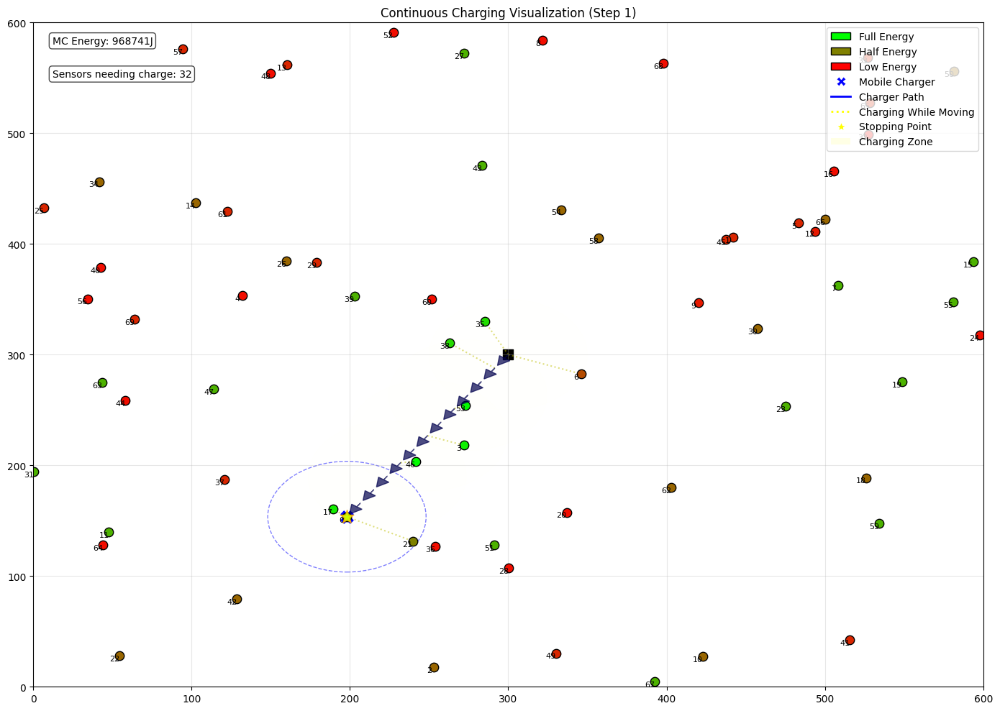

--- Step 2/15 --- MC Energy: 968741.3J
Moving to sensor 9 (10.0% charge)
Charged 9 sensors with 12047.8J while moving


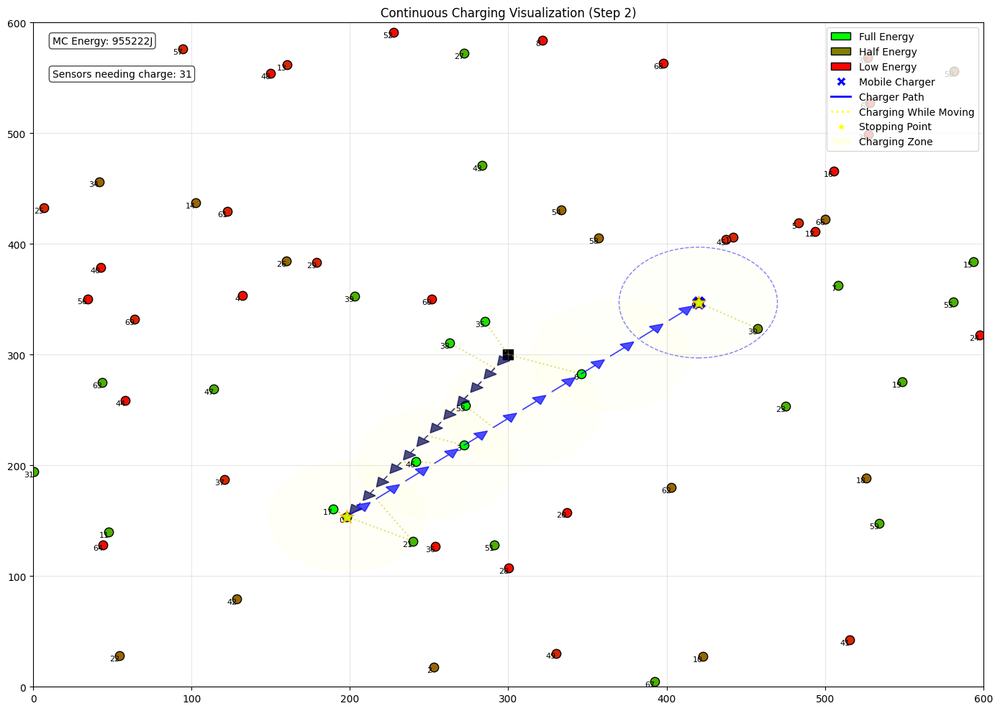

--- Step 3/15 --- MC Energy: 955221.8J
Moving to sensor 12 (10.0% charge)
Charged 8 sensors with 27684.3J while moving


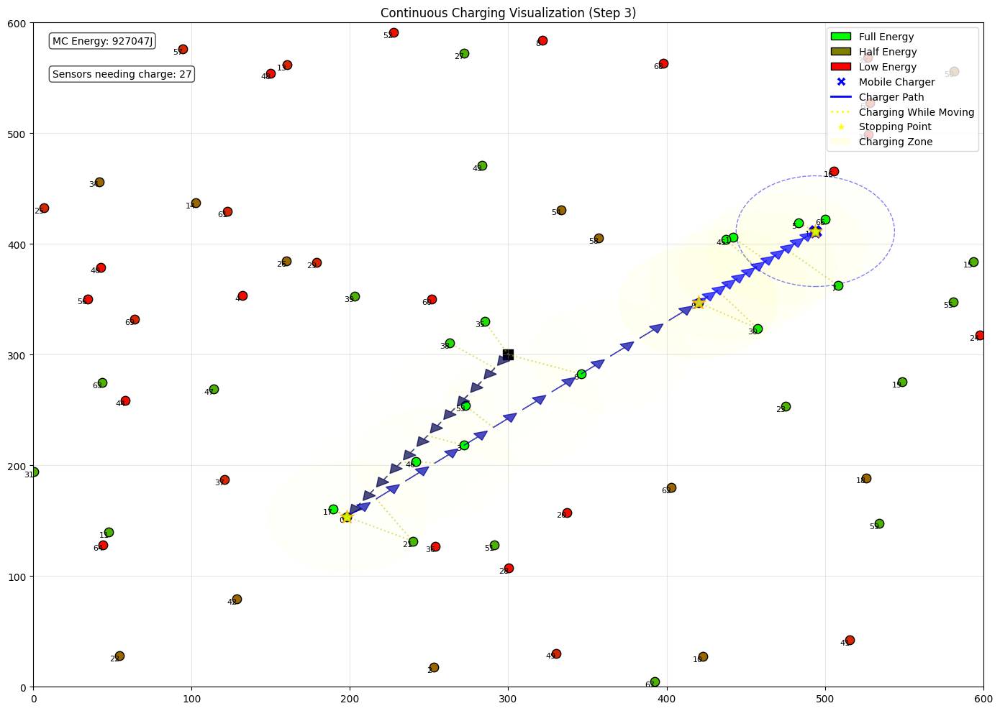

--- Step 4/15 --- MC Energy: 927047.0J
Moving to sensor 16 (5.0% charge)
Charged 5 sensors with 9510.8J while moving


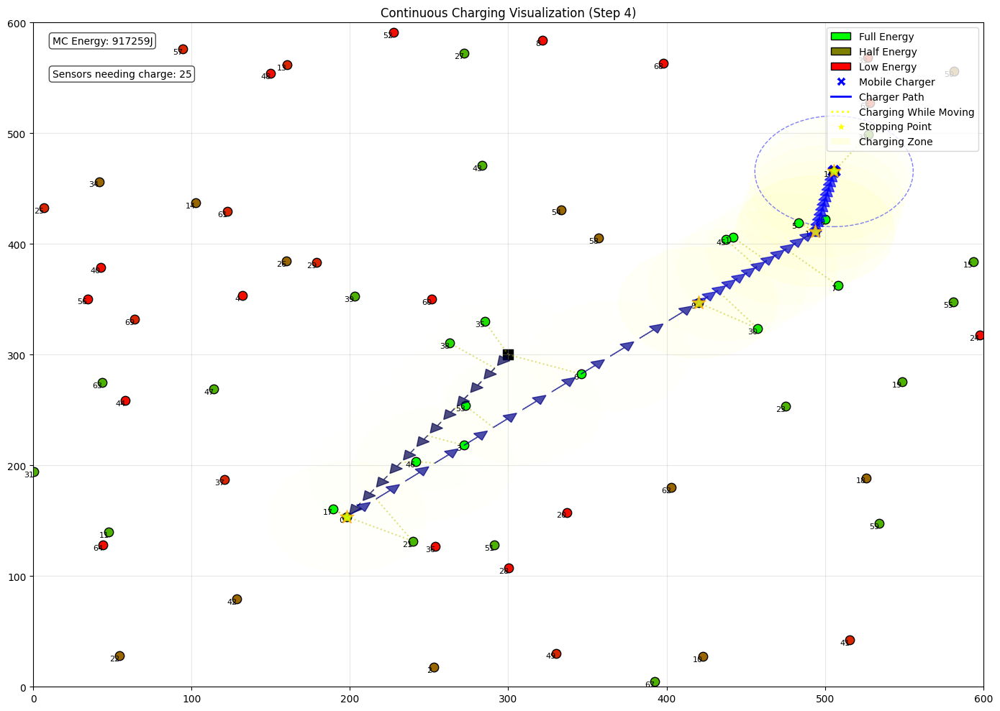

--- Step 5/15 --- MC Energy: 917259.5J
Moving to sensor 65 (15.0% charge)
Charged 5 sensors with 9760.3J while moving


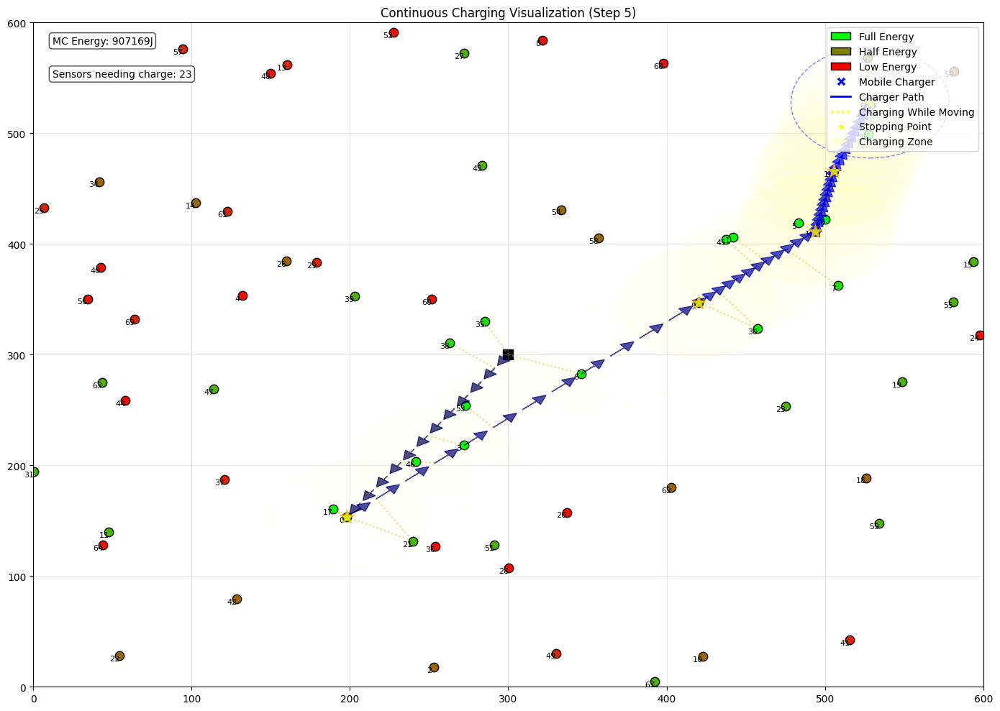

--- Step 6/15 --- MC Energy: 907169.0J
Moving to sensor 68 (5.0% charge)
Charged 4 sensors with 7560.4J while moving


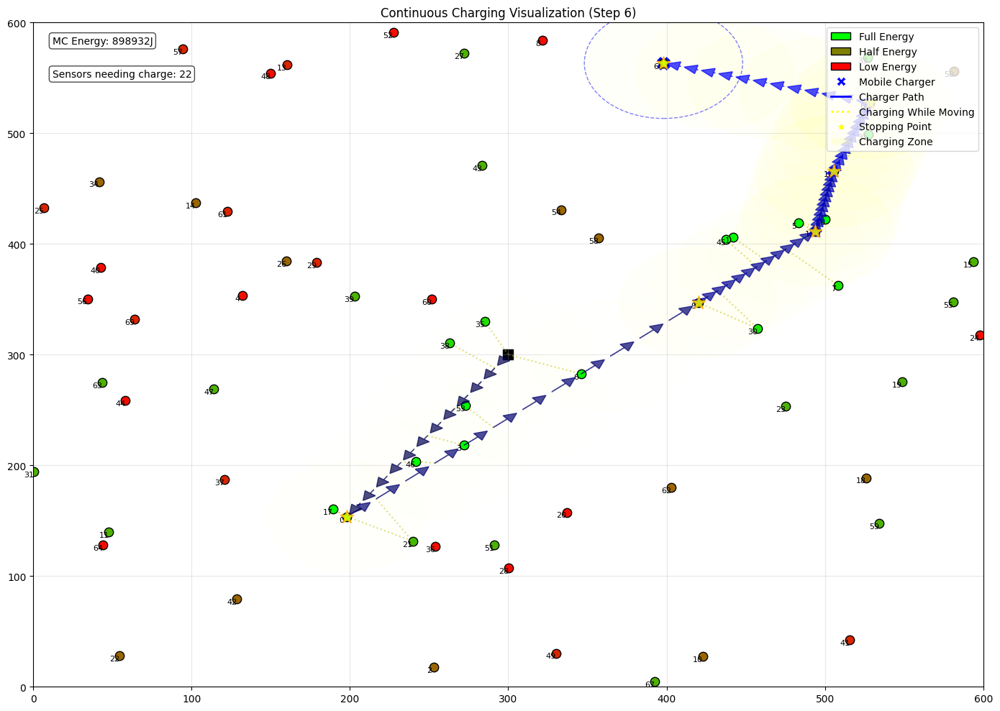

--- Step 7/15 --- MC Energy: 898932.1J
Moving to sensor 8 (5.0% charge)
Charged 2 sensors with 5847.7J while moving


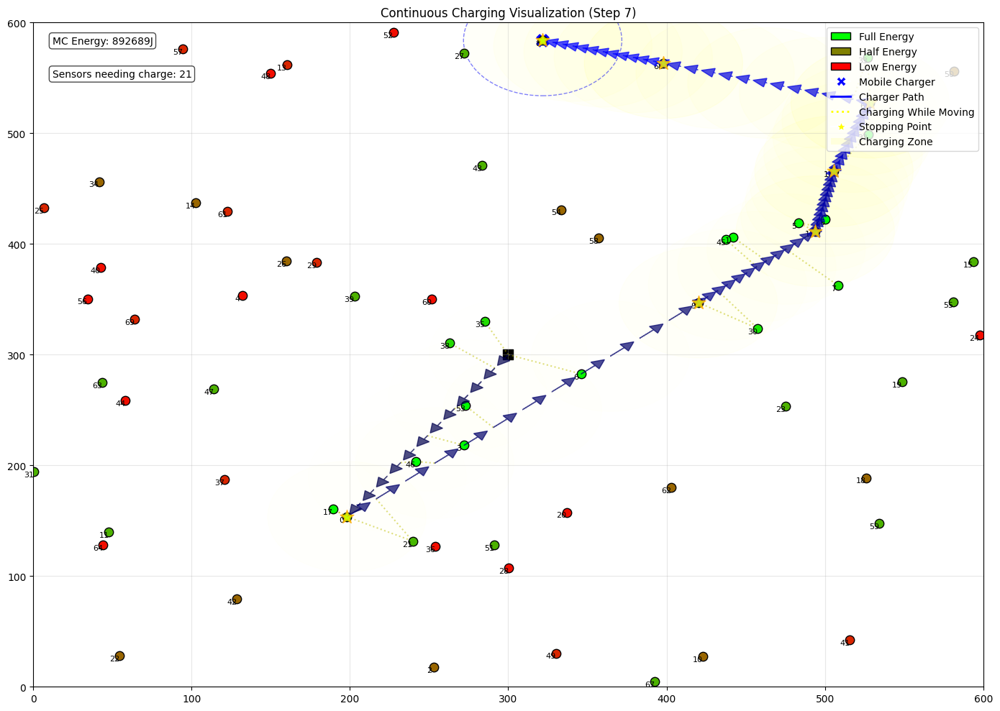

--- Step 8/15 --- MC Energy: 892689.4J
Moving to sensor 52 (5.0% charge)
Charged 3 sensors with 7473.6J while moving


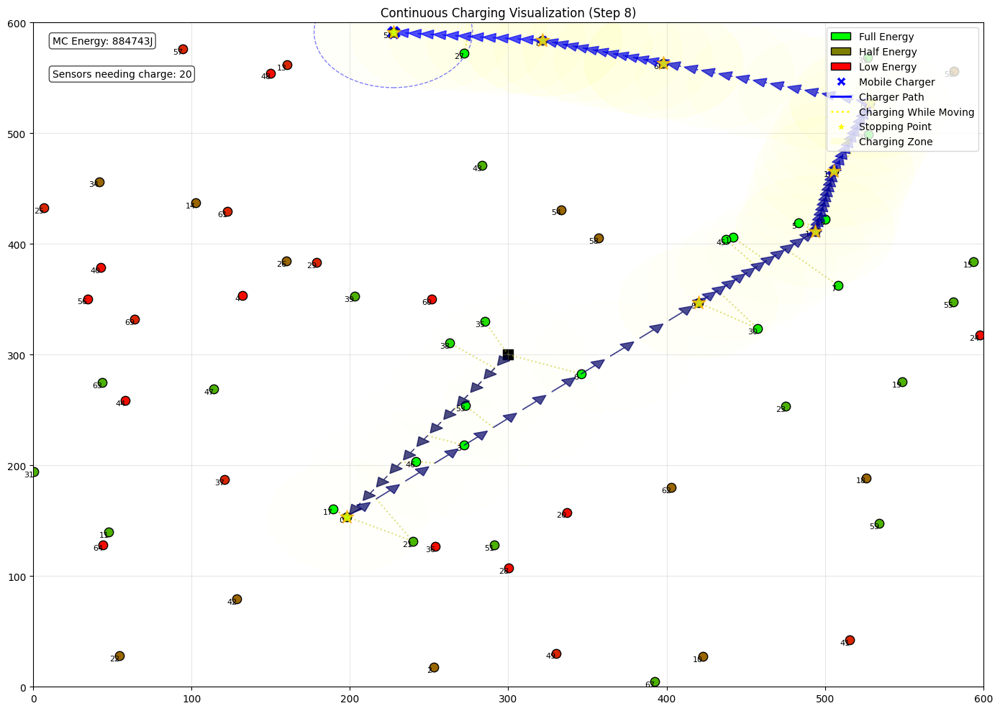

--- Step 9/15 --- MC Energy: 884742.6J
Moving to sensor 48 (5.0% charge)
Charged 4 sensors with 10806.0J while moving


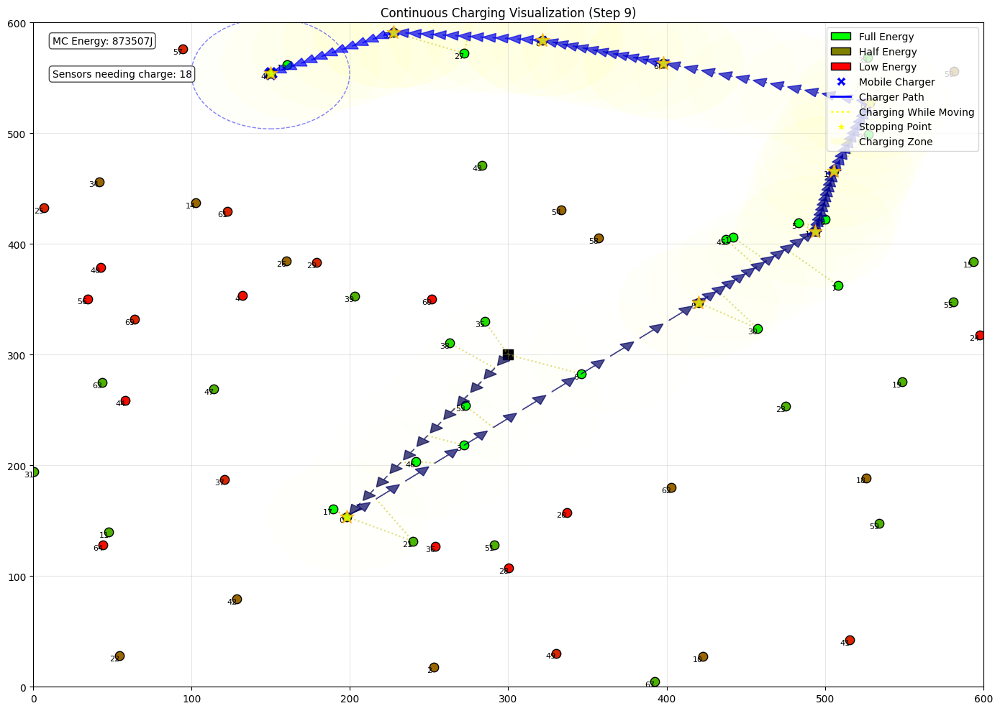

--- Step 10/15 --- MC Energy: 873506.7J
Moving to sensor 57 (15.0% charge)
Charged 3 sensors with 5143.8J while moving


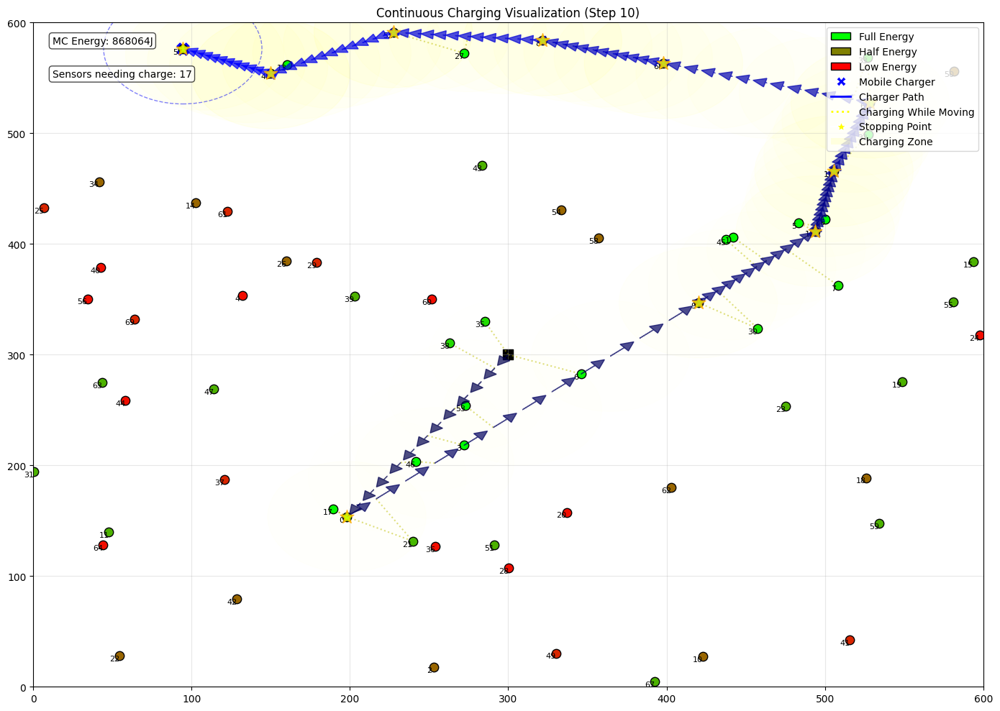

--- Step 11/15 --- MC Energy: 868063.8J
Moving to sensor 61 (15.0% charge)
Charged 3 sensors with 8322.3J while moving


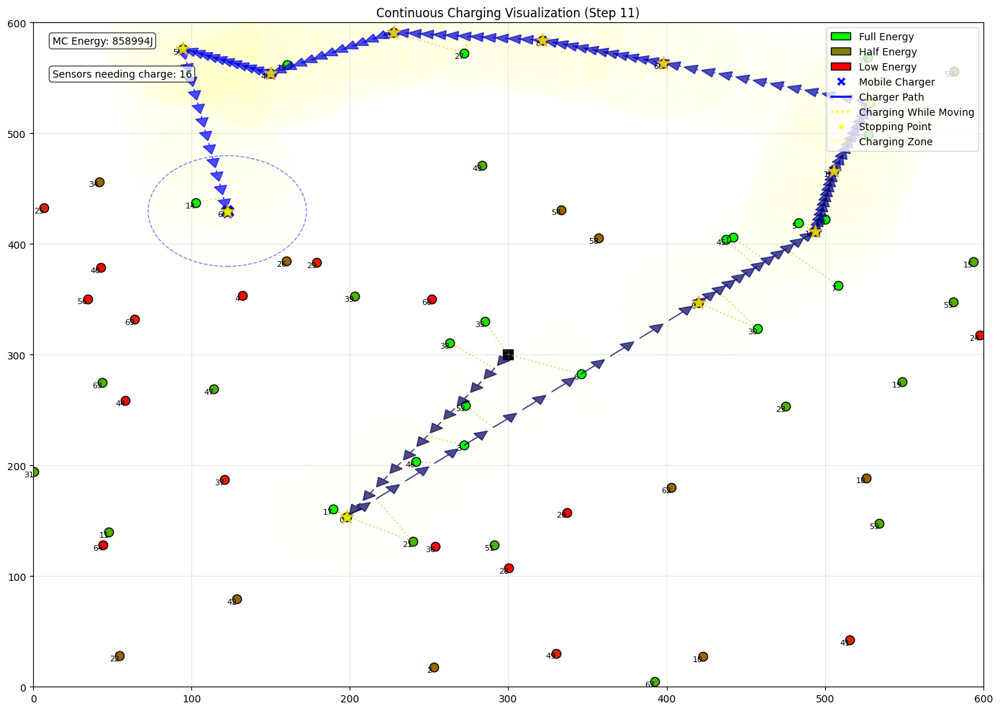

--- Step 12/15 --- MC Energy: 858994.4J
Moving to sensor 4 (5.0% charge)
Charged 4 sensors with 9612.3J while moving


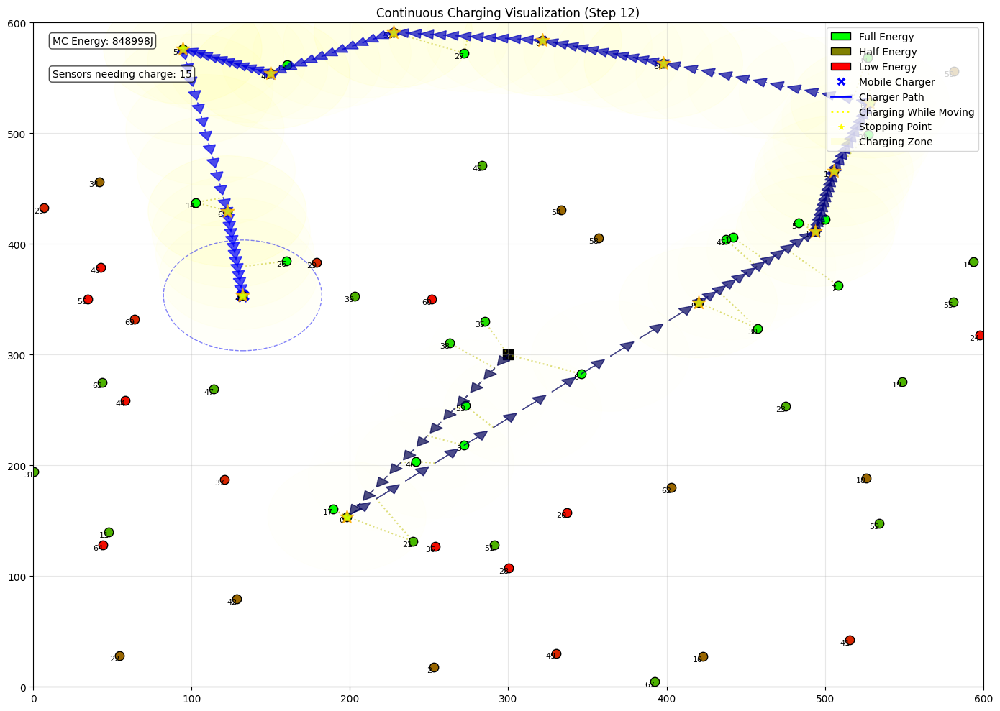

--- Step 13/15 --- MC Energy: 848998.2J
Moving to sensor 29 (15.0% charge)
Charged 4 sensors with 6780.6J while moving


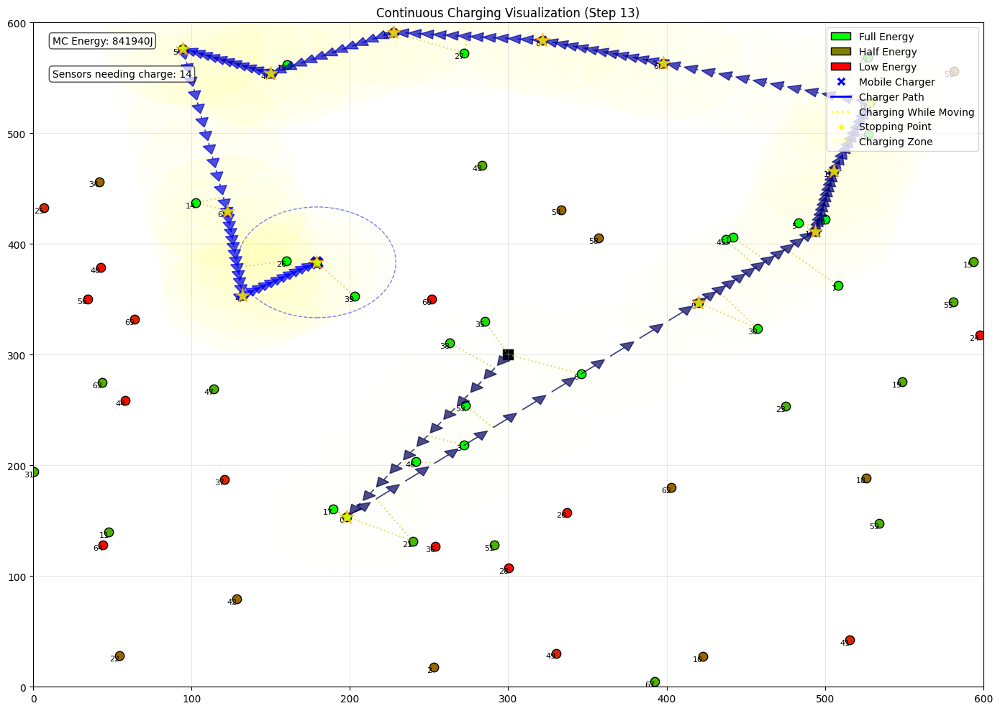

--- Step 14/15 --- MC Energy: 841940.1J
Moving to sensor 60 (5.0% charge)
Charged 6 sensors with 6668.7J while moving


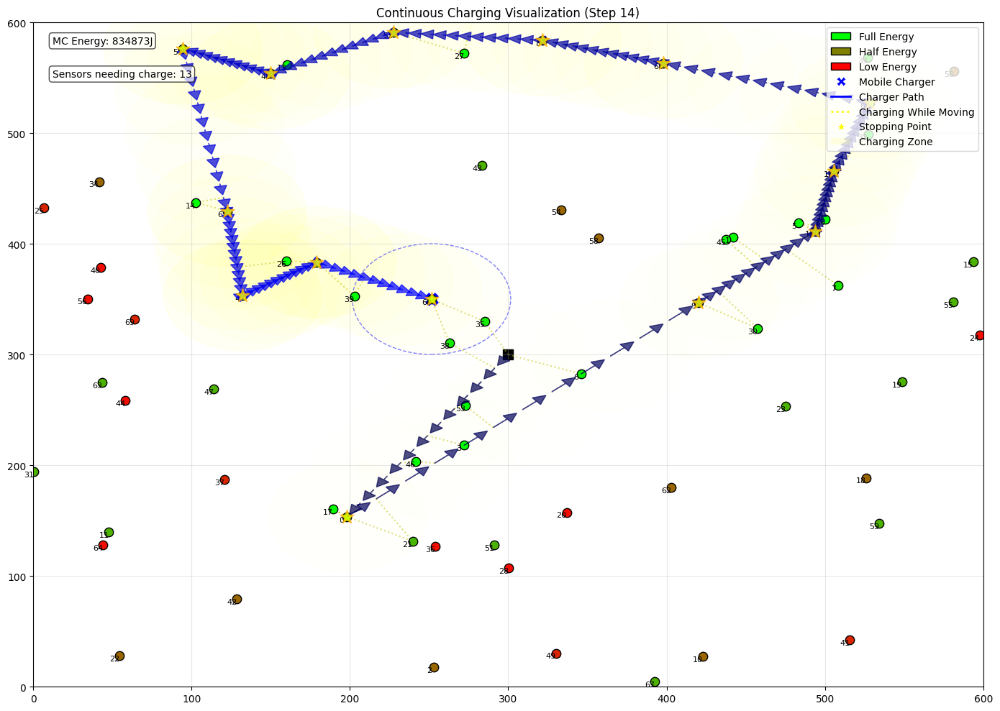

--- Step 15/15 --- MC Energy: 834872.9J
Moving to sensor 69 (15.0% charge)
Charged 9 sensors with 7994.2J while moving


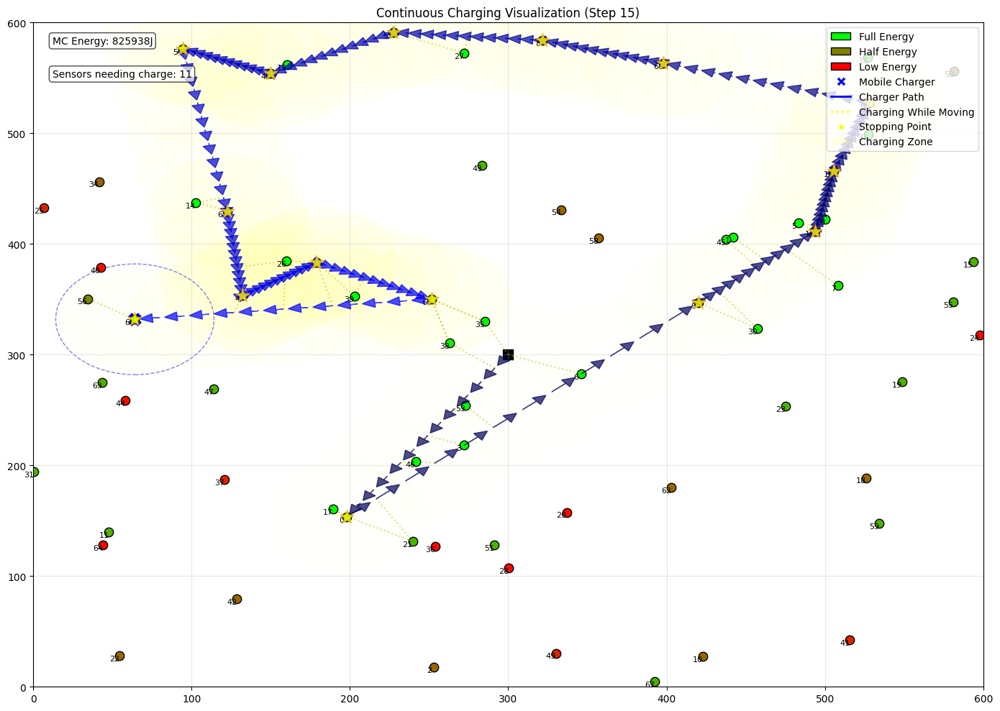


Energy Change Summary:
Sensor 0: 600.0J → 5958.1J (+5358.1J) - CHARGED
Sensor 1: 900.0J → 5911.3J (+5011.3J) - CHARGED
Sensor 2: 2400.0J → 2398.0J (-2.0J) - DEPLETED
Sensor 3: 600.0J → 5981.4J (+5381.4J) - CHARGED
Sensor 4: 300.0J → 5999.9J (+5699.9J) - CHARGED
Sensor 5: 900.0J → 5997.8J (+5097.8J) - CHARGED
Sensor 6: 600.0J → 5772.0J (+5172.0J) - CHARGED
Sensor 7: 4200.0J → 5377.5J (+1177.5J) - CHARGED
Sensor 8: 300.0J → 5999.0J (+5699.0J) - CHARGED
Sensor 9: 600.0J → 5992.5J (+5392.5J) - CHARGED
Sensor 10: 2400.0J → 2399.7J (-0.3J) - DEPLETED
Sensor 11: 4200.0J → 4197.6J (-2.4J) - DEPLETED
Sensor 12: 600.0J → 5998.4J (+5398.4J) - CHARGED
Sensor 13: 900.0J → 5999.5J (+5099.5J) - CHARGED
Sensor 14: 2400.0J → 5988.4J (+3588.4J) - CHARGED
Sensor 15: 4200.0J → 4198.2J (-1.8J) - DEPLETED
Sensor 16: 300.0J → 5998.9J (+5698.9J) - CHARGED
Sensor 17: 900.0J → 5892.1J (+4992.1J) - CHARGED
Sensor 18: 2400.0J → 2399.5J (-0.5J) - DEPLETED
Sensor 19: 4200.0J → 4197.3J (-2.7J) - DEPLETED
Sensor 20:

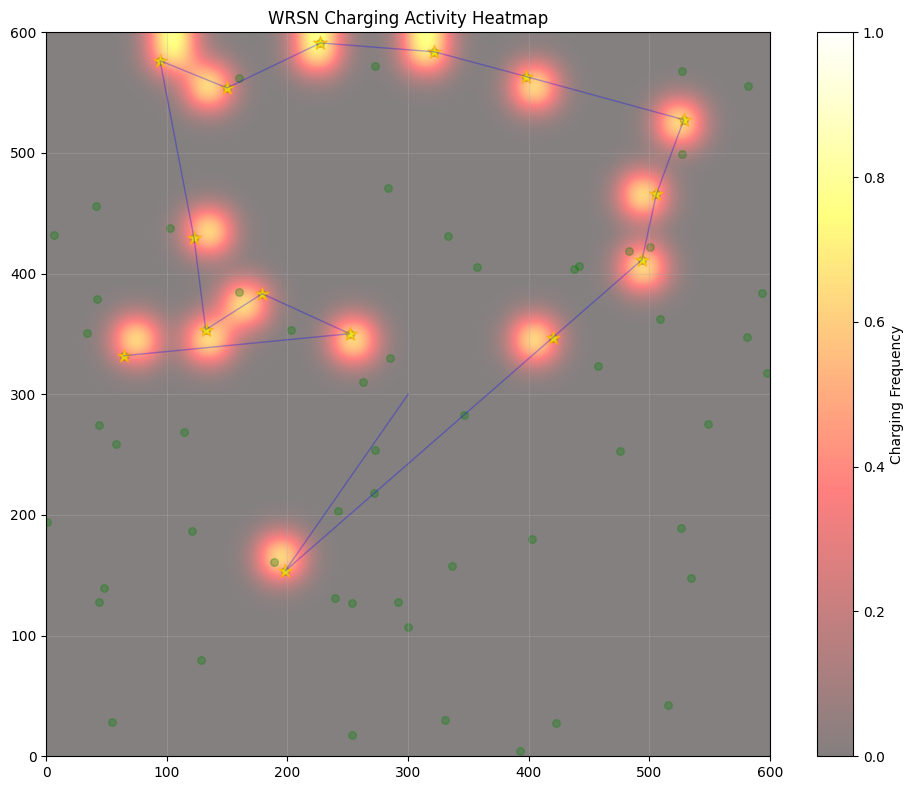

In [89]:
def visualize_enhanced_continuous_charging(num_steps=20, time_step=1, num_sensors=70, path_segments=12):
    """
    Enhanced visualization showing all sensors being charged as the mobile charger moves.
    Uses more path segments for smoother movement and charging.
    """
    # Set a fixed seed for reproducibility
    random.seed(42)
    np.random.seed(42)
    
    # Initialize environment with even more sensors for better visualization
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Set varied energy levels - more sensors at low energy to show charging effect
    for i, s in enumerate(sensors):
        # Create a mix of energy levels with more low-energy sensors
        if i % 4 == 0:  # 25% very low
            s.energy = 0.05 * s.capacity
        elif i % 4 == 1:  # 25% low
            s.energy = 0.15 * s.capacity 
        elif i % 4 == 2:  # 25% medium
            s.energy = 0.4 * s.capacity
        else:
            s.energy = 0.7 * s.capacity
        
        # Use very low consumption rates to keep simulation running longer
        s.consumption_rate = random.uniform(0.02, 0.2)
    
    # Cluster some sensors to make charging while moving more visible
    # Place a group of 5 sensors in a line that the charger will pass through
    line_start_x, line_start_y = random.uniform(100, 200), random.uniform(100, 200)
    line_end_x, line_end_y = random.uniform(400, 500), random.uniform(400, 500)
    for i in range(5):
        progress = i / 4.0  # 0 to 1
        x = line_start_x + (line_end_x - line_start_x) * progress
        y = line_start_y + (line_end_y - line_start_y) * progress
        # Override 5 existing sensors with these positioned sensors
        sensors[i*3].x = x
        sensors[i*3].y = y
        sensors[i*3].energy = 0.1 * sensors[i*3].capacity  # Low energy to need charging
    
    # Path tracking and statistics
    path_x = [mc.x]
    path_y = [mc.y]
    charging_events = []
    total_energy_transferred = 0
    initial_energy = {s.id: s.energy for s in sensors}
    
    # Create animation data storage
    all_paths_x = []
    all_paths_y = []
    all_mc_positions = []
    all_charged_nodes_history = []
    
    # Main simulation loop
    for step in range(num_steps):
        print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Find sensors needing charging
        to_charge = [s for s in sensors if s.needs_charging()]
        if not to_charge:
            # Let energy deplete if no sensors need charging
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging. Letting energy deplete...")
            continue
        
        # Prioritize based on energy level and distance
        # Modified to highly favor sensors in a line (to show charging while moving)
        def priority_score(sensor):
            distance = np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y])
            energy_ratio = sensor.energy / sensor.capacity
            
            # Check if this is one of our lined-up sensors
            is_lined_up = any(np.linalg.norm([sensor.x - sensors[i*3].x, sensor.y - sensors[i*3].y]) < 0.1 
                             for i in range(5))
            
            # Heavily prioritize sensors in our line if they need charging
            if is_lined_up and energy_ratio < 0.3:
                return -1000  # Super high priority
            
            # Otherwise use normal priority formula
            return distance * 0.5 + energy_ratio * 100
        
        # Sort by priority
        to_charge.sort(key=priority_score)
        target = to_charge[0]
        print(f"Moving to sensor {target.id} ({target.energy/target.capacity:.1%} charge)")
        
        # Save current position
        start_point = (mc.x, mc.y)
        end_point = (target.x, target.y)
        
        # Move and charge continuously along path with more segments for smoother movement
        energy_transferred, charged_node_ids, path_segment_x, path_segment_y = move_and_charge_along_path(
            mc, start_point, end_point, sensors, path_segments=path_segments
        )
        
        # Update tracking variables
        path_x.extend(path_segment_x[1:])  # Skip first point (already in path_x)
        path_y.extend(path_segment_y[1:])
        total_energy_transferred += energy_transferred
        
        # Store animation data for this step
        all_paths_x.append(path_segment_x)
        all_paths_y.append(path_segment_y)
        all_mc_positions.append((mc.x, mc.y))
        all_charged_nodes_history.append(charged_node_ids)
        
        if charged_node_ids:
            print(f"Charged {len(charged_node_ids)} sensors with {energy_transferred:.1f}J while moving")
            charging_events.append((mc.x, mc.y, step+1))
        
        # Regular energy consumption for all sensors
        for s in sensors:
            s.update_energy(time_step)
            
        # Visualize current state with enhanced visualization
        visualize_enhanced_continuous_path_step(
            sensors, mc, all_paths_x, all_paths_y, 
            charging_events, step+1, all_charged_nodes_history
        )
    
    # Show final energy summary
    final_energy = {s.id: s.energy for s in sensors}
    charged_count = sum(1 for s_id in initial_energy if final_energy[s_id] > initial_energy[s_id])
    depleted_count = sum(1 for s_id in initial_energy if final_energy[s_id] < initial_energy[s_id])
    
    print("\nEnergy Change Summary:")
    for s_id in sorted(initial_energy.keys()):
        initial = initial_energy[s_id]
        final = final_energy[s_id]
        change = final - initial
        status = "CHARGED" if change > 0 else "DEPLETED" if change < 0 else "UNCHANGED"
        print(f"Sensor {s_id}: {initial:.1f}J → {final:.1f}J ({change:+.1f}J) - {status}")
    
    # Overall statistics
    print(f"\nOverall Statistics:")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Sensors charged: {charged_count}, Sensors depleted: {depleted_count}")
    print(f"MC remaining energy: {mc.energy:.1f}J")
    
    # Show heatmap of charging activity
    visualize_charging_heatmap(path_x, path_y, charging_events, sensors)

def visualize_enhanced_continuous_path_step(sensors, mc, all_paths_x, all_paths_y, 
                                           charging_events, step, all_charged_nodes_history):
    """Enhanced visualization that better shows charging while moving"""
    plt.figure(figsize=(14, 10))
    
    # Plot environment basics
    alive_sensors = [s for s in sensors if not s.dead]
    dead_sensors = [s for s in sensors if s.dead]
    
    # Plot sensors with color intensity based on energy level
    for s in alive_sensors:
        energy_ratio = min(max(s.energy / s.capacity, 0.0), 1.0)
        color = [(1-energy_ratio), energy_ratio, 0]
        plt.scatter(s.x, s.y, c=[color], s=80, edgecolors='black', zorder=2)
        plt.annotate(f"{s.id}", (s.x, s.y), xytext=(-5, -5), 
                   textcoords="offset points", ha='center', fontsize=8)
    
    # Plot dead sensors
    if dead_sensors:
        plt.scatter([s.x for s in dead_sensors], [s.y for s in dead_sensors], 
                  c='red', marker='x', s=100, label='Dead Sensors', zorder=1)
    
    # Plot base station
    plt.scatter(300, 300, c='black', marker='s', s=100, label='Base Station')
    
    # Draw current charging radius
    circle = plt.Circle((mc.x, mc.y), CHARGING_RADIUS, color='blue', 
                      fill=False, linestyle='--', alpha=0.5)
    plt.gcf().gca().add_artist(circle)
    
    # Plot previous charging areas with transparent circles
    for i, (path_x, path_y) in enumerate(zip(all_paths_x, all_paths_y)):
        if i >= step:
            continue
            
        # Draw faded charging circles at key points along the path
        for j in range(0, len(path_x), 3):  # Every 3rd point
            # Fade out older paths
            alpha = 0.05 + 0.2 * (i / max(1, len(all_paths_x)-1))
            charging_circle = plt.Circle(
                (path_x[j], path_y[j]), 
                CHARGING_RADIUS, 
                color='yellow', 
                fill=True, 
                alpha=alpha*0.1,
                zorder=0
            )
            plt.gcf().gca().add_artist(charging_circle)
    
    # Plot path segments with gradient coloring
    for i, (path_x, path_y) in enumerate(zip(all_paths_x, all_paths_y)):
        if i >= step:
            continue
            
        # Use color gradient from light to dark blue to show chronology
        color_intensity = 0.3 + 0.7 * (i / max(1, len(all_paths_x)-1))
        
        # Plot path with arrows
        for j in range(len(path_x)-1):
            dx = path_x[j+1] - path_x[j]
            dy = path_y[j+1] - path_y[j]
            plt.arrow(path_x[j], path_y[j], dx*0.8, dy*0.8,
                    head_width=8, head_length=8, 
                    fc=(0, 0, color_intensity), ec=(0, 0, color_intensity),
                    zorder=3, length_includes_head=True, alpha=0.7)
        
        # Show nodes charged in this segment
        charged_nodes = all_charged_nodes_history[i]
        if charged_nodes:
            for node_id in charged_nodes:
                # Find the sensor
                for s in sensors:
                    if s.id == node_id:
                        # Find the closest point on path to this sensor
                        distances = [np.linalg.norm([x-s.x, y-s.y]) for x, y in zip(path_x, path_y)]
                        min_dist_idx = distances.index(min(distances))
                        closest_x, closest_y = path_x[min_dist_idx], path_y[min_dist_idx]
                        
                        # Draw a line showing charging happened
                        plt.plot([closest_x, s.x], [closest_y, s.y], 'y-', 
                               alpha=0.5, linewidth=1.5, zorder=1, linestyle=':')
            
    # Plot charging events (stopping points)
    for cx, cy, event_step in charging_events:
        if event_step <= step:
            plt.scatter(cx, cy, c='yellow', edgecolors='orange', s=200, 
                      marker='*', zorder=4, alpha=0.8)
    
    # Plot current MC position
    plt.scatter(mc.x, mc.y, c='blue', marker='X', s=150, label='Mobile Charger')
    
    # Add MC energy status
    plt.annotate(f"MC Energy: {mc.energy:.0f}J", xy=(0.02, 0.98), xycoords='axes fraction',
               bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
               va='top')
    
    # Add sensor count stats
    charging_needed = sum(1 for s in sensors if s.needs_charging())
    plt.annotate(f"Sensors needing charge: {charging_needed}", xy=(0.02, 0.93), 
               xycoords='axes fraction',
               bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7),
               va='top')
    
    # Add custom legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = [
        Patch(facecolor=(0,1,0), edgecolor='black', label='Full Energy'),
        Patch(facecolor=(0.5,0.5,0), edgecolor='black', label='Half Energy'),
        Patch(facecolor=(1,0,0), edgecolor='black', label='Low Energy'),
        Line2D([0], [0], marker='X', color='w', markerfacecolor='blue', markersize=10, label='Mobile Charger'),
        Line2D([0], [0], color='blue', lw=2, label='Charger Path'),
        Line2D([0], [0], color='yellow', linestyle=':', lw=2, label='Charging While Moving'),
        Line2D([0], [0], marker='*', color='w', markerfacecolor='yellow', markersize=10, label='Stopping Point'),
        Patch(facecolor='yellow', alpha=0.1, label='Charging Zone')
    ]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Set title and grid
    plt.title(f"Continuous Charging Visualization (Step {step})")
    plt.grid(True, alpha=0.3)
    plt.xlim(0, AREA_WIDTH)
    plt.ylim(0, AREA_HEIGHT)
    plt.tight_layout()
    plt.show()

# Run the enhanced continuous charging visualization
visualize_enhanced_continuous_charging(
    num_steps=15,      # Run for 15 steps
    time_step=1,       # Very slow energy consumption
    num_sensors=70,    # More sensors for better visualization
    path_segments=12   # More segments for smoother movement
)

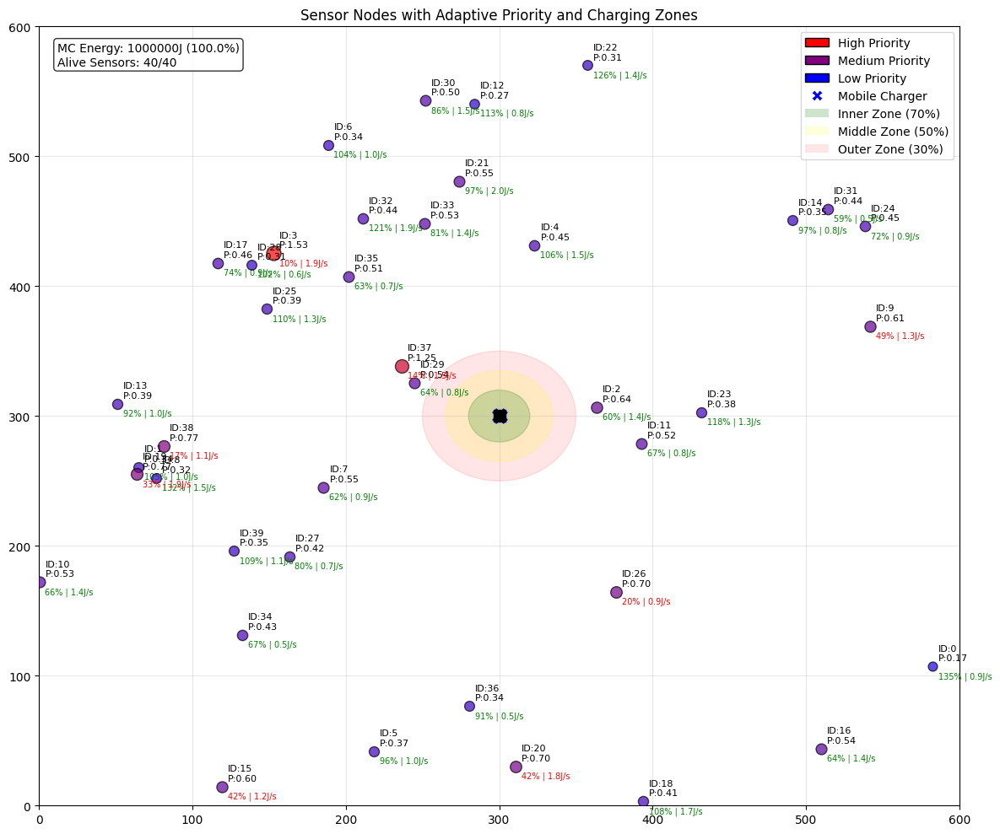

--- Step 1/12 --- MC Energy: 1000000.0J
Top priority sensors:
  1. Sensor 30: Priority=1.42, Energy=5.0%, Rate=1.10J/s, Distance=159.3m
  2. Sensor 15: Priority=1.25, Energy=5.0%, Rate=0.93J/s, Distance=305.5m
  3. Sensor 0: Priority=1.21, Energy=5.0%, Rate=0.85J/s, Distance=297.0m
Charged 3 sensors with 9643.7J while moving
Visualizing sensor priorities...


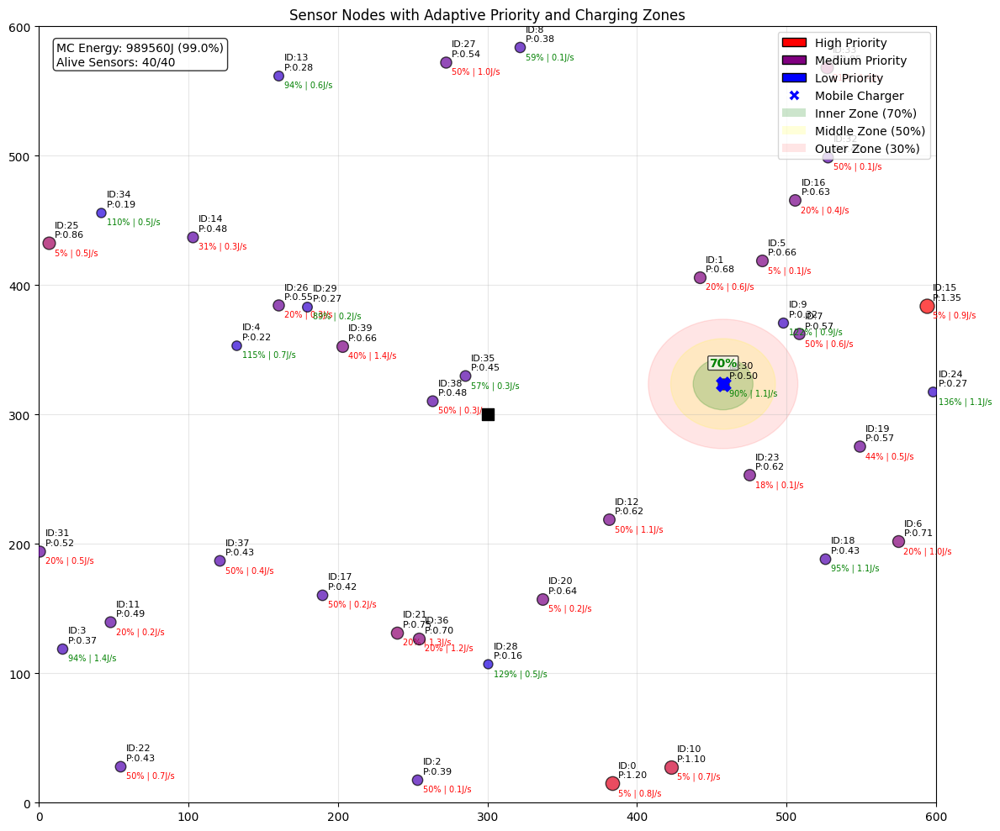

Visualizing charging process...


C:\Users\akshi\AppData\Local\Temp\ipykernel_23716\416811250.py:182: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "y-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot([closest_x, s.x], [closest_y, s.y], 'y-',


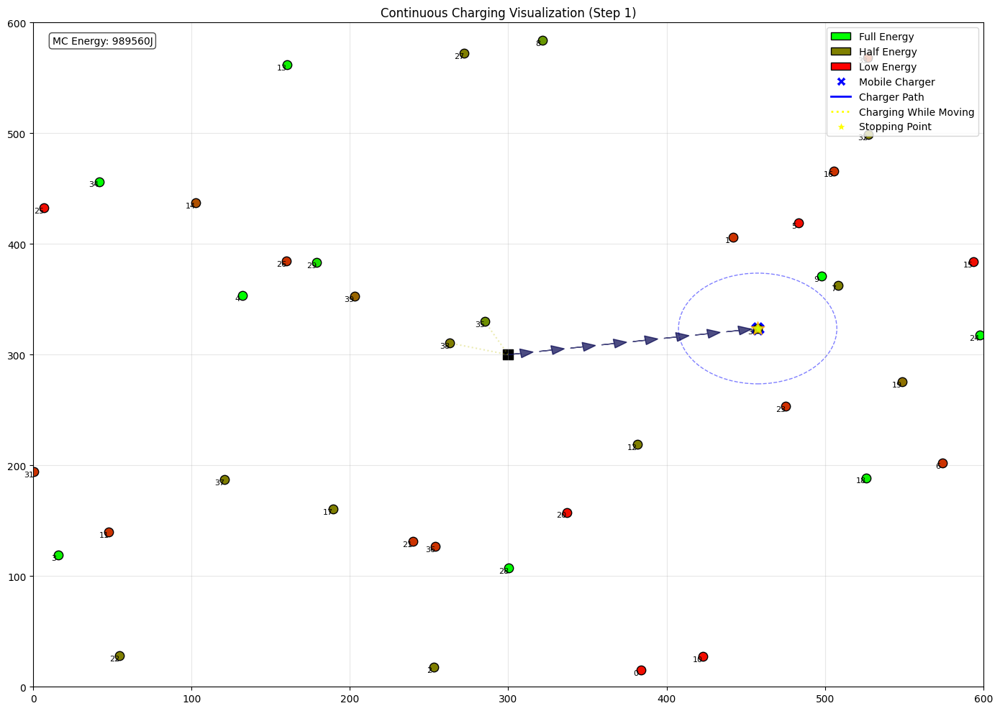

--- Step 2/12 --- MC Energy: 989560.0J
Top priority sensors:
  1. Sensor 15: Priority=1.35, Energy=5.0%, Rate=0.93J/s, Distance=149.0m
  2. Sensor 0: Priority=1.20, Energy=5.0%, Rate=0.85J/s, Distance=317.3m
  3. Sensor 10: Priority=1.10, Energy=5.0%, Rate=0.68J/s, Distance=298.2m
Charged 3 sensors with 8501.0J while moving
Visualizing sensor priorities...


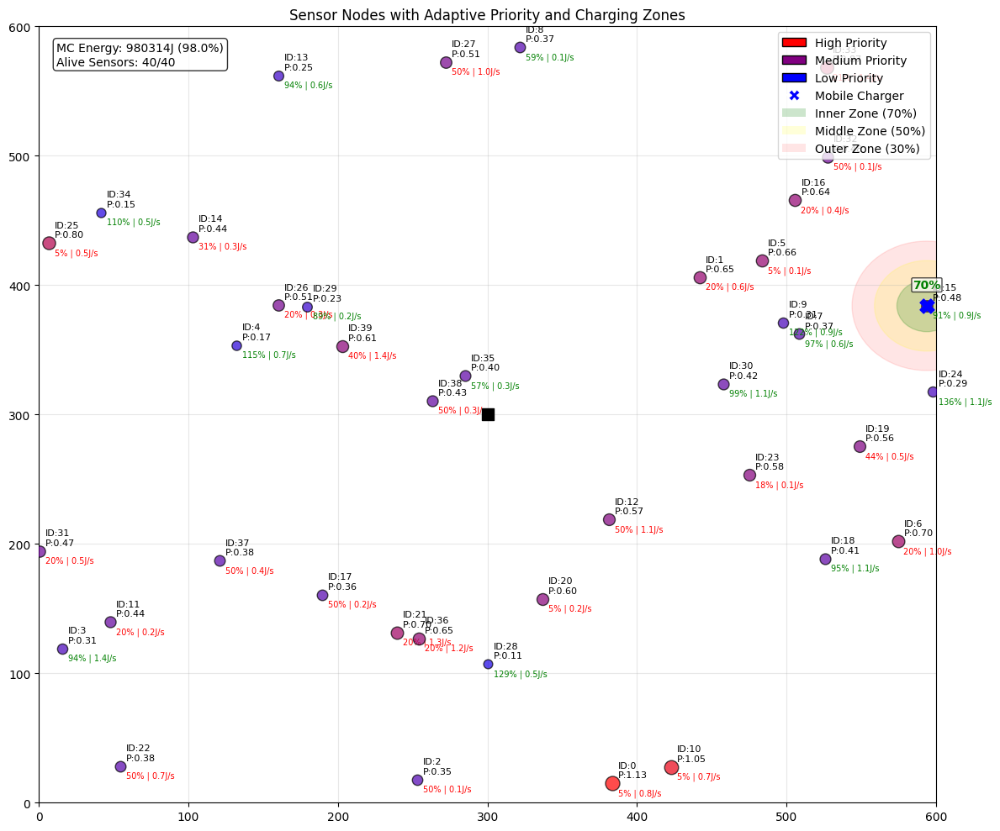

Visualizing charging process...


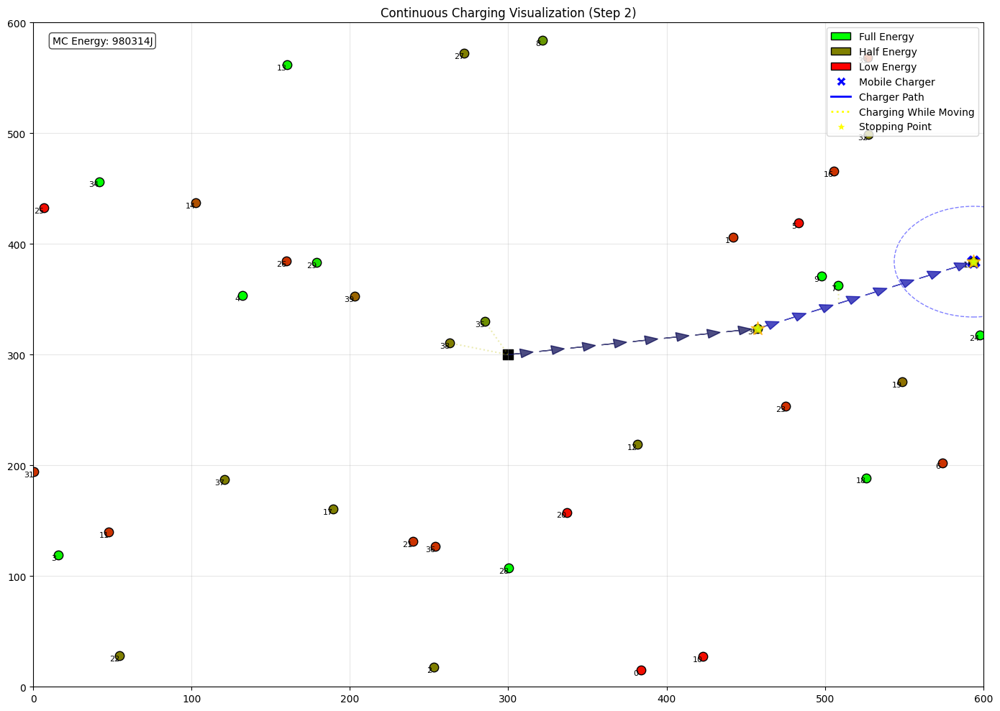

--- Step 3/12 --- MC Energy: 980314.1J
Top priority sensors:
  1. Sensor 0: Priority=1.13, Energy=4.9%, Rate=0.85J/s, Distance=424.6m
  2. Sensor 10: Priority=1.05, Energy=4.9%, Rate=0.68J/s, Distance=395.4m
  3. Sensor 33: Priority=0.87, Energy=21.0%, Rate=1.45J/s, Distance=195.9m
Charged 6 sensors with 11211.7J while moving
Visualizing sensor priorities...


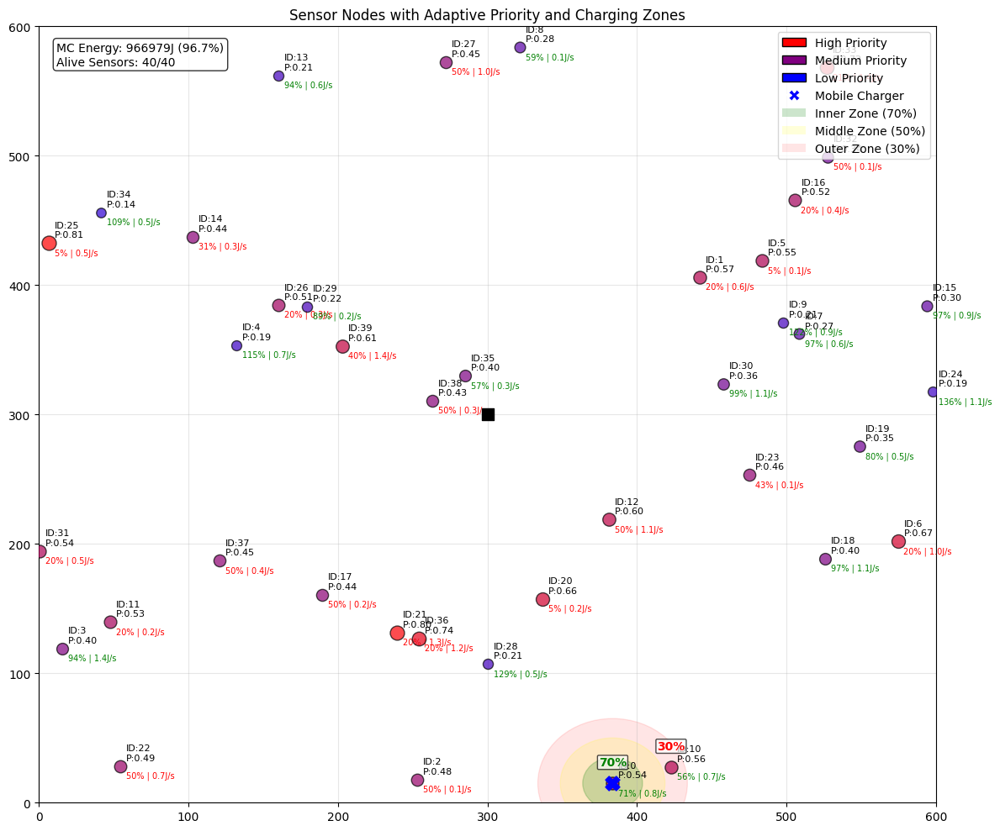

Visualizing charging process...


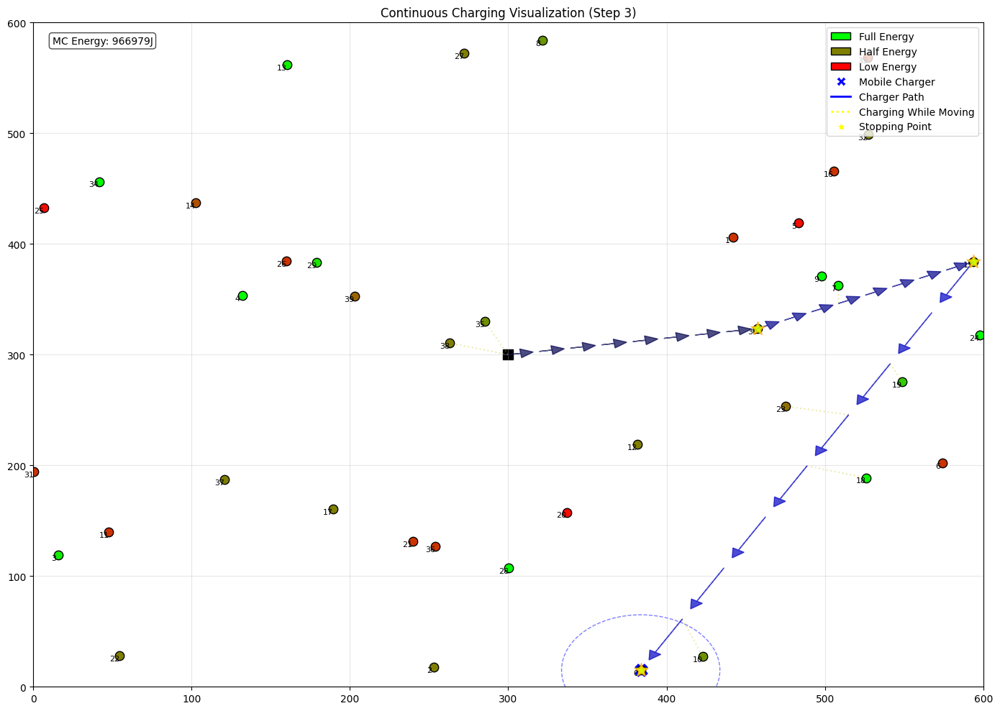

--- Step 4/12 --- MC Energy: 966979.4J
Top priority sensors:
  1. Sensor 25: Priority=0.81, Energy=4.9%, Rate=0.50J/s, Distance=562.3m
  2. Sensor 21: Priority=0.80, Energy=19.8%, Rate=1.27J/s, Distance=185.3m
  3. Sensor 36: Priority=0.74, Energy=19.8%, Rate=1.19J/s, Distance=171.5m
Charged 5 sensors with 9892.9J while moving
Visualizing sensor priorities...


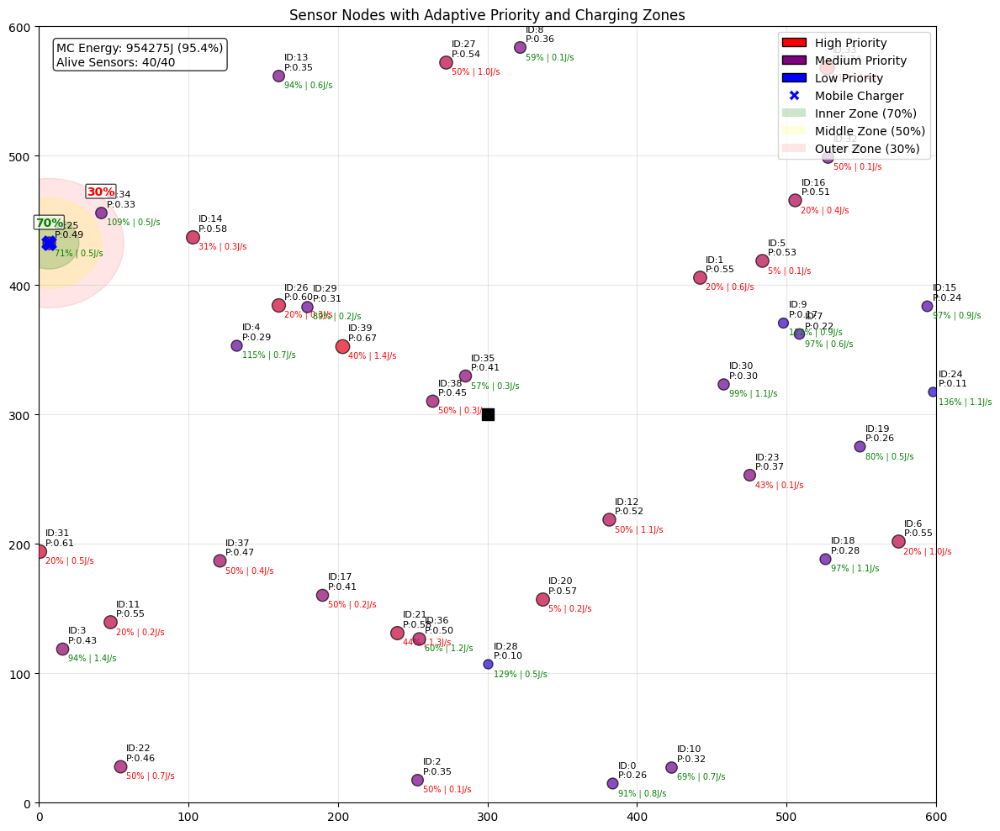

Visualizing charging process...


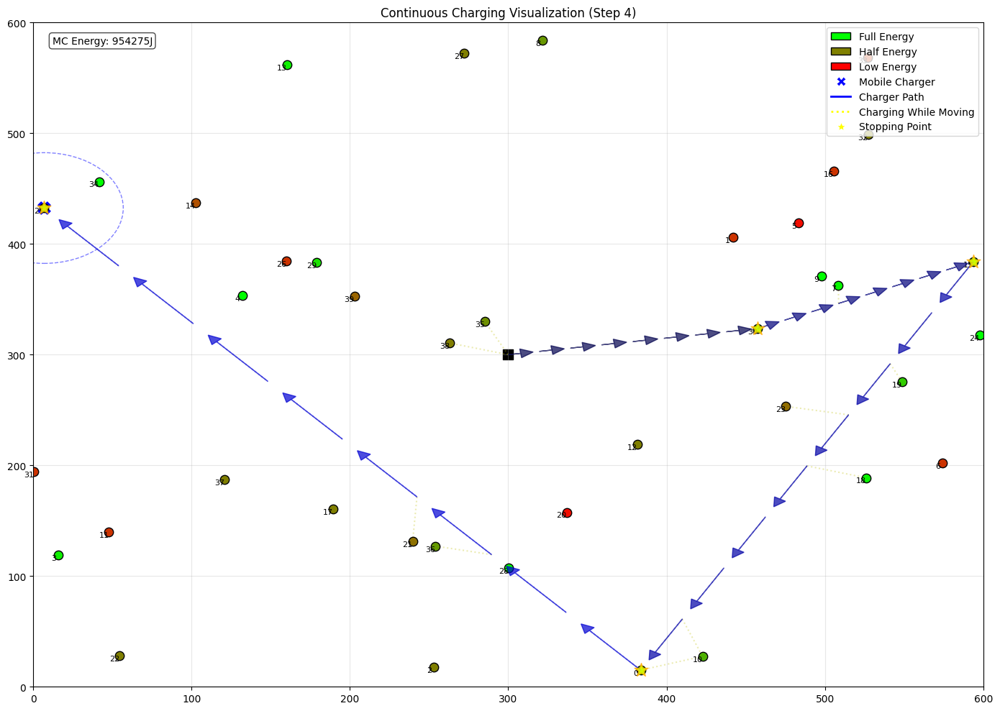

--- Step 5/12 --- MC Energy: 954274.9J
Top priority sensors:
  1. Sensor 33: Priority=0.74, Energy=20.8%, Rate=1.45J/s, Distance=537.3m
  2. Sensor 39: Priority=0.67, Energy=39.6%, Rate=1.39J/s, Distance=211.5m
  3. Sensor 31: Priority=0.61, Energy=19.9%, Rate=0.48J/s, Distance=238.0m
Charged 3 sensors with 6750.1J while moving
Visualizing sensor priorities...


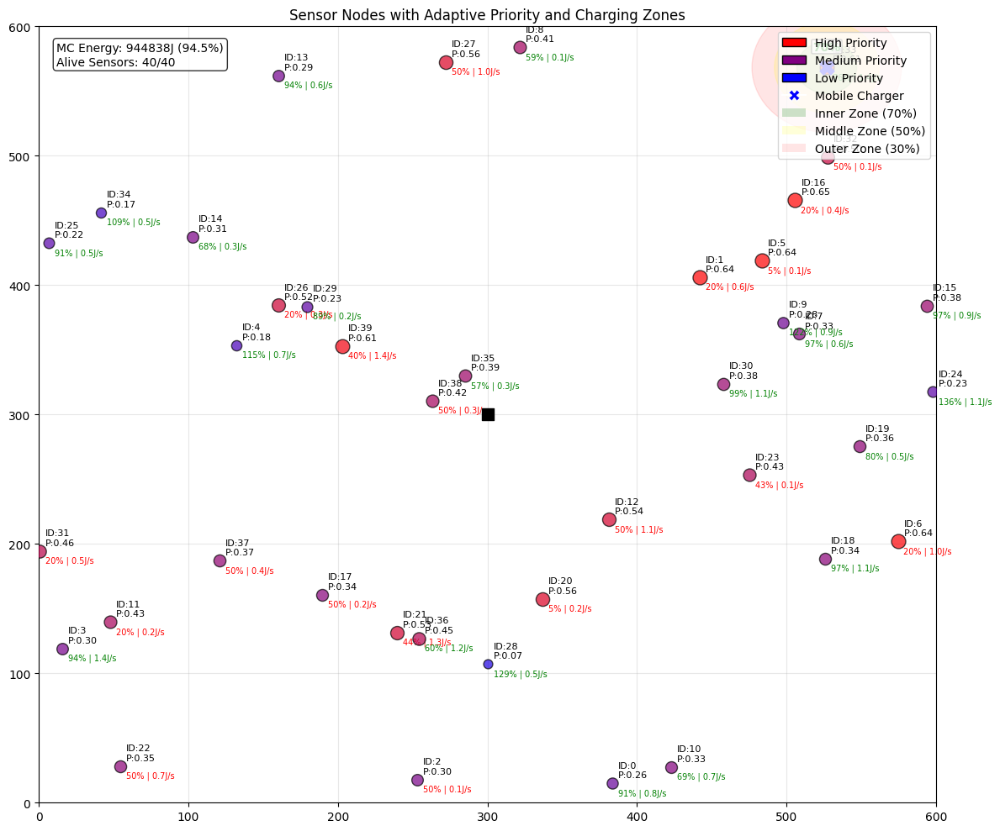

Visualizing charging process...


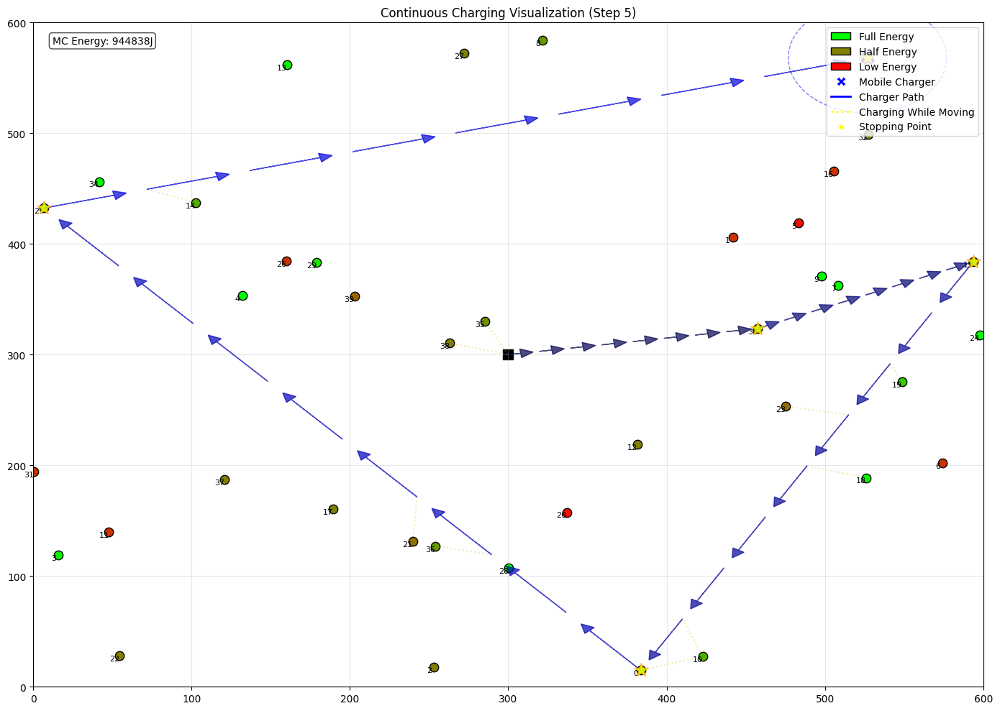

--- Step 6/12 --- MC Energy: 944838.2J
Top priority sensors:
  1. Sensor 16: Priority=0.65, Energy=19.9%, Rate=0.43J/s, Distance=104.7m
  2. Sensor 1: Priority=0.64, Energy=19.9%, Rate=0.59J/s, Distance=183.0m
  3. Sensor 5: Priority=0.64, Energy=5.0%, Rate=0.11J/s, Distance=155.4m
Charged 3 sensors with 8875.9J while moving
Visualizing sensor priorities...


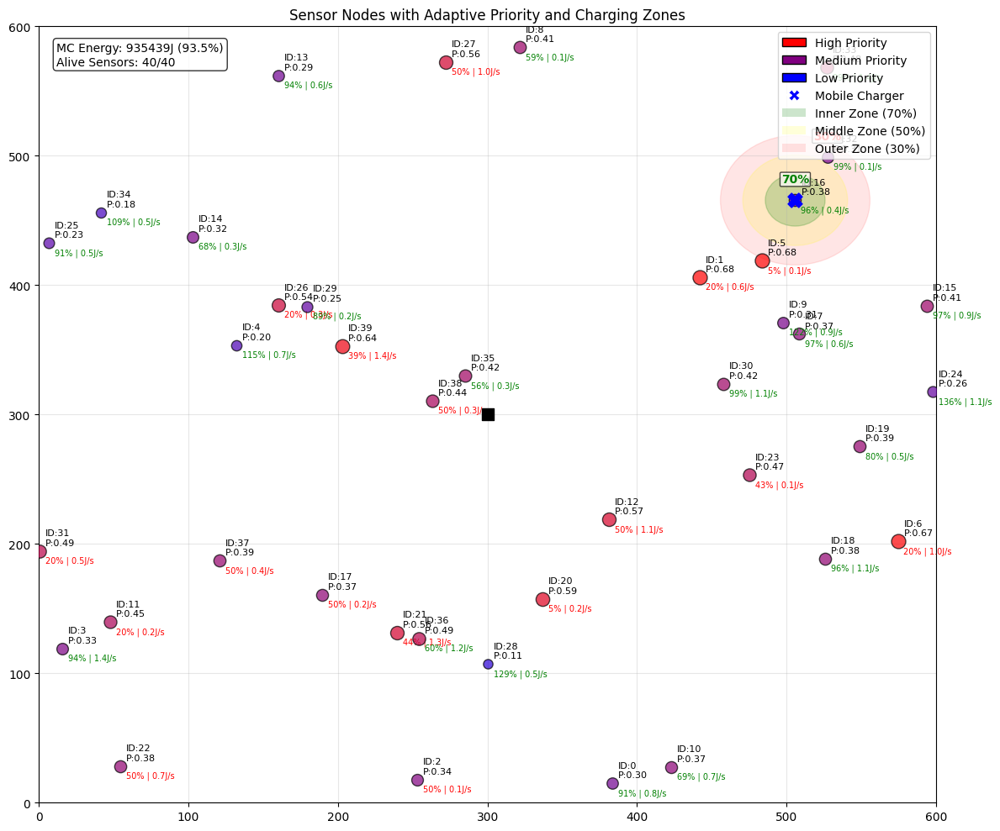

Visualizing charging process...


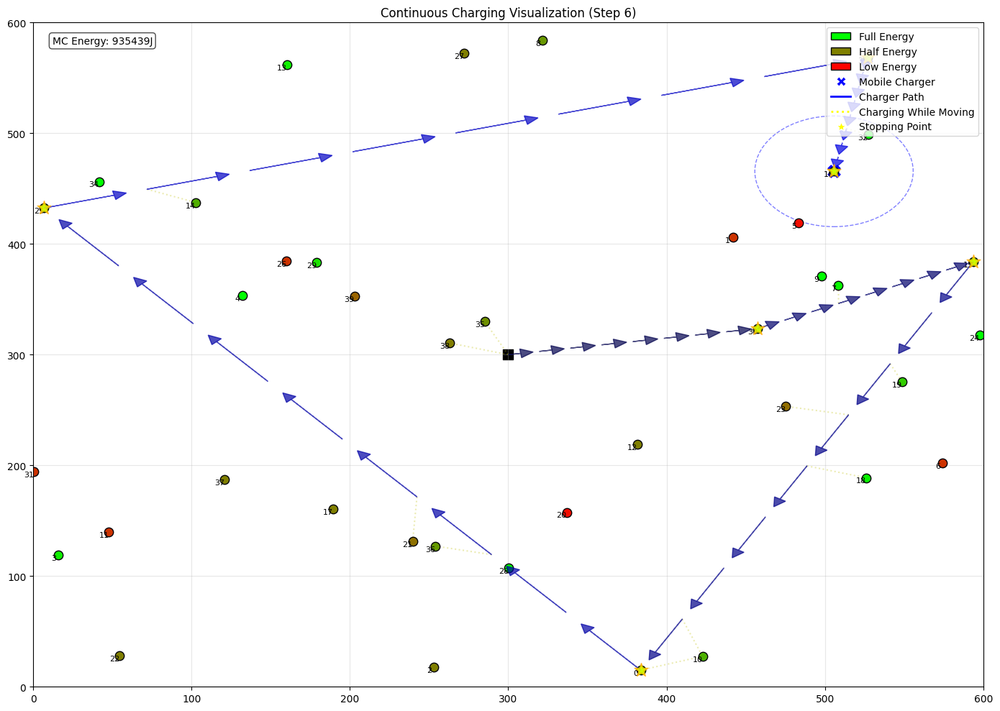

--- Step 7/12 --- MC Energy: 935438.7J
Top priority sensors:
  1. Sensor 5: Priority=0.68, Energy=5.0%, Rate=0.11J/s, Distance=51.7m
  2. Sensor 1: Priority=0.68, Energy=19.8%, Rate=0.59J/s, Distance=87.3m
  3. Sensor 6: Priority=0.67, Energy=19.7%, Rate=0.97J/s, Distance=272.4m
Charged 4 sensors with 8054.1J while moving
Visualizing sensor priorities...


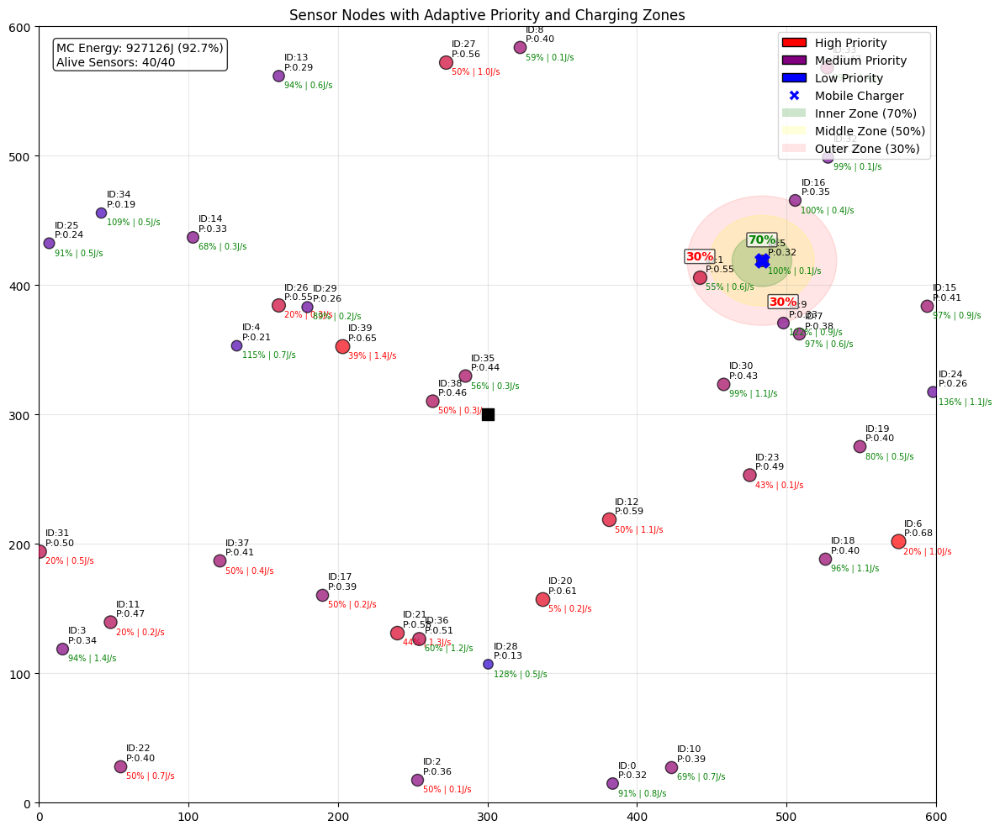

Visualizing charging process...


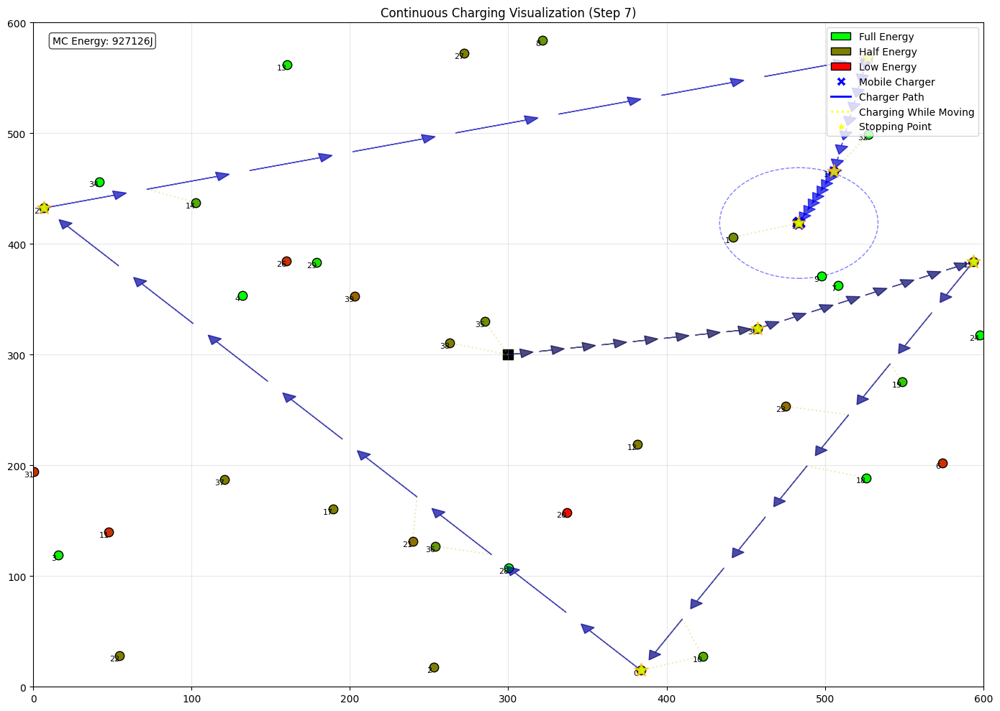

--- Step 8/12 --- MC Energy: 927125.9J
Top priority sensors:
  1. Sensor 6: Priority=0.68, Energy=19.7%, Rate=0.97J/s, Distance=235.2m
  2. Sensor 39: Priority=0.65, Energy=39.4%, Rate=1.39J/s, Distance=288.3m
  3. Sensor 20: Priority=0.61, Energy=4.9%, Rate=0.25J/s, Distance=299.6m
Charged 5 sensors with 5958.7J while moving
Visualizing sensor priorities...


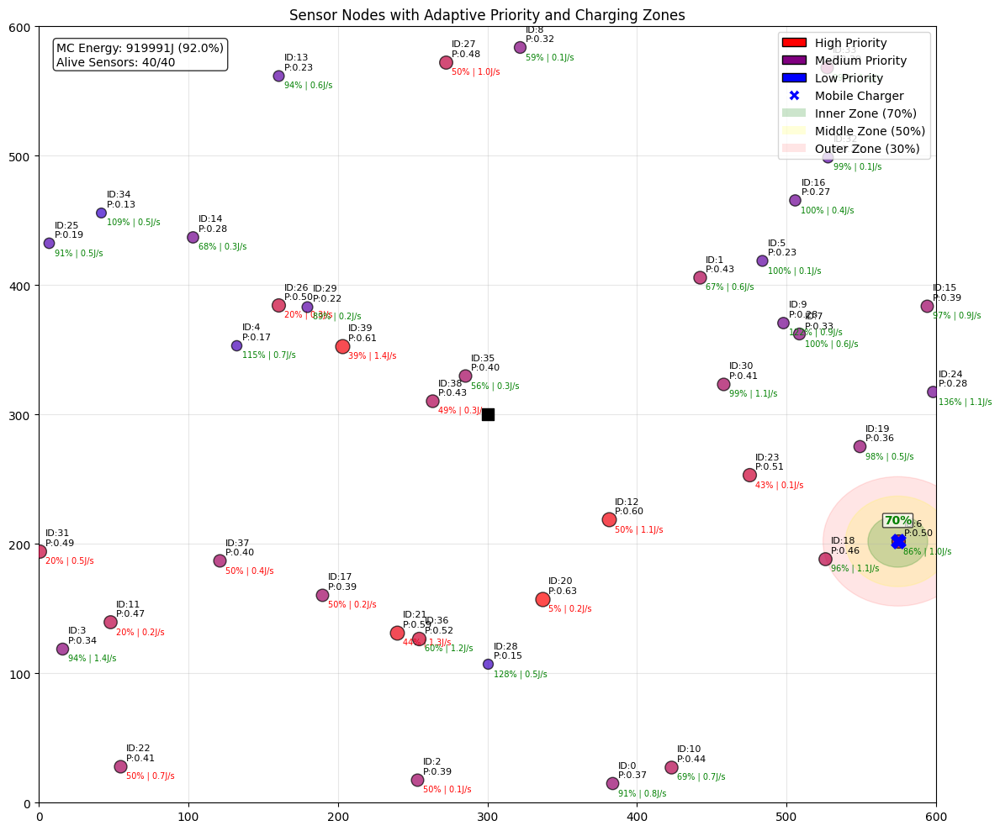

Visualizing charging process...


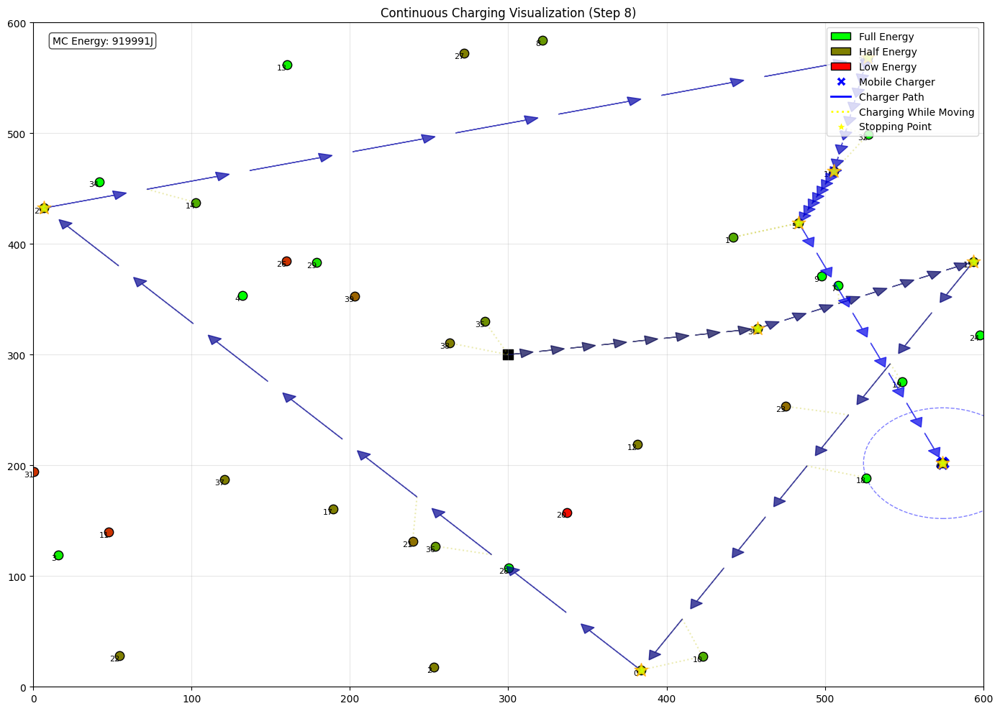

--- Step 9/12 --- MC Energy: 919991.3J
Top priority sensors:
  1. Sensor 20: Priority=0.63, Energy=4.9%, Rate=0.25J/s, Distance=241.6m
  2. Sensor 39: Priority=0.61, Energy=39.4%, Rate=1.39J/s, Distance=401.0m
  3. Sensor 12: Priority=0.60, Energy=49.5%, Rate=1.13J/s, Distance=193.7m
Charged 3 sensors with 5574.7J while moving
Visualizing sensor priorities...


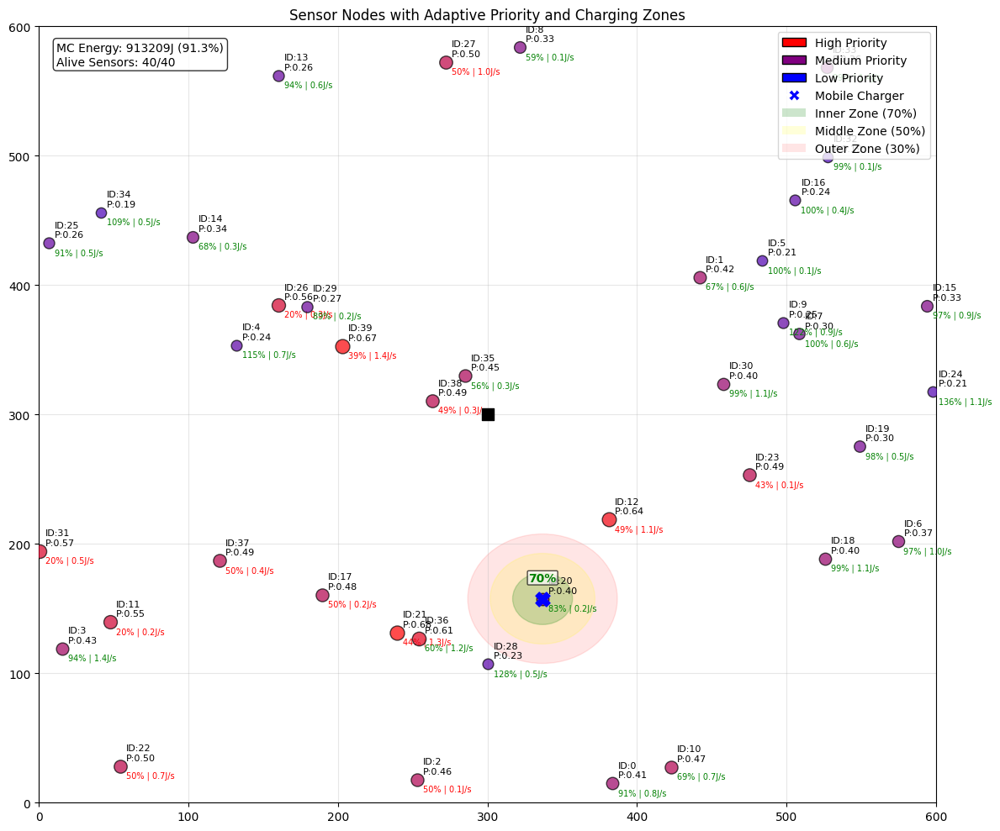

Visualizing charging process...


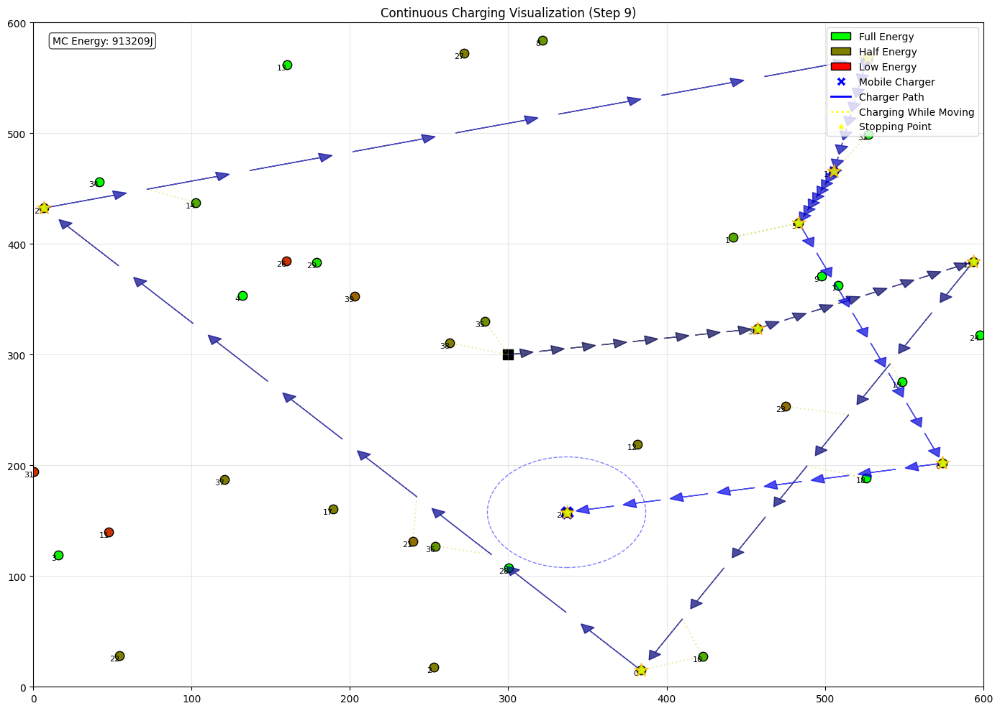

--- Step 10/12 --- MC Energy: 913208.7J
Top priority sensors:
  1. Sensor 21: Priority=0.68, Energy=44.1%, Rate=1.27J/s, Distance=100.6m
  2. Sensor 39: Priority=0.67, Energy=39.3%, Rate=1.39J/s, Distance=236.9m
  3. Sensor 12: Priority=0.64, Energy=49.5%, Rate=1.13J/s, Distance=75.8m
Charged 3 sensors with 6495.0J while moving
Visualizing sensor priorities...


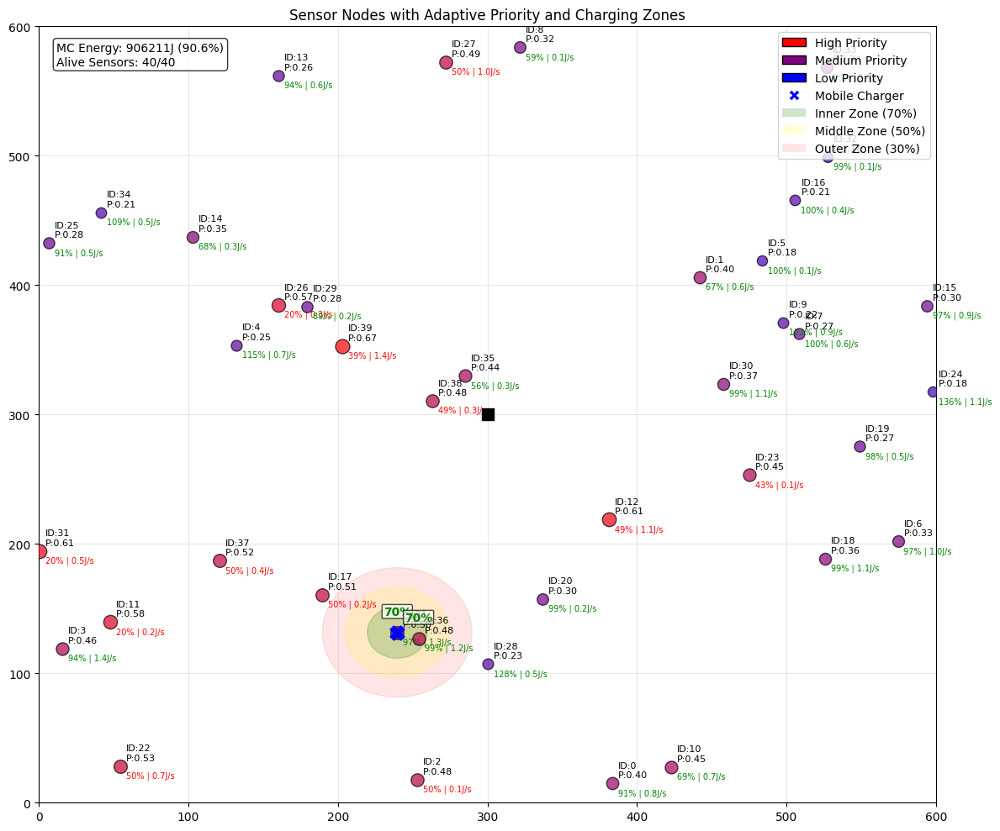

Visualizing charging process...


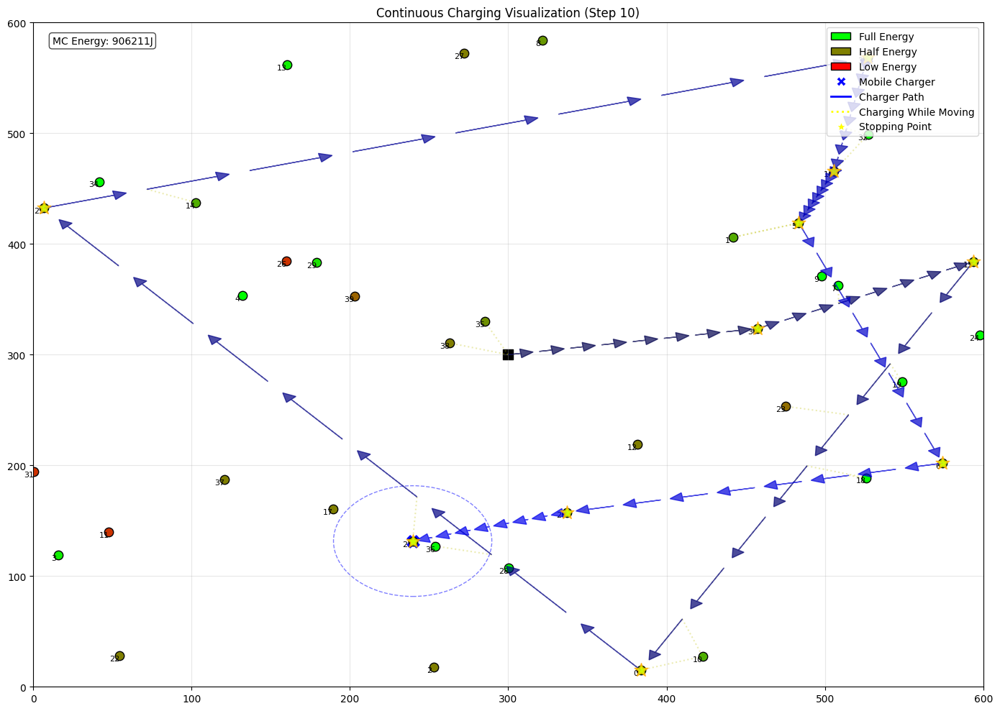

--- Step 11/12 --- MC Energy: 906210.6J
Top priority sensors:
  1. Sensor 39: Priority=0.67, Energy=39.2%, Rate=1.39J/s, Distance=224.4m
  2. Sensor 12: Priority=0.61, Energy=49.4%, Rate=1.13J/s, Distance=166.5m
  3. Sensor 31: Priority=0.61, Energy=19.8%, Rate=0.48J/s, Distance=247.4m
Charged 5 sensors with 4664.5J while moving
Visualizing sensor priorities...


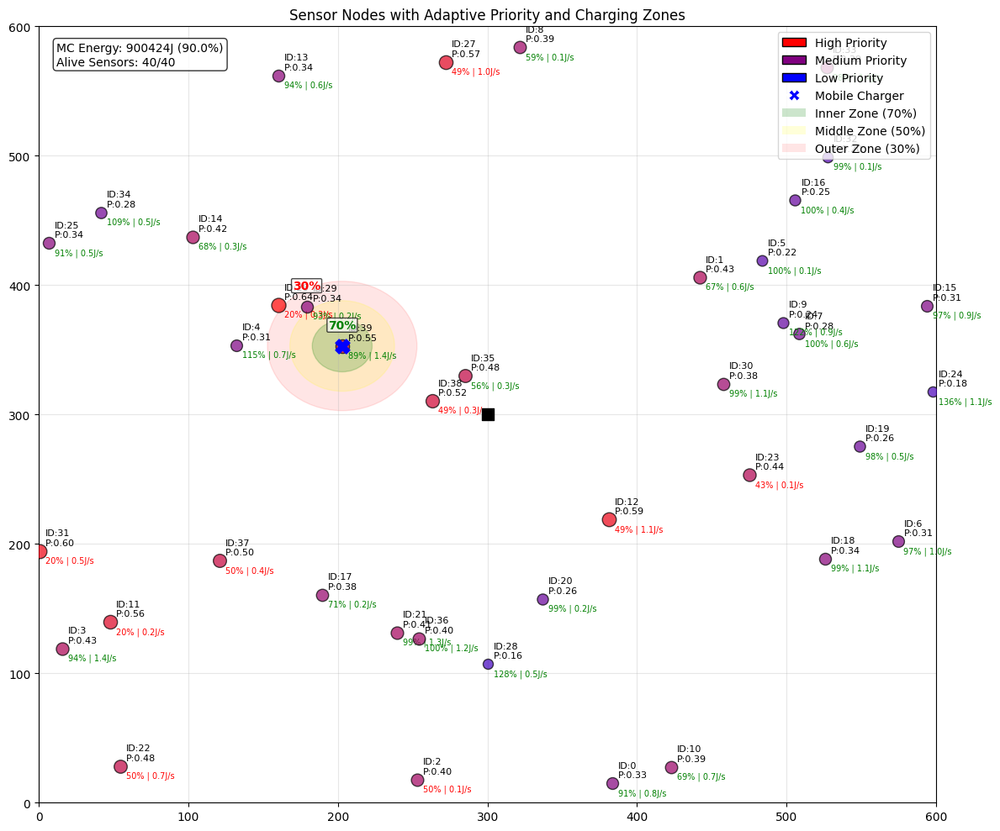

Visualizing charging process...


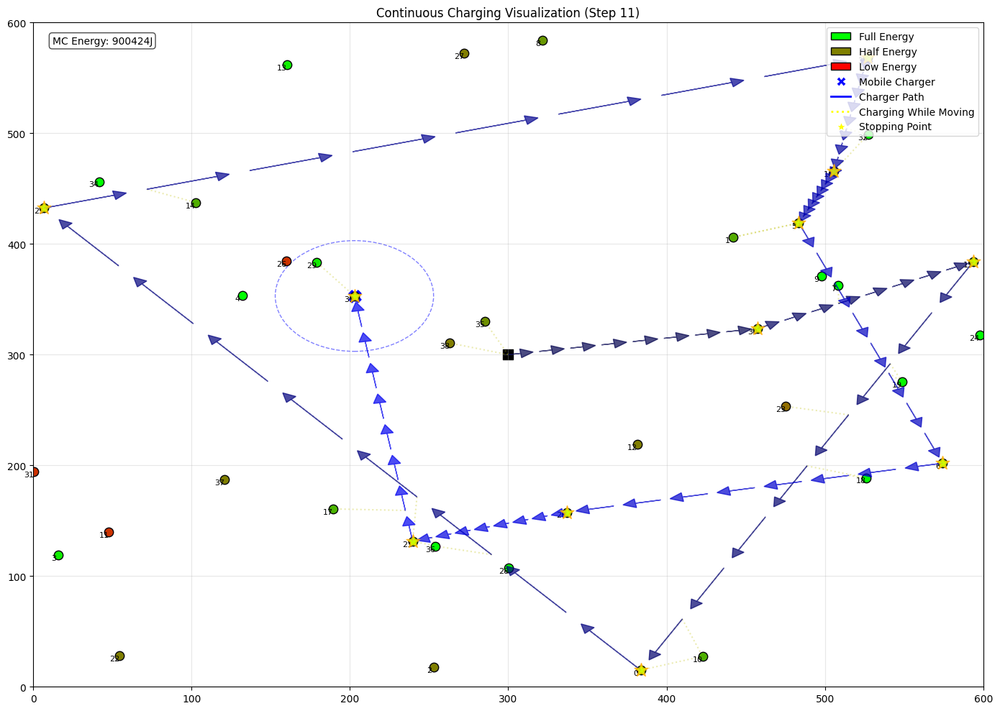

--- Step 12/12 --- MC Energy: 900423.9J
Top priority sensors:
  1. Sensor 26: Priority=0.64, Energy=19.9%, Rate=0.27J/s, Distance=53.2m
  2. Sensor 31: Priority=0.60, Energy=19.7%, Rate=0.48J/s, Distance=257.2m
  3. Sensor 12: Priority=0.59, Energy=49.4%, Rate=1.13J/s, Distance=223.3m
Charged 3 sensors with 5863.3J while moving
Visualizing sensor priorities...


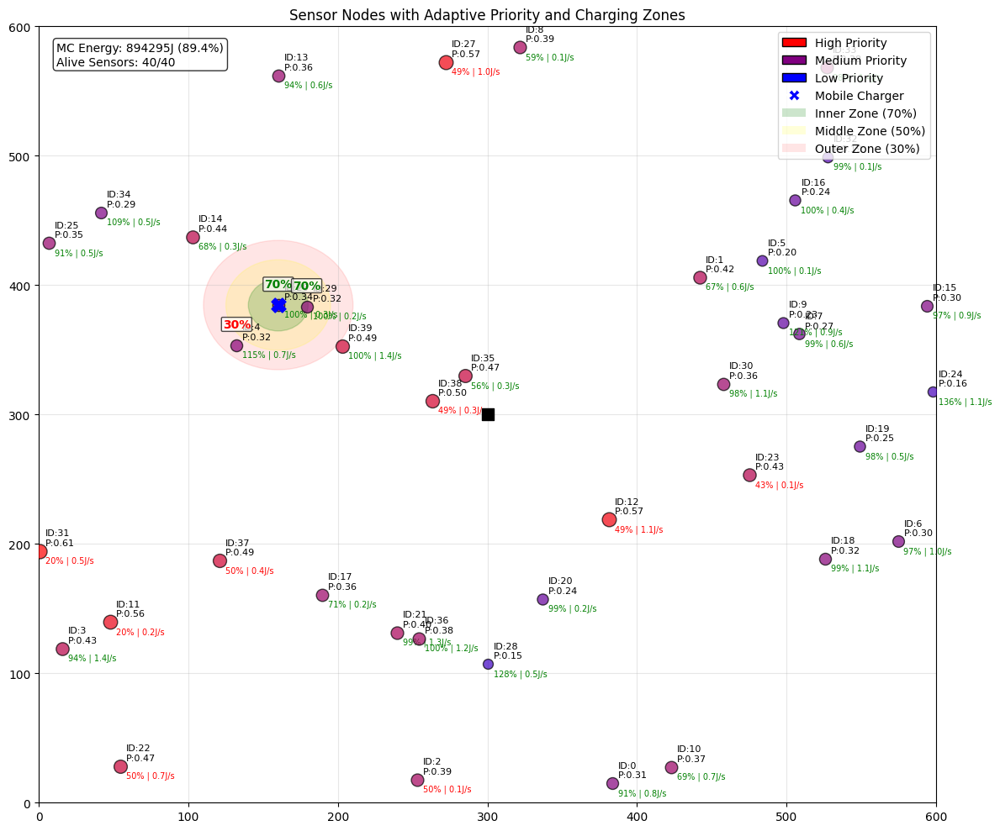

Visualizing charging process...


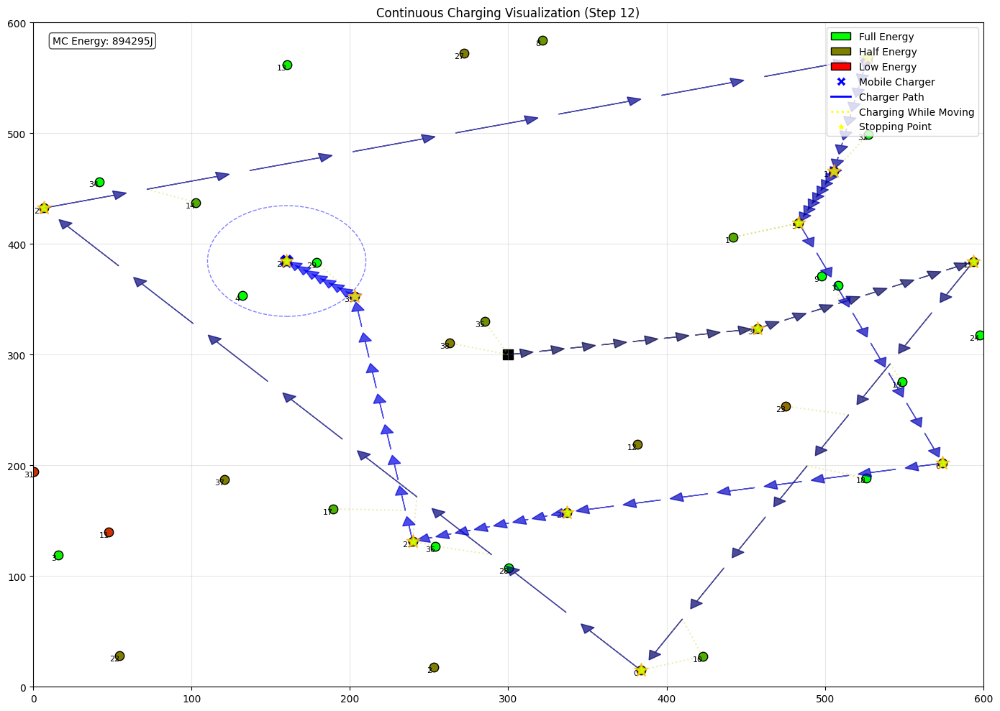


Simulation complete after 12 steps:
Total energy transferred: 91485.4J
Sensors dead: 0 out of 40
MC remaining energy: 894294.8J


In [90]:

# Initialize a new simulation with adaptive threshold
sensors, mc = initialize_environment(num_sensors=40)
 
# First, visualize initial priorities
visualize_sensor_priorities(sensors, mc)

# Run simulation with adaptive charging
run_adaptive_continuous_charging(
    num_steps=12,       # Number of steps to run
    time_step=3,        # Time between updates
    num_sensors=40,     # Number of sensors
    path_segments=8     # Segments for continuous charging
)

Running simulation with zone-based charging efficiency...
Initial network state with charging zones:


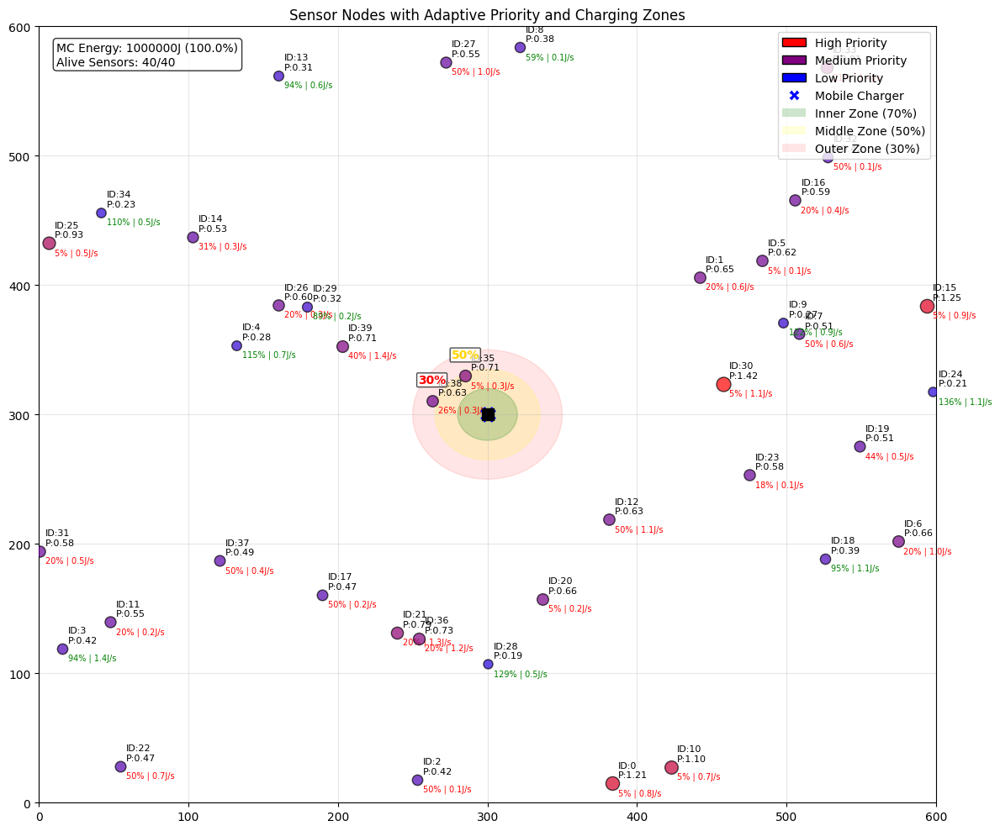

--- Step 1/8 --- MC Energy: 1000000.0J
Top priority sensors:
  1. Sensor 30: Priority=1.42, Energy=5.0%, Rate=1.10J/s, Distance=159.3m
  2. Sensor 15: Priority=1.25, Energy=5.0%, Rate=0.93J/s, Distance=305.5m
  3. Sensor 0: Priority=1.21, Energy=5.0%, Rate=0.85J/s, Distance=297.0m
Charged 3 sensors with 9643.7J while moving
Charged sensor IDs: [35, 38, 30]
Visualizing network state with charging zones after step 1...


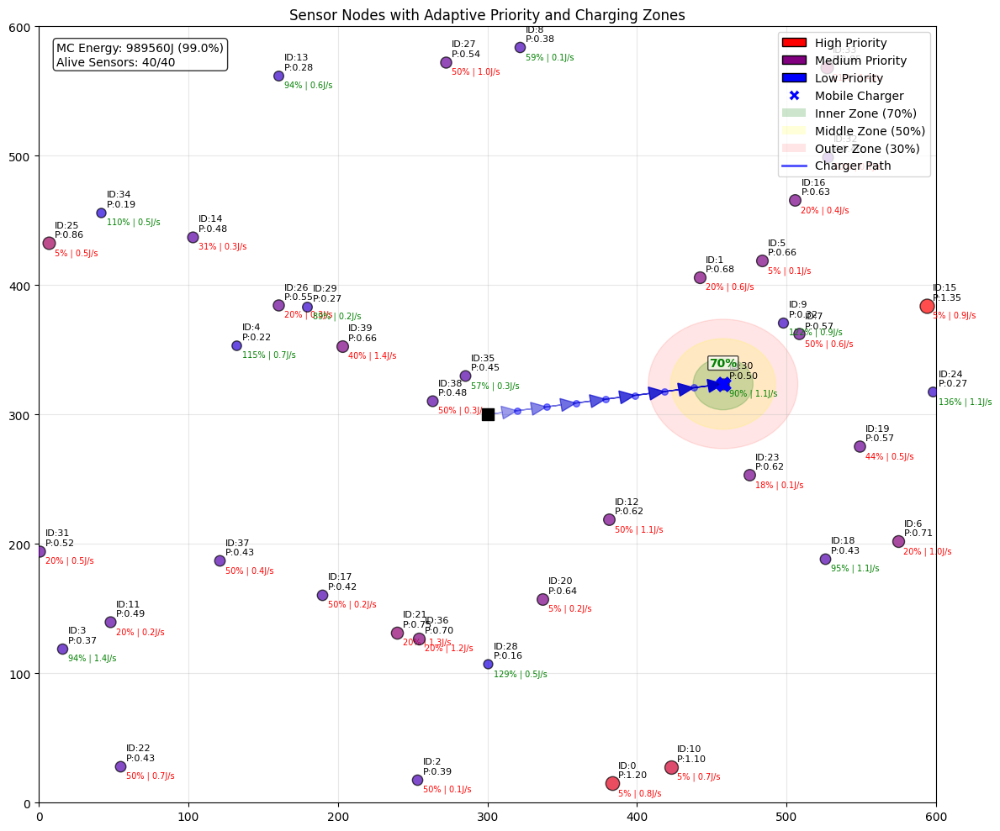

--- Step 2/8 --- MC Energy: 989560.0J
Top priority sensors:
  1. Sensor 15: Priority=1.35, Energy=5.0%, Rate=0.93J/s, Distance=149.0m
  2. Sensor 0: Priority=1.20, Energy=5.0%, Rate=0.85J/s, Distance=317.3m
  3. Sensor 10: Priority=1.10, Energy=5.0%, Rate=0.68J/s, Distance=298.2m
Charged 3 sensors with 8501.0J while moving
Charged sensor IDs: [30, 7, 15]
Visualizing network state with charging zones after step 2...


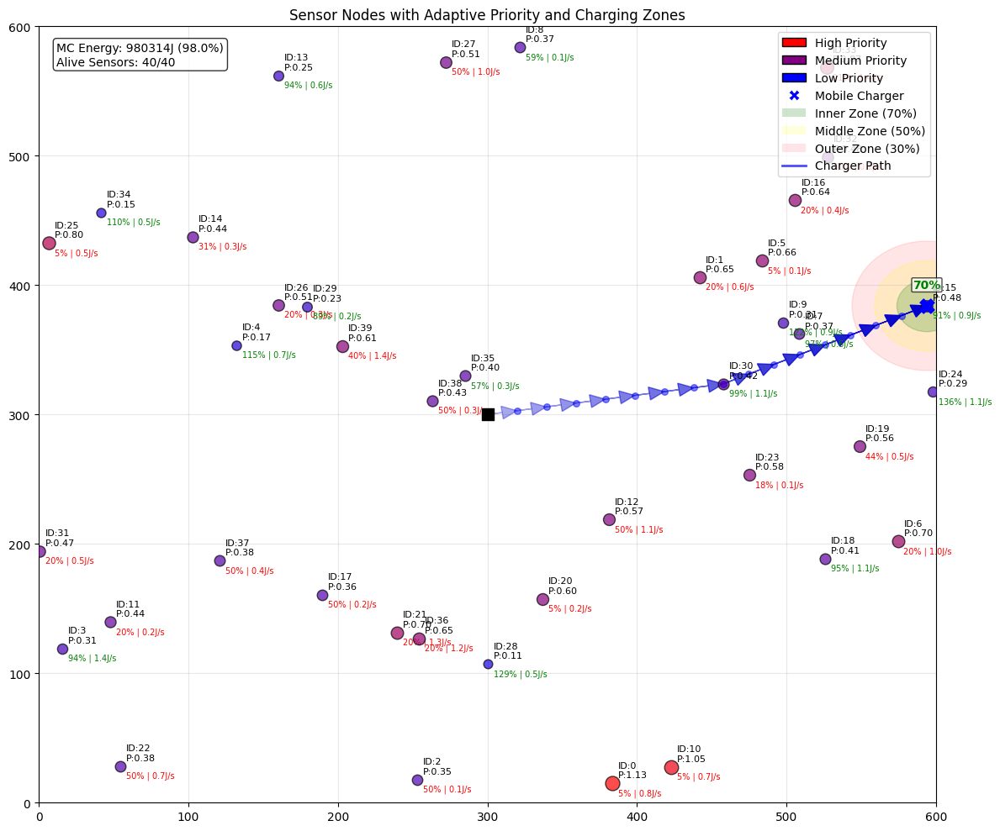

--- Step 3/8 --- MC Energy: 980314.1J
Top priority sensors:
  1. Sensor 0: Priority=1.13, Energy=4.9%, Rate=0.85J/s, Distance=424.6m
  2. Sensor 10: Priority=1.05, Energy=4.9%, Rate=0.68J/s, Distance=395.4m
  3. Sensor 33: Priority=0.87, Energy=21.0%, Rate=1.45J/s, Distance=195.9m
Charged 6 sensors with 11211.7J while moving
Charged sensor IDs: [15, 19, 23, 18, 10, 0]
Visualizing network state with charging zones after step 3...


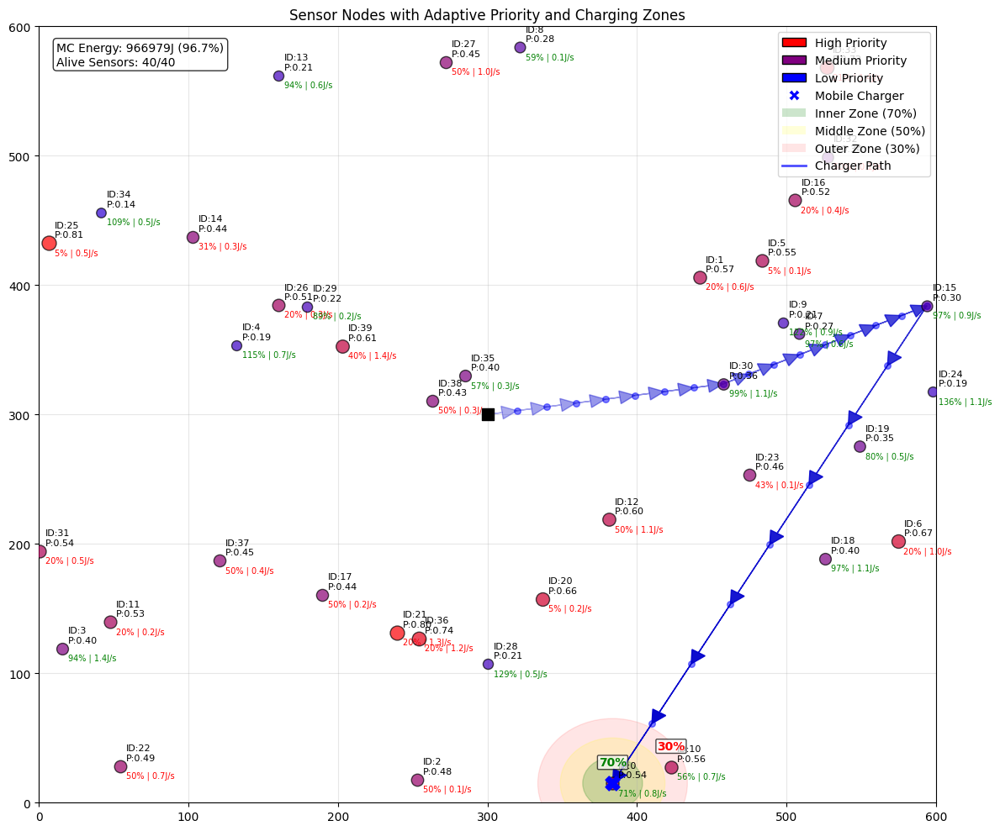

--- Step 4/8 --- MC Energy: 966979.4J
Top priority sensors:
  1. Sensor 25: Priority=0.81, Energy=4.9%, Rate=0.50J/s, Distance=562.3m
  2. Sensor 21: Priority=0.80, Energy=19.8%, Rate=1.27J/s, Distance=185.3m
  3. Sensor 36: Priority=0.74, Energy=19.8%, Rate=1.19J/s, Distance=171.5m
Charged 5 sensors with 9892.9J while moving
Charged sensor IDs: [0, 10, 36, 21, 25]
Visualizing network state with charging zones after step 4...


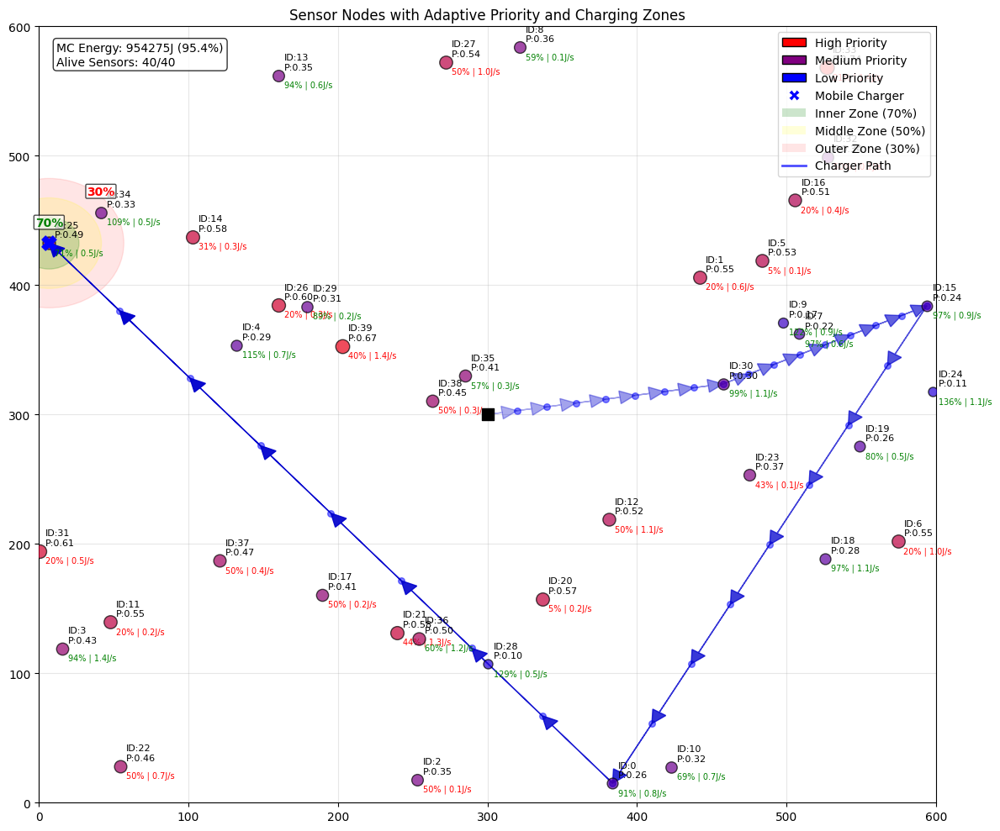

--- Step 5/8 --- MC Energy: 954274.9J
Top priority sensors:
  1. Sensor 33: Priority=0.74, Energy=20.8%, Rate=1.45J/s, Distance=537.3m
  2. Sensor 39: Priority=0.67, Energy=39.6%, Rate=1.39J/s, Distance=211.5m
  3. Sensor 31: Priority=0.61, Energy=19.9%, Rate=0.48J/s, Distance=238.0m
Charged 3 sensors with 6750.1J while moving
Charged sensor IDs: [25, 14, 33]
Visualizing network state with charging zones after step 5...


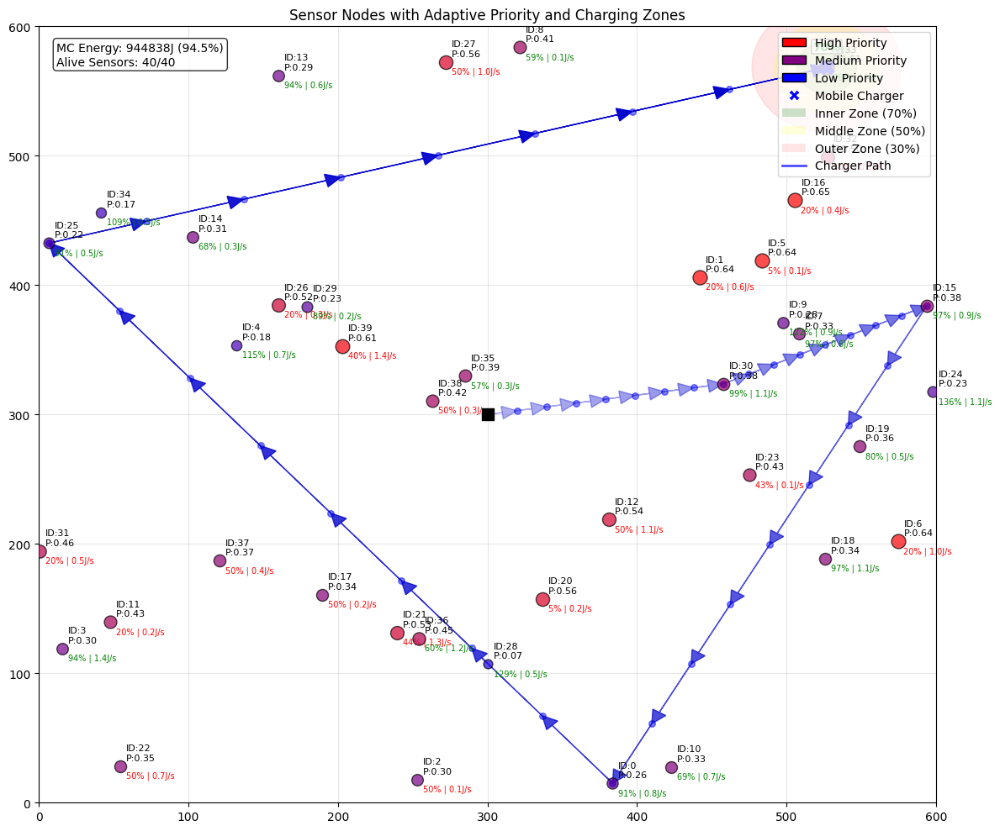

--- Step 6/8 --- MC Energy: 944838.2J
Top priority sensors:
  1. Sensor 16: Priority=0.65, Energy=19.9%, Rate=0.43J/s, Distance=104.7m
  2. Sensor 1: Priority=0.64, Energy=19.9%, Rate=0.59J/s, Distance=183.0m
  3. Sensor 5: Priority=0.64, Energy=5.0%, Rate=0.11J/s, Distance=155.4m
Charged 3 sensors with 8875.9J while moving
Charged sensor IDs: [33, 32, 16]
Visualizing network state with charging zones after step 6...


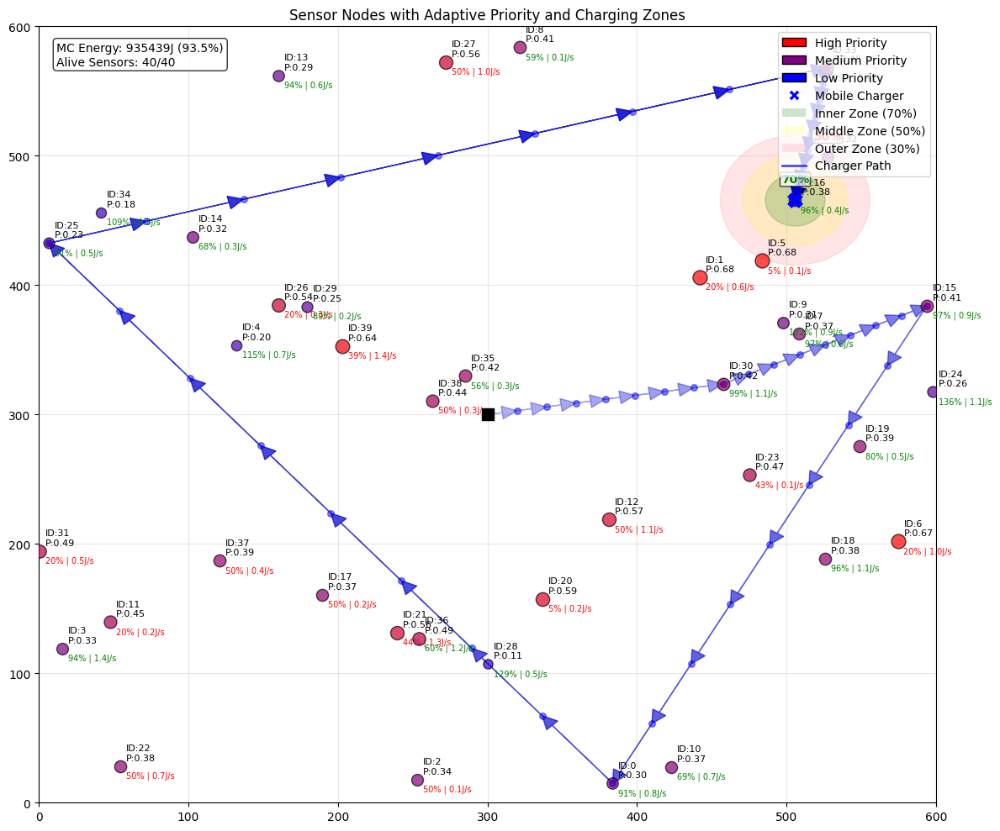

--- Step 7/8 --- MC Energy: 935438.7J
Top priority sensors:
  1. Sensor 5: Priority=0.68, Energy=5.0%, Rate=0.11J/s, Distance=51.7m
  2. Sensor 1: Priority=0.68, Energy=19.8%, Rate=0.59J/s, Distance=87.3m
  3. Sensor 6: Priority=0.67, Energy=19.7%, Rate=0.97J/s, Distance=272.4m
Charged 4 sensors with 8054.1J while moving
Charged sensor IDs: [16, 32, 5, 1]
Visualizing network state with charging zones after step 7...


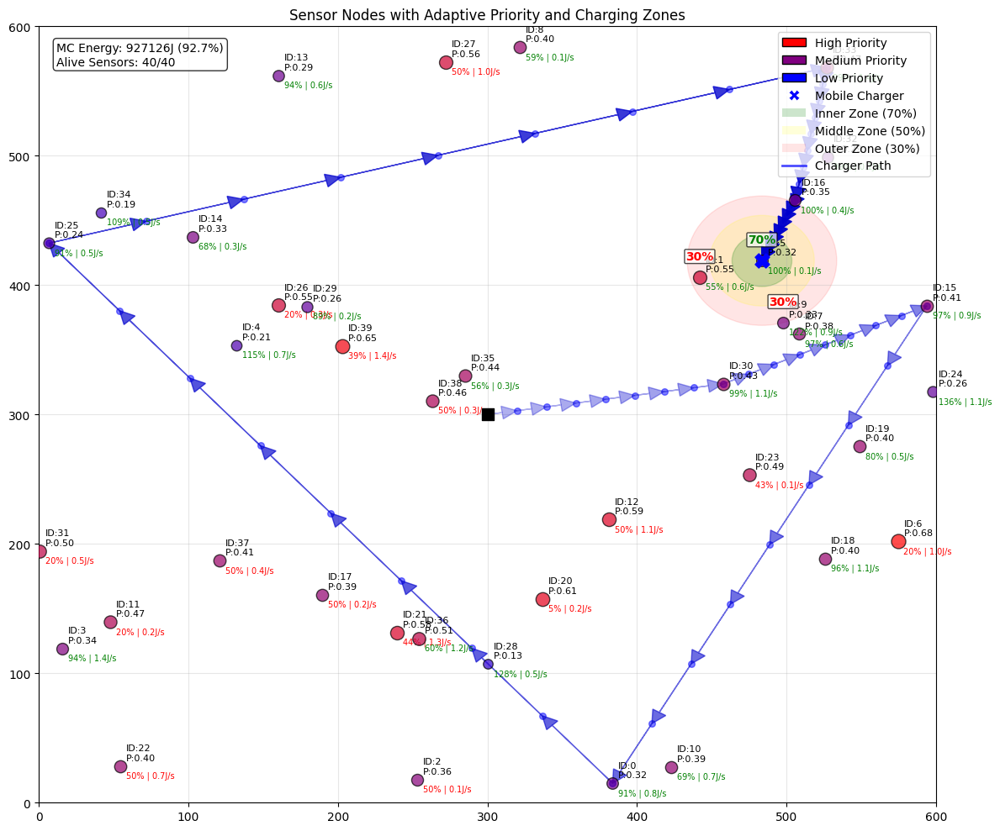

--- Step 8/8 --- MC Energy: 927125.9J
Top priority sensors:
  1. Sensor 6: Priority=0.68, Energy=19.7%, Rate=0.97J/s, Distance=235.2m
  2. Sensor 39: Priority=0.65, Energy=39.4%, Rate=1.39J/s, Distance=288.3m
  3. Sensor 20: Priority=0.61, Energy=4.9%, Rate=0.25J/s, Distance=299.6m
Charged 5 sensors with 5958.7J while moving
Charged sensor IDs: [1, 5, 7, 19, 6]
Visualizing network state with charging zones after step 8...


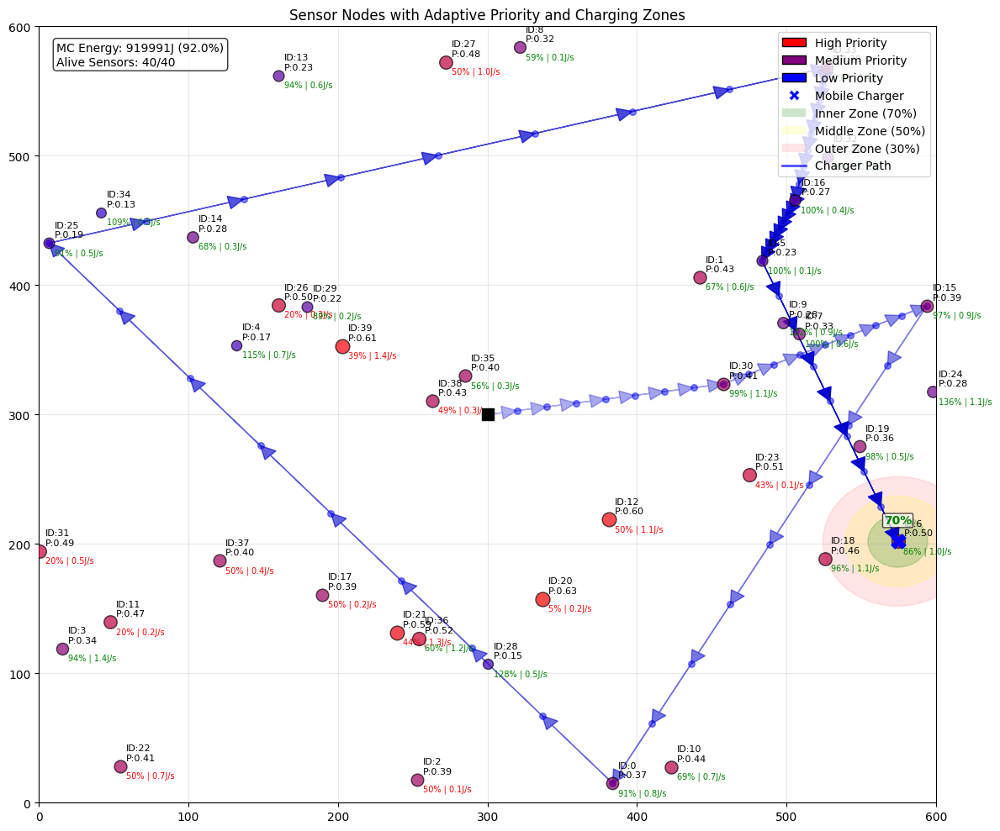


Simulation complete after 8 steps:
Total energy transferred: 68888.0J
Sensors dead: 0 out of 40
MC remaining energy: 919991.3J
Total path points: 73

Final network state with complete mobile charger path and charging zones:


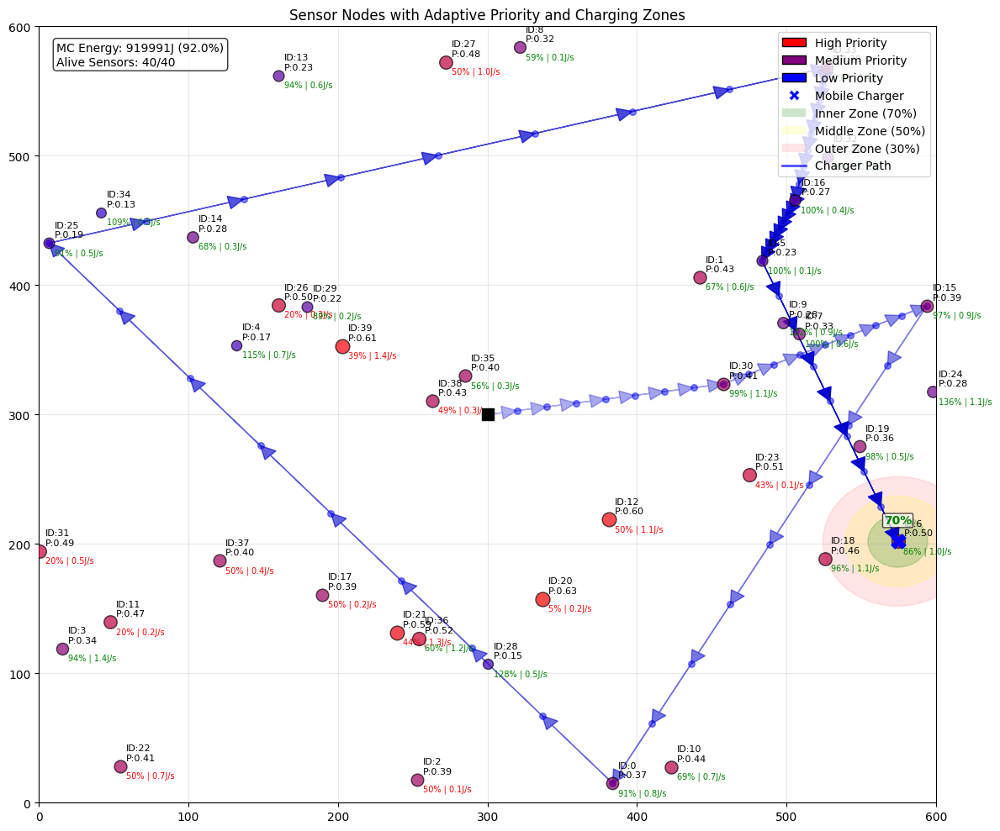

In [91]:
# Example of running the simulation with zone-based charging and path tracking
sensors, mc = initialize_environment(num_sensors=40)

# Initialize path tracking
path_history = [(mc.x, mc.y)]  # Start with initial position

# Run the adaptive charging simulation with zone-based charging
def run_adaptive_charging_with_zones(num_steps=10, time_step=3, num_sensors=40, path_segments=8):
    """
    Run a simulation with adaptive charging threshold, zone-based efficiency,
    and continuous charging while moving.
    """
    # Set random seed for reproducibility
    random.seed(42)
    np.random.seed(42)
    
    # Initialize environment
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Initialize path history
    path_history = [(mc.x, mc.y)]
    
    # Set varied energy levels and consumption rates
    for i, s in enumerate(sensors):
        if i % 5 == 0:  # 20% very low
            s.energy = 0.05 * s.capacity
        elif i % 5 == 1:  # 20% low
            s.energy = 0.2 * s.capacity
        elif i % 5 == 2:  # 20% medium
            s.energy = 0.5 * s.capacity
            
        # Vary consumption rates to create different priorities
        if i % 3 == 0:  # High consumption
            s.consumption_rate = random.uniform(0.8, 1.5)
        elif i % 3 == 1:  # Medium consumption
            s.consumption_rate = random.uniform(0.4, 0.7)
        else:  # Low consumption
            s.consumption_rate = random.uniform(0.1, 0.3)
    
    # Path tracking
    total_energy_transferred = 0
    
    # Visualize initial state
    print("Initial network state with charging zones:")
    visualize_sensor_priorities(sensors, mc, path_history)
    
    # Run simulation
    for step in range(num_steps):
        print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Get sensors needing charging using adaptive threshold
        to_charge = get_sensors_needing_charging(sensors, mc, adaptive_threshold=True)
        
        if not to_charge:
            # Let energy deplete a bit
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging right now.")
            continue
        
        # Show priorities of top 3 sensors
        print("Top priority sensors:")
        for i, sensor in enumerate(to_charge[:3]):
            priority = calculate_adaptive_priority(sensor, mc)
            energy_pct = sensor.energy / sensor.capacity * 100
            print(f"  {i+1}. Sensor {sensor.id}: Priority={priority:.2f}, Energy={energy_pct:.1f}%, " +
                  f"Rate={sensor.consumption_rate:.2f}J/s, " +
                  f"Distance={np.linalg.norm([mc.x - sensor.x, mc.y - sensor.y]):.1f}m")
        
        # Select highest priority sensor
        target = to_charge[0]
        
        # Save current position
        start_point = (mc.x, mc.y)
        end_point = (target.x, target.y)
        
        # Move and charge continuously
        energy_transferred, charged_node_ids, path_segment_x, path_segment_y = move_and_charge_along_path(
            mc, start_point, end_point, sensors, path_segments=path_segments
        )
        
        # Update path history with all segments
        for x, y in zip(path_segment_x, path_segment_y):
            path_history.append((x, y))
            
        total_energy_transferred += energy_transferred
        
        if charged_node_ids:
            print(f"Charged {len(charged_node_ids)} sensors with {energy_transferred:.1f}J while moving")
            print(f"Charged sensor IDs: {charged_node_ids}")
        
        # Update energy of all sensors
        for s in sensors:
            s.update_energy(time_step)
        
        # Visualize current state with path history and charging zones
        print(f"Visualizing network state with charging zones after step {step+1}...")
        visualize_sensor_priorities(sensors, mc, path_history)
    
    # Show final stats
    dead_count = sum(1 for s in sensors if s.dead)
    print(f"\nSimulation complete after {num_steps} steps:")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Sensors dead: {dead_count} out of {num_sensors}")
    print(f"MC remaining energy: {mc.energy:.1f}J")
    print(f"Total path points: {len(path_history)}")
    
    return sensors, mc, path_history

# Run the simulation with zone-based charging
print("Running simulation with zone-based charging efficiency...")
sensors, mc, path_history = run_adaptive_charging_with_zones(
    num_steps=8,
    time_step=3,
    num_sensors=40,
    path_segments=8
)

# Show final state
print("\nFinal network state with complete mobile charger path and charging zones:")
visualize_sensor_priorities(sensors, mc, path_history)

In [92]:
def find_optimal_charging_position(mc, sensors, candidate_sensors=None, grid_size=20):
    """
    Find the optimal position for the charger to maximize charging efficiency 
    for multiple sensors.
    
    Parameters:
    - mc: Mobile charger object
    - sensors: List of all sensor nodes
    - candidate_sensors: List of sensors to consider for charging (defaults to all sensors below 80% capacity)
    - grid_size: Resolution of the search grid
    
    Returns:
    - best_pos: Tuple (x, y) representing the optimal position
    - covered_sensors: List of sensor IDs that would be covered from this position
    - efficiency_score: The calculated efficiency score of this position
    """
    if candidate_sensors is None:
        # Default: consider all sensors below 80% charge that aren't dead
        candidate_sensors = [s for s in sensors if not s.dead and s.energy < 0.8 * s.capacity]
    
    if not candidate_sensors:
        return (mc.x, mc.y), [], 0  # No sensors need charging
    
    # Define the search area - limit to where the sensors are
    min_x = max(0, min(s.x for s in candidate_sensors) - CHARGING_RADIUS)
    max_x = min(AREA_WIDTH, max(s.x for s in candidate_sensors) + CHARGING_RADIUS)
    min_y = max(0, min(s.y for s in candidate_sensors) - CHARGING_RADIUS)
    max_y = min(AREA_HEIGHT, max(s.y for s in candidate_sensors) + CHARGING_RADIUS)
    
    # Create a grid of candidate positions
    step_x = (max_x - min_x) / grid_size
    step_y = (max_y - min_y) / grid_size
    
    best_pos = (mc.x, mc.y)  # Default to current position
    best_score = 0
    best_covered = []
    
    # Evaluate each grid position
    for i in range(grid_size + 1):
        for j in range(grid_size + 1):
            pos_x = min_x + i * step_x
            pos_y = min_y + j * step_y
            
            score, covered = evaluate_charging_position(pos_x, pos_y, candidate_sensors)
            
            # Calculate movement cost penalty
            distance_to_move = np.linalg.norm([mc.x - pos_x, mc.y - pos_y])
            energy_cost = distance_to_move * MOVEMENT_COST_PER_M
            movement_penalty = min(1.0, energy_cost / 1000)  # Cap penalty at 1.0
            
            # Adjust score based on movement cost (less penalty for higher scores)
            adjusted_score = score * (1 - 0.2 * movement_penalty)
            
            if adjusted_score > best_score and len(covered) > 0:
                best_score = adjusted_score
                best_pos = (pos_x, pos_y)
                best_covered = covered
    
    return best_pos, best_covered, best_score

In [93]:
def evaluate_charging_position(x, y, sensors):
    """
    Evaluate a potential charging position based on:
    1. Number of sensors that can be charged
    2. Charging efficiency (based on distance)
    3. Priority of sensors (energy level and consumption rate)
    
    Returns:
    - score: Overall score of this position
    - covered_sensors: List of sensor IDs that would be covered
    """
    total_score = 0
    covered_sensors = []
    
    for sensor in sensors:
        # Check if sensor is within charging radius
        distance = np.linalg.norm([x - sensor.x, y - sensor.y])
        
        if distance <= CHARGING_RADIUS:
            # Calculate zone-based efficiency
            distance_ratio = distance / CHARGING_RADIUS
            
            if distance_ratio <= 0.4:
                efficiency = 0.7  # Inner zone: 70% efficiency
                zone_weight = 1.0  # Full weight
            elif distance_ratio <= 0.7:
                efficiency = 0.5  # Middle zone: 50% efficiency
                zone_weight = 0.8  # Slightly reduced weight
            else:
                efficiency = 0.3  # Outer zone: 30% efficiency
                zone_weight = 0.5  # Half weight
            
            # Calculate priority based on energy status
            energy_deficit = 1 - (sensor.energy / sensor.capacity)
            consumption_factor = min(sensor.consumption_rate / 2.0, 1.0)  # Normalize to 0-1
            
            # Combine factors for this sensor's contribution to the position score
            sensor_score = (
                efficiency * 
                zone_weight * 
                (energy_deficit * 0.7 + consumption_factor * 0.3) * 
                (sensor.capacity - sensor.energy)  # Absolute energy need
            )
            
            total_score += sensor_score
            covered_sensors.append(sensor.id)
    
    return total_score, covered_sensors

In [94]:
def visualize_optimal_position(sensors, mc, optimal_pos, covered_sensors, path_history=None):
    """
    Visualize the optimal charging position and the sensors that would be covered
    """
    # Use the existing visualization as a base
    visualize_sensor_priorities(sensors, mc, path_history)
    
    # Highlight the optimal position
    opt_x, opt_y = optimal_pos
    plt.scatter([opt_x], [opt_y], c='gold', marker='*', s=300, 
               label='Optimal Position', zorder=10, edgecolors='black')
    
    # Draw a line from current position to optimal position
    plt.plot([mc.x, opt_x], [mc.y, opt_y], 'g--', linewidth=2, 
            label='Planned Movement')
    
    # Draw the charging zones from the optimal position
    outer_circle = plt.Circle(optimal_pos, CHARGING_RADIUS, 
                             color='gold', fill=False, linestyle='--', alpha=0.5)
    middle_circle = plt.Circle(optimal_pos, CHARGING_RADIUS * 0.7, 
                              color='gold', fill=False, linestyle='--', alpha=0.5)
    inner_circle = plt.Circle(optimal_pos, CHARGING_RADIUS * 0.4, 
                             color='gold', fill=False, linestyle='--', alpha=0.5)
    
    plt.gcf().gca().add_artist(outer_circle)
    plt.gcf().gca().add_artist(middle_circle)
    plt.gcf().gca().add_artist(inner_circle)
    
    # Highlight covered sensors
    covered_x = []
    covered_y = []
    for s in sensors:
        if s.id in covered_sensors:
            covered_x.append(s.x)
            covered_y.append(s.y)
    
    if covered_x:
        plt.scatter(covered_x, covered_y, facecolors='none', edgecolors='gold', 
                   s=180, linewidth=2, label='Covered Sensors', zorder=6)
    
    # Add efficiency predictions for each covered sensor
    for s in sensors:
        if s.id in covered_sensors:
            distance = np.linalg.norm([opt_x - s.x, opt_y - s.y])
            distance_ratio = distance / CHARGING_RADIUS
            
            if distance_ratio <= 0.4:
                eff = "70%"
                color = 'green'
            elif distance_ratio <= 0.7:
                eff = "50%"
                color = 'gold'
            else:
                eff = "30%"
                color = 'red'
                
            # Add predicted efficiency label
            plt.annotate(f"Pred: {eff}", (s.x, s.y), 
                        xytext=(0, 25), textcoords="offset points", 
                        ha='center', color=color, fontweight='bold',
                        bbox=dict(boxstyle="round,pad=0.1", fc='white', alpha=0.7))
    
    # Update legend
    handles, labels = plt.gca().get_legend_handles_labels()
    plt.legend(handles=handles, labels=labels, loc='upper right')
    
    plt.title("Optimal Charging Position Strategy")
    plt.tight_layout()
    plt.show()

In [95]:
def run_optimal_position_simulation(num_steps=10, time_step=3, num_sensors=40):
    """
    Run a simulation using the optimal position strategy for charging
    """
    # Set random seed for reproducibility
    random.seed(42)
    np.random.seed(42)
    
    # Initialize environment
    sensors, mc = initialize_environment(num_sensors=num_sensors)
    
    # Initialize path history
    path_history = [(mc.x, mc.y)]
    
    # Set varied energy levels and consumption rates for interesting scenario
    for i, s in enumerate(sensors):
        if i % 5 == 0:  # 20% very low
            s.energy = 0.05 * s.capacity
        elif i % 5 == 1:  # 20% low
            s.energy = 0.2 * s.capacity
        elif i % 5 == 2:  # 20% medium
            s.energy = 0.5 * s.capacity
            
        # Vary consumption rates to create different priorities
        if i % 3 == 0:  # High consumption
            s.consumption_rate = random.uniform(0.8, 1.5)
        elif i % 3 == 1:  # Medium consumption
            s.consumption_rate = random.uniform(0.4, 0.7)
        else:  # Low consumption
            s.consumption_rate = random.uniform(0.1, 0.3)
    
    # Create some clusters of sensors for interesting optimal positions
    # Add 10 more sensors in 2 clusters
    for i in range(5):
        cluster1_x = random.uniform(100, 150)
        cluster1_y = random.uniform(100, 150)
        sensors.append(SensorNode(num_sensors + i, cluster1_x, cluster1_y))
        
        cluster2_x = random.uniform(400, 450)
        cluster2_y = random.uniform(400, 450)
        sensors.append(SensorNode(num_sensors + i + 5, cluster2_x, cluster2_y))
    
    # Total energy transferred
    total_energy_transferred = 0
    
    # Visualize initial state
    print("Initial network state:")
    visualize_sensor_priorities(sensors, mc, path_history)
    
    # Run simulation
    for step in range(num_steps):
        print(f"--- Step {step+1}/{num_steps} --- MC Energy: {mc.energy:.1f}J")
        
        # Find sensors that need charging using adaptive threshold
        to_charge = get_sensors_needing_charging(sensors, mc, adaptive_threshold=True)
        
        if not to_charge:
            # Let energy deplete a bit to create need
            for s in sensors:
                s.update_energy(time_step * 2)
            print("No sensors need charging right now.")
            continue
        
        # Find the optimal charging position
        print(f"Finding optimal position to charge {len(to_charge)} candidate sensors...")
        optimal_pos, covered_sensors, efficiency_score = find_optimal_charging_position(mc, sensors, to_charge)
        
        # Visualize the optimal position before moving
        print(f"Found optimal position at {optimal_pos} with efficiency score {efficiency_score:.2f}")
        print(f"This position would cover {len(covered_sensors)} sensors: {covered_sensors}")
        visualize_optimal_position(sensors, mc, optimal_pos, covered_sensors, path_history)
        
        # Move to the optimal position
        if not mc.move_to(optimal_pos[0], optimal_pos[1]):
            print("MC does not have enough energy to move to optimal position.")
            break
        
        # Add to path history
        path_history.append((mc.x, mc.y))
        
        # Charge all sensors within radius from the optimal position
        charged_nodes, total_energy = mc.charge_nodes_in_radius(sensors)
        total_energy_transferred += total_energy
        
        if charged_nodes:
            print(f"Charged {len(charged_nodes)} sensors with total {total_energy:.2f}J")
            print(f"Sensor IDs charged: {charged_nodes}")
        else:
            print("No sensors were charged in this step.")
        
        # Update energy of all sensors
        for s in sensors:
            s.update_energy(time_step)
        
        # Visualize after charging
        print(f"Visualizing network state after step {step+1}...")
        visualize_sensor_priorities(sensors, mc, path_history)
    
    # Final stats
    dead_count = sum(1 for s in sensors if s.dead)
    print(f"\nSimulation complete after {num_steps} steps:")
    print(f"Total energy transferred: {total_energy_transferred:.1f}J")
    print(f"Sensors dead: {dead_count} out of {len(sensors)}")
    print(f"MC remaining energy: {mc.energy:.1f}J")
    
    return sensors, mc, path_history

Running simulation with optimal position strategy...
Initial network state:


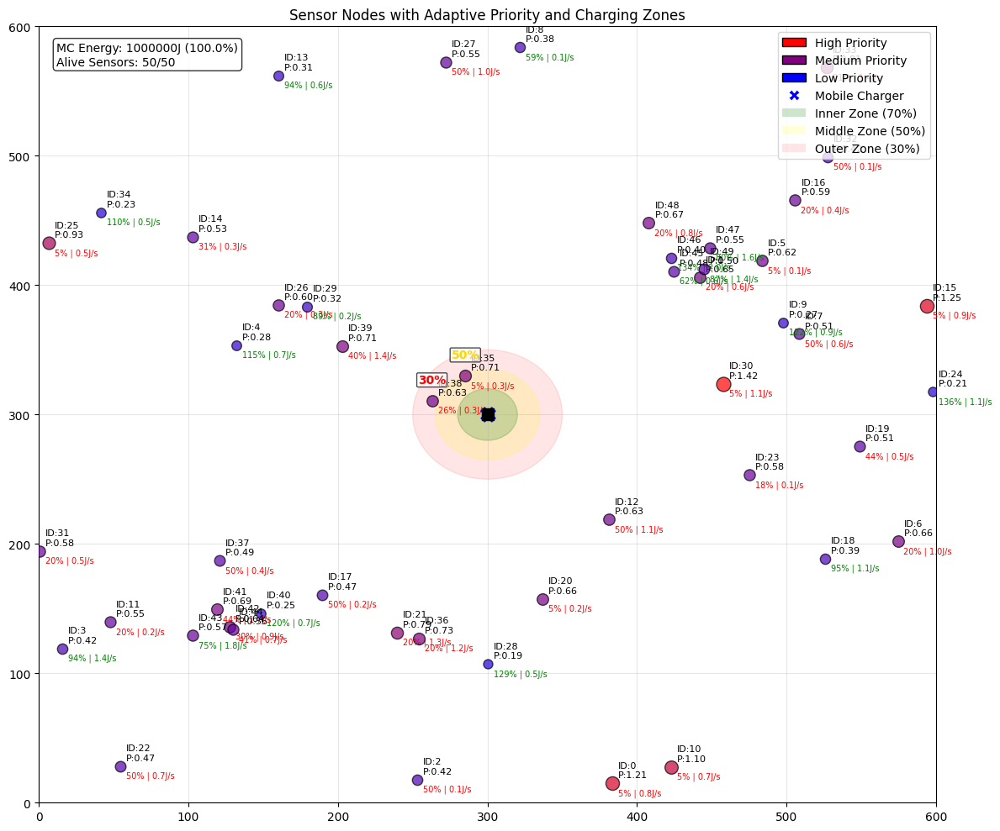

--- Step 1/6 --- MC Energy: 1000000.0J
Finding optimal position to charge 50 candidate sensors...
Found optimal position at (120.0, 150.0) with efficiency score 4077.32
This position would cover 6 sensors: [41, 42, 43, 44, 37, 40]


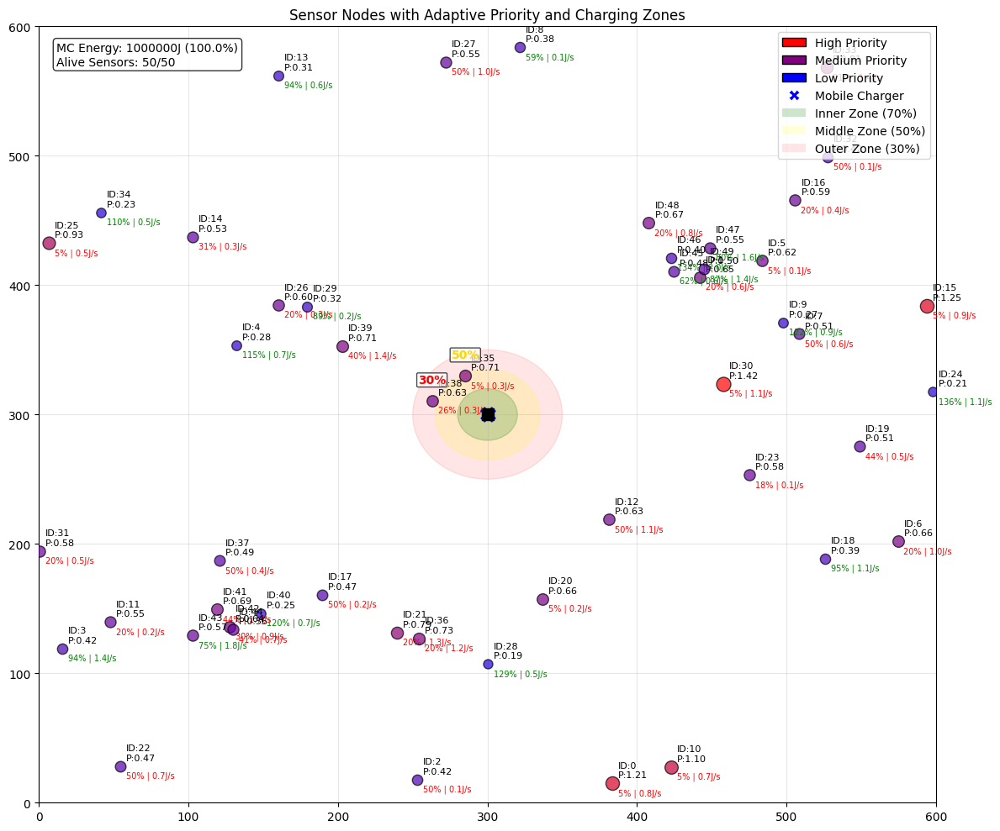

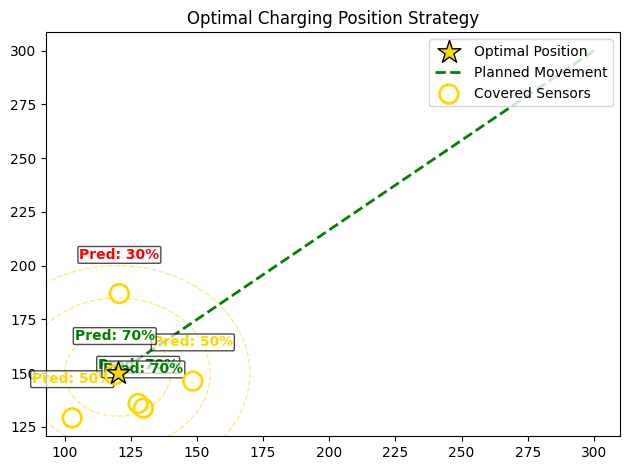

Charged 5 sensors with total 9401.47J
Sensor IDs charged: [37, 41, 42, 43, 44]
Visualizing network state after step 1...


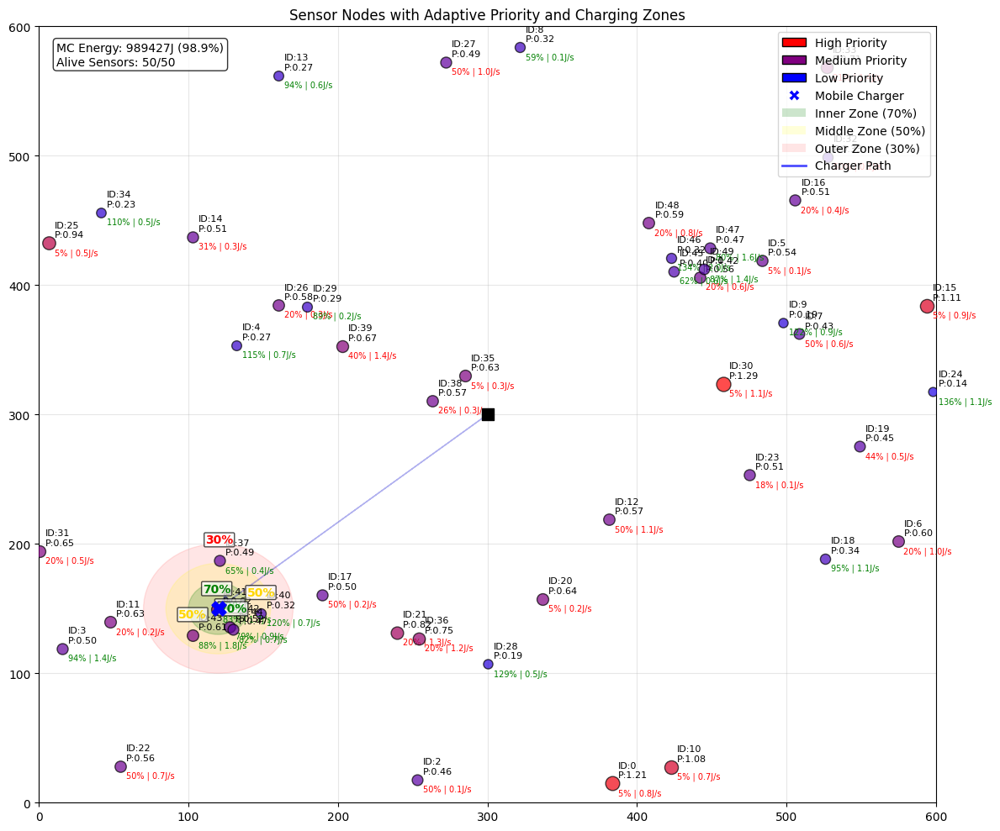

--- Step 2/6 --- MC Energy: 989427.0J
Finding optimal position to charge 49 candidate sensors...
Found optimal position at (240.0, 120.0) with efficiency score 4388.59
This position would cover 2 sensors: [21, 36]


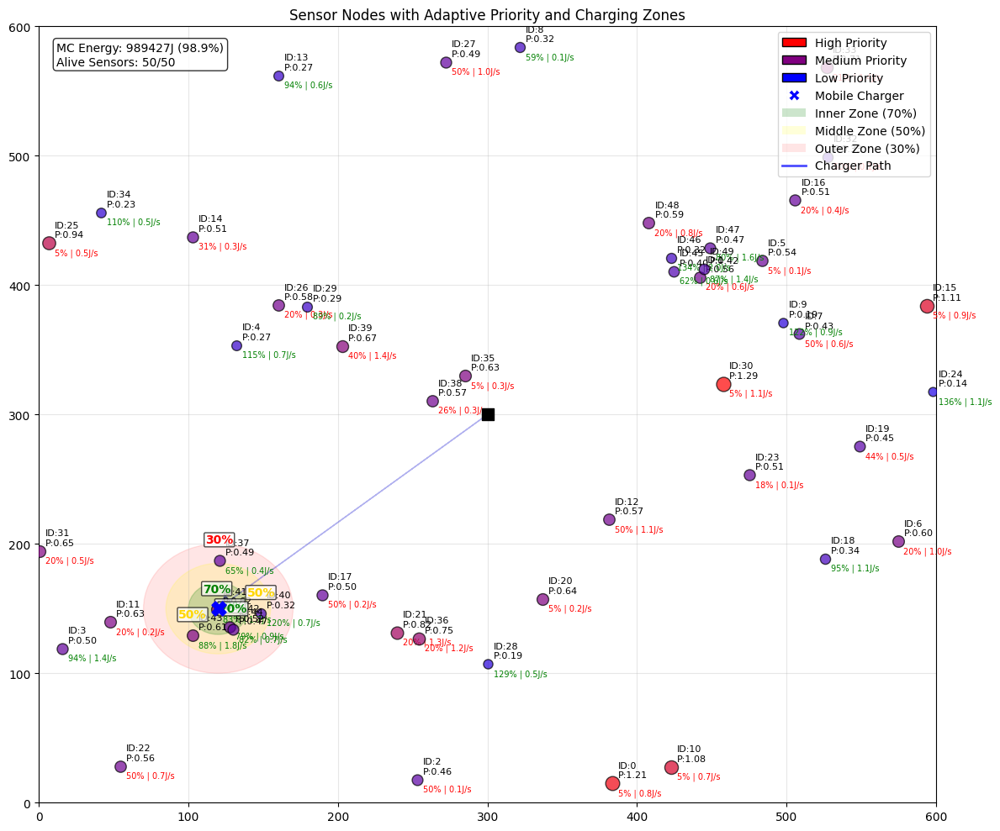

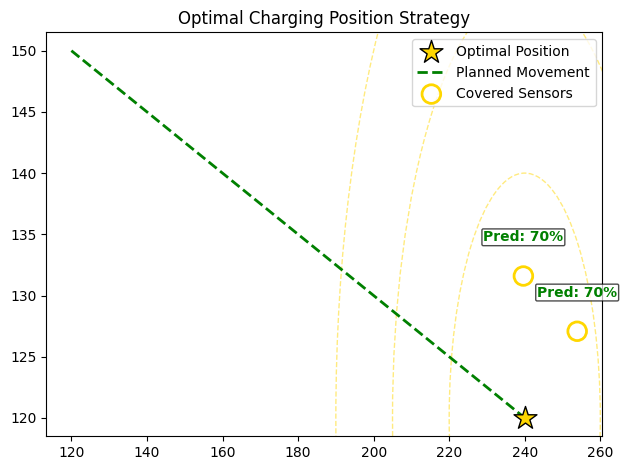

Charged 2 sensors with total 6725.16J
Sensor IDs charged: [21, 36]
Visualizing network state after step 2...


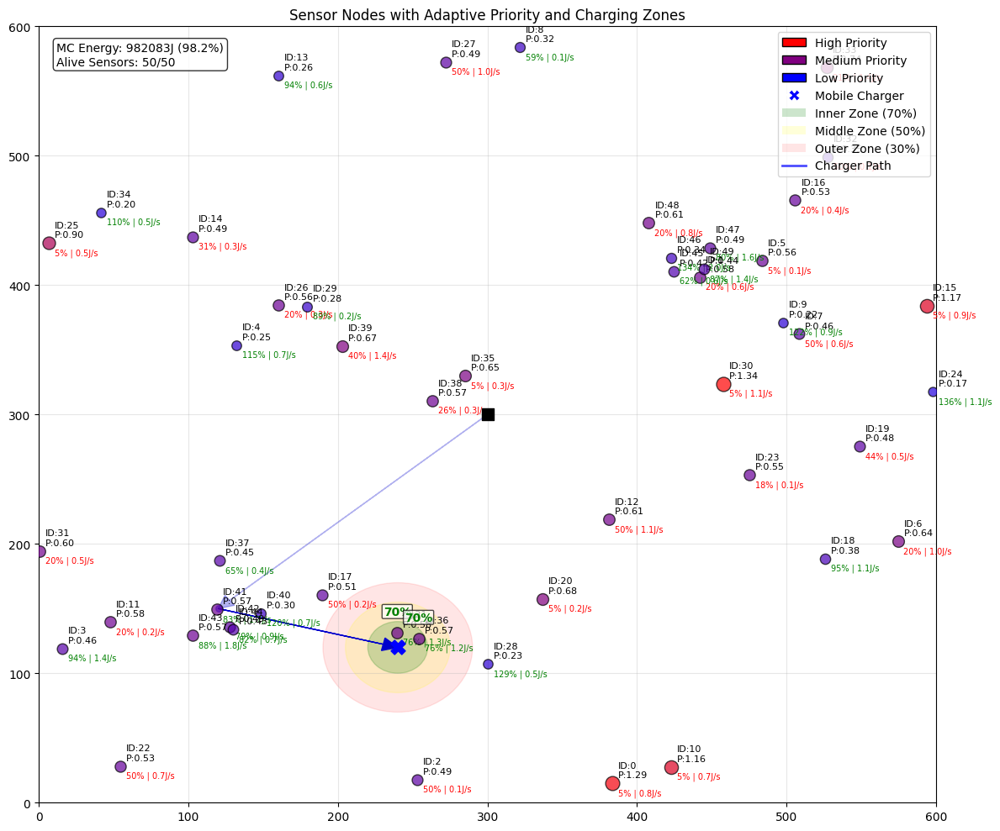

--- Step 3/6 --- MC Energy: 982083.4J
Finding optimal position to charge 50 candidate sensors...
Found optimal position at (390.0, 30.0) with efficiency score 4058.05
This position would cover 2 sensors: [0, 10]


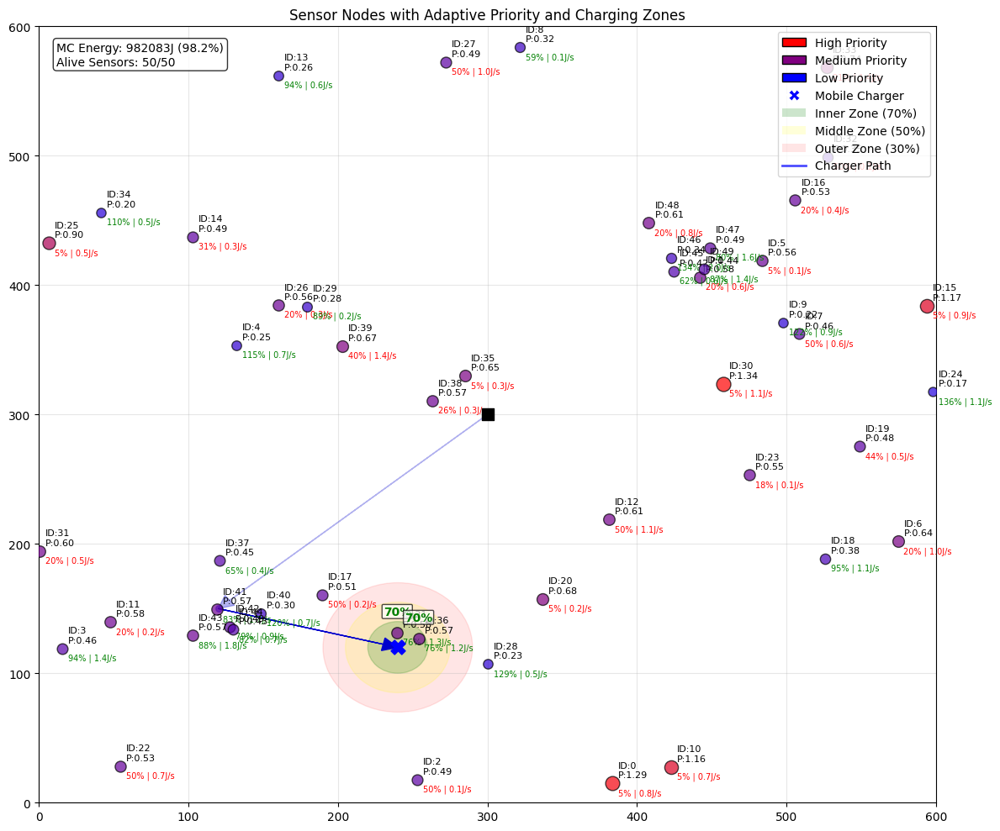

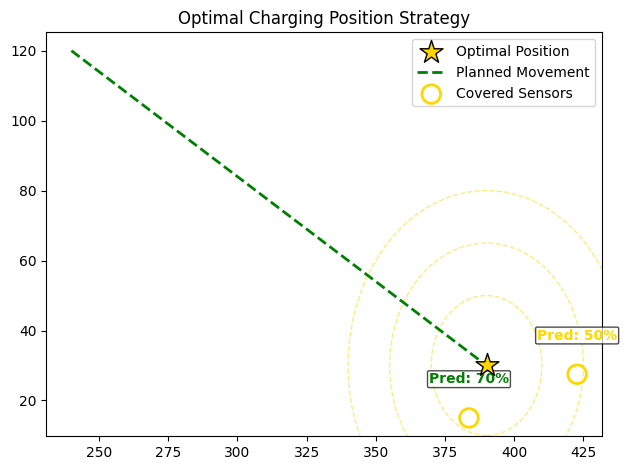

Charged 2 sensors with total 6845.61J
Sensor IDs charged: [0, 10]
Visualizing network state after step 3...


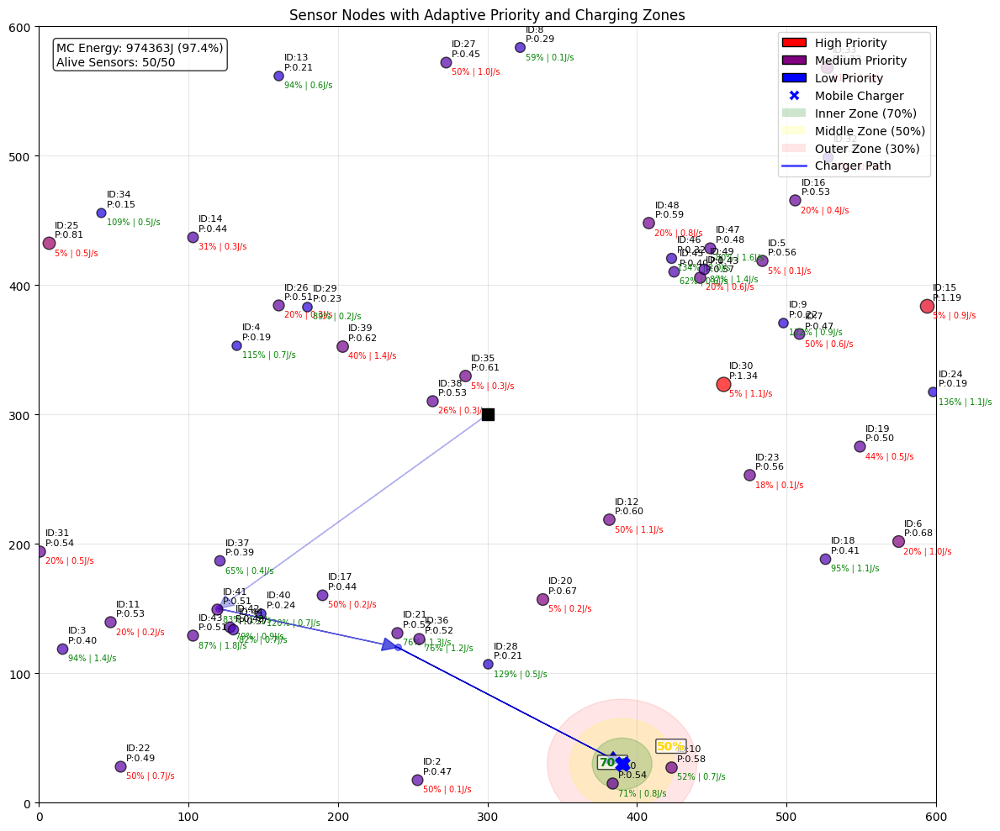

--- Step 4/6 --- MC Energy: 974363.1J
Finding optimal position to charge 49 candidate sensors...
Found optimal position at (450.0, 420.0) with efficiency score 3595.45
This position would cover 6 sensors: [1, 5, 47, 49, 45, 46]


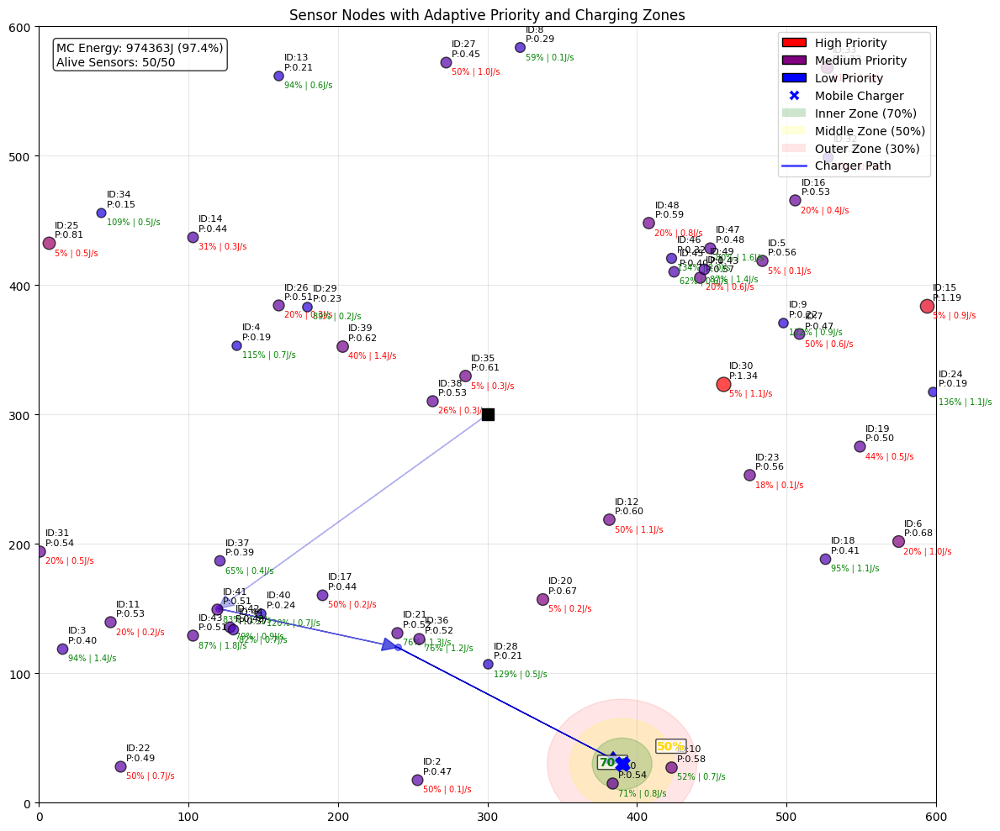

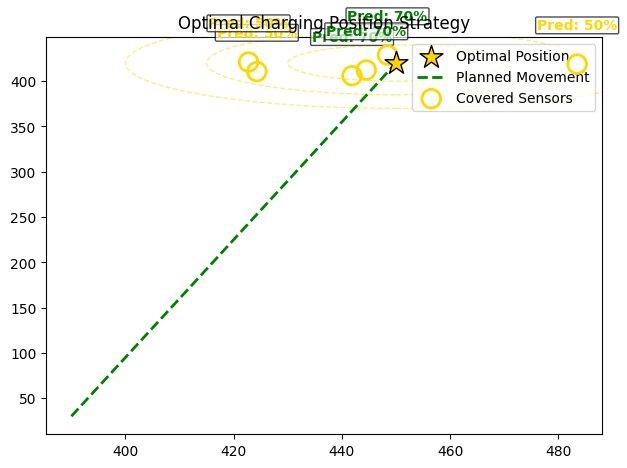

Charged 5 sensors with total 8725.58J
Sensor IDs charged: [1, 5, 45, 47, 49]
Visualizing network state after step 4...


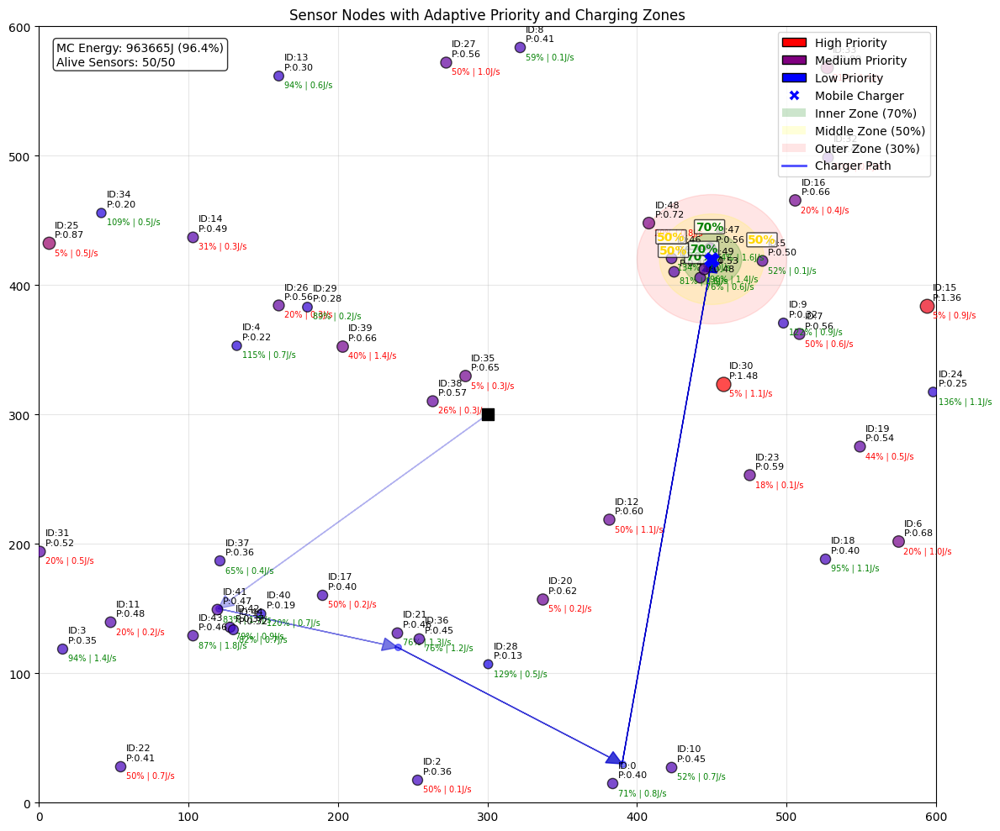

--- Step 5/6 --- MC Energy: 963664.6J
Finding optimal position to charge 49 candidate sensors...
Found optimal position at (270.0, 330.0) with efficiency score 3062.28
This position would cover 2 sensors: [35, 38]


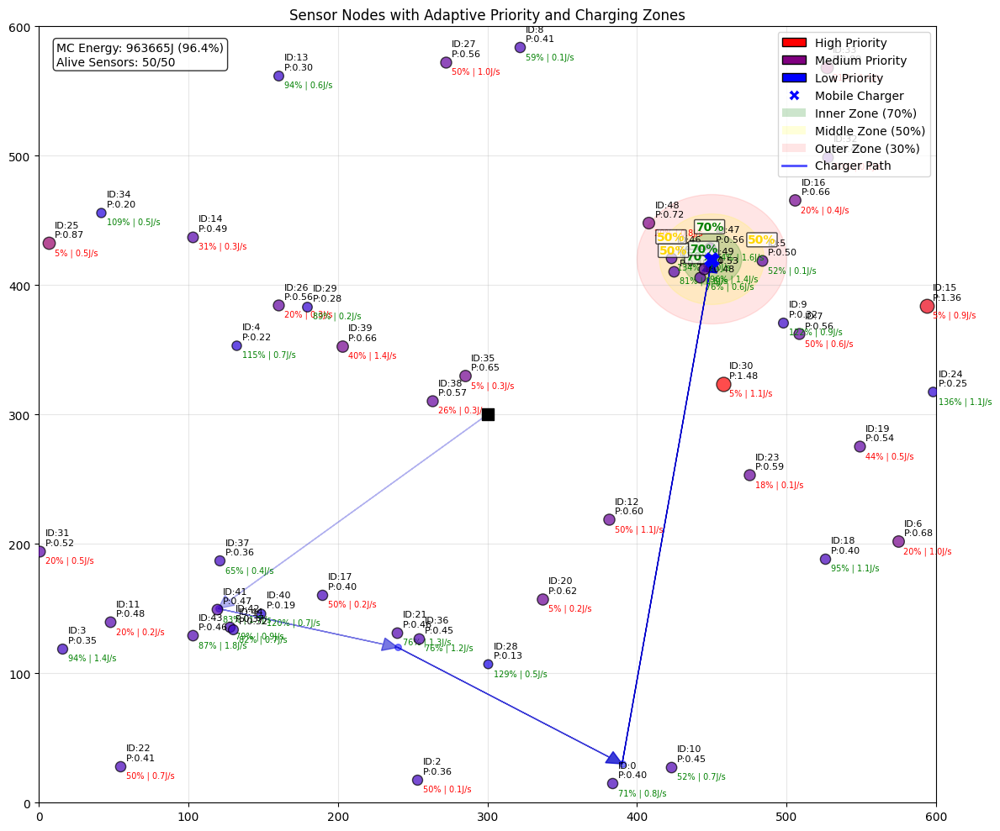

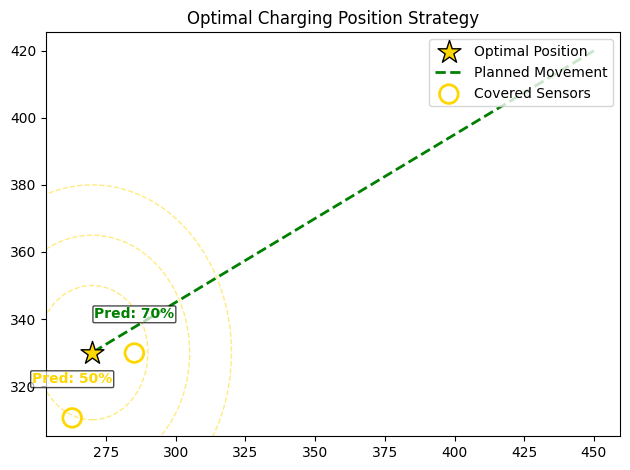

Charged 2 sensors with total 6222.17J
Sensor IDs charged: [35, 38]
Visualizing network state after step 5...


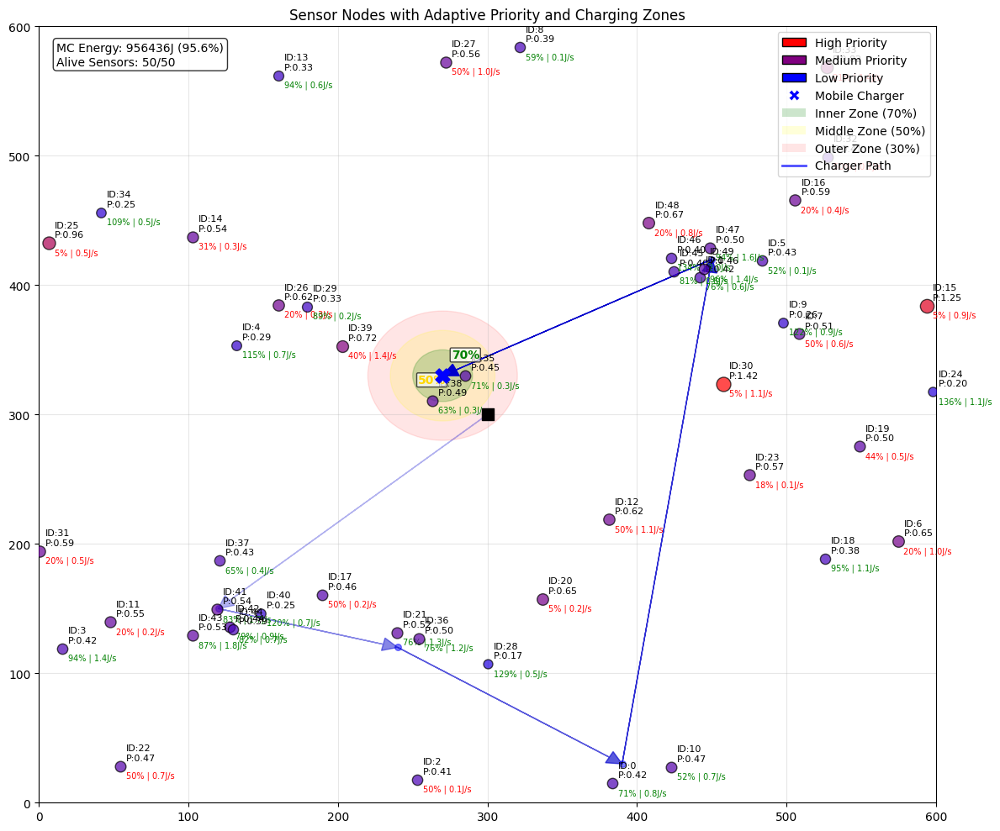

--- Step 6/6 --- MC Energy: 956436.2J
Finding optimal position to charge 50 candidate sensors...
Found optimal position at (450.0, 330.0) with efficiency score 2727.41
This position would cover 1 sensors: [30]


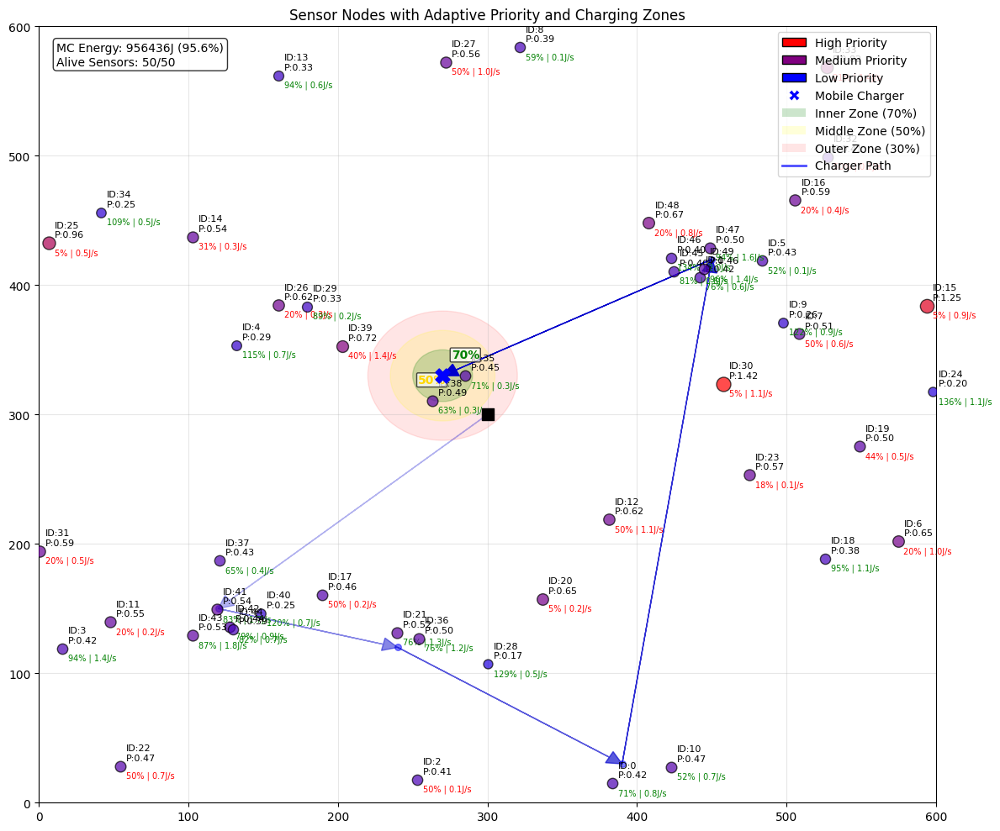

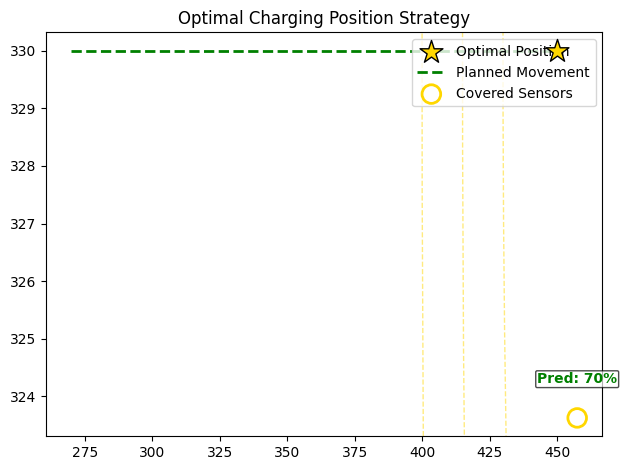

Charged 1 sensors with total 4001.50J
Sensor IDs charged: [30]
Visualizing network state after step 6...


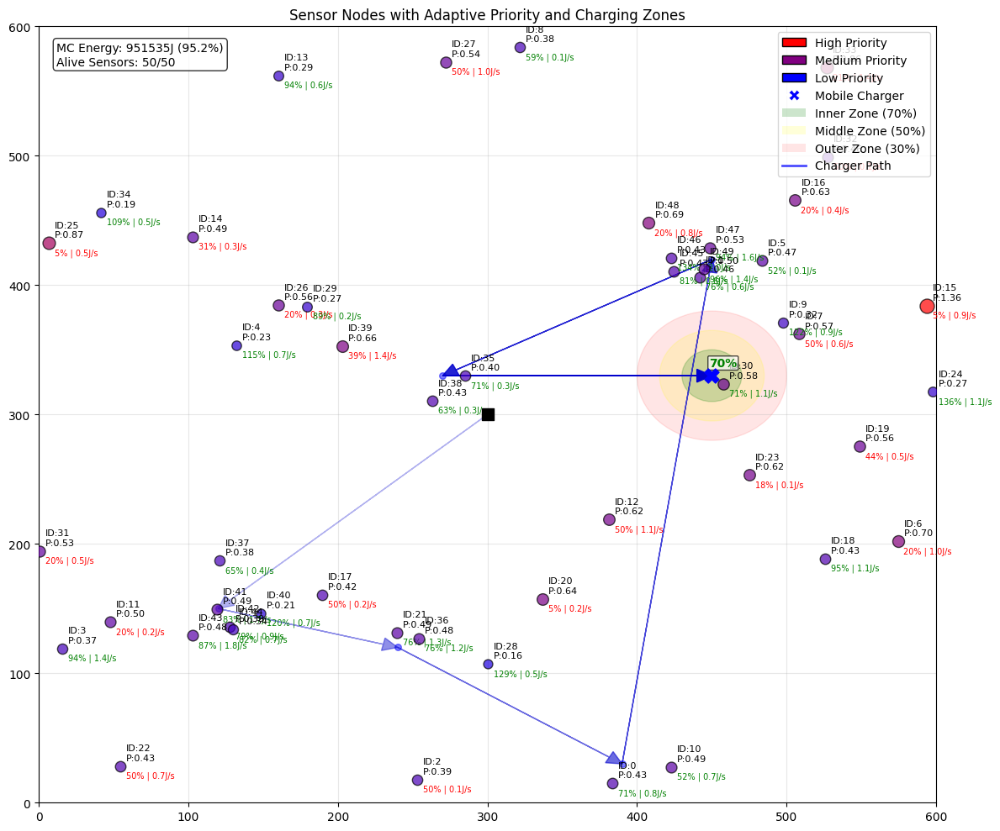


Simulation complete after 6 steps:
Total energy transferred: 41921.5J
Sensors dead: 0 out of 50
MC remaining energy: 951534.7J

Final network state with complete mobile charger path:


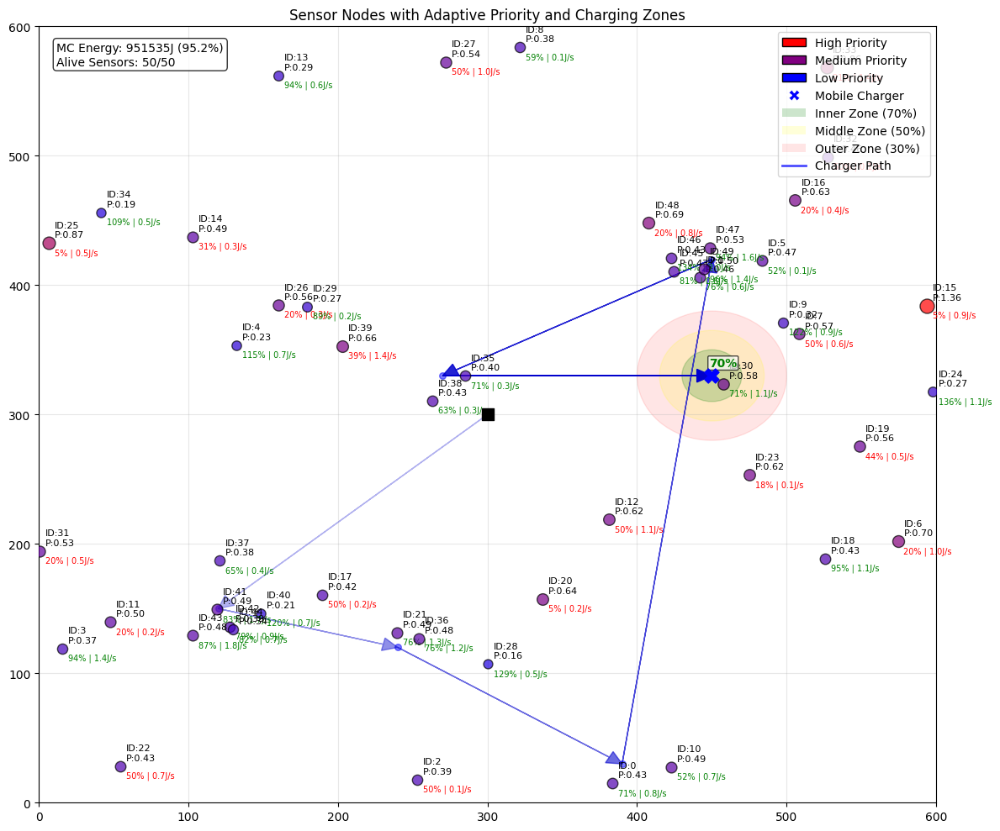

In [96]:
# Run simulation using the optimal position strategy
print("Running simulation with optimal position strategy...")
sensors, mc, path_history = run_optimal_position_simulation(
    num_steps=6,      # Fewer steps as this is more computationally intensive
    time_step=3,
    num_sensors=40
)

# Show final state
print("\nFinal network state with complete mobile charger path:")
visualize_sensor_priorities(sensors, mc, path_history)